# SURPRISE HOUSING: HOUSING PRICE PREDICTION 

#### <U>Problem Statement<U>:

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

- Which variables are important to predict the price of variable?
- How do these variables describe the price of the house?

#### <U>Business Goal<U>:

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

#### <U>Technical Requirements<U>:
    
- Data contains 1460 entries each having 81 variables.
- Data contains Null values. You need to treat them using the domain knowledge and your own understanding.
- Extensive EDA has to be performed to gain relationships of important variable and price.
- Data contains numerical as well as categorical variable. You need to handle them accordingly.
- You have to build Machine Learning models, apply regularization and determine the optimal values of Hyper Parameters.
- You need to find important features which affect the price positively or negatively.
- Two datasets are being provided to you (test.csv, train.csv). You will train on train.csv dataset and predict on test.csv file.
    
The “Data file.csv” and “Data description.txt” are enclosed with this file.

In [1]:
# importing required initial libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Reading csv file
df=pd.read_csv("train.csv")
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [3]:
# Checking the dimensions of the dataset
print('No. of Rows :',df.shape[0])
print('No. of Columns :', df.shape[1])
pd.set_option('display.max_columns',None) # This will enable us to see truncated columns
df.head()

No. of Rows : 1168
No. of Columns : 81


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


### Dataset Information:

- **Dataset has two CSV files, one for training model (train.csv) & other for testing dataset (test.csv)**
- **Training dataset contain 1168 Rows & 81 Columns**
- **SalePrice is the target column based on the problem statement**

### Dataset Features Description:

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM	Residential Medium Density
	
LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of road access to property

       Grvl	Gravel	
       Pave	Paved
       	
Alley: Type of alley access to property

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access
		
LotShape: General shape of property

       Reg	Regular	
       IR1	Slightly irregular
       IR2	Moderately Irregular
       IR3	Irregular
       
LandContour: Flatness of the property

       Lvl	Near Flat/Level	
       Bnk	Banked - Quick and significant rise from street grade to building
       HLS	Hillside - Significant slope from side to side
       Low	Depression
		
Utilities: Type of utilities available
		
       AllPub	All public Utilities (E,G,W,& S)	
       NoSewr	Electricity, Gas, and Water (Septic Tank)
       NoSeWa	Electricity and Gas Only
       ELO	Electricity only	
	
LotConfig: Lot configuration

       Inside	Inside lot
       Corner	Corner lot
       CulDSac	Cul-de-sac
       FR2	Frontage on 2 sides of property
       FR3	Frontage on 3 sides of property
	
LandSlope: Slope of property
		
       Gtl	Gentle slope
       Mod	Moderate Slope	
       Sev	Severe Slope
	
Neighborhood: Physical locations within Ames city limits

       Blmngtn	Bloomington Heights
       Blueste	Bluestem
       BrDale	Briardale
       BrkSide	Brookside
       ClearCr	Clear Creek
       CollgCr	College Creek
       Crawfor	Crawford
       Edwards	Edwards
       Gilbert	Gilbert
       IDOTRR	Iowa DOT and Rail Road
       MeadowV	Meadow Village
       Mitchel	Mitchell
       Names	North Ames
       NoRidge	Northridge
       NPkVill	Northpark Villa
       NridgHt	Northridge Heights
       NWAmes	Northwest Ames
       OldTown	Old Town
       SWISU	South & West of Iowa State University
       Sawyer	Sawyer
       SawyerW	Sawyer West
       Somerst	Somerset
       StoneBr	Stone Brook
       Timber	Timberland
       Veenker	Veenker
			
Condition1: Proximity to various conditions
	
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
Condition2: Proximity to various conditions (if more than one is present)
		
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
BldgType: Type of dwelling
		
       1Fam	Single-family Detached	
       2FmCon	Two-family Conversion; originally built as one-family dwelling
       Duplx	Duplex
       TwnhsE	Townhouse End Unit
       TwnhsI	Townhouse Inside Unit
	
HouseStyle: Style of dwelling
	
       1Story	One story
       1.5Fin	One and one-half story: 2nd level finished
       1.5Unf	One and one-half story: 2nd level unfinished
       2Story	Two story
       2.5Fin	Two and one-half story: 2nd level finished
       2.5Unf	Two and one-half story: 2nd level unfinished
       SFoyer	Split Foyer
       SLvl	Split Level
	
OverallQual: Rates the overall material and finish of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average
       5	Average
       4	Below Average
       3	Fair
       2	Poor
       1	Very Poor
	
OverallCond: Rates the overall condition of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average	
       5	Average
       4	Below Average	
       3	Fair
       2	Poor
       1	Very Poor
		
YearBuilt: Original construction date

YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)

RoofStyle: Type of roof

       Flat	Flat
       Gable	Gable
       Gambrel	Gabrel (Barn)
       Hip	Hip
       Mansard	Mansard
       Shed	Shed
		
RoofMatl: Roof material

       ClyTile	Clay or Tile
       CompShg	Standard (Composite) Shingle
       Membran	Membrane
       Metal	Metal
       Roll	Roll
       Tar&Grv	Gravel & Tar
       WdShake	Wood Shakes
       WdShngl	Wood Shingles
		
Exterior1st: Exterior covering on house

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast	
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
Exterior2nd: Exterior covering on house (if more than one material)

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
MasVnrType: Masonry veneer type

       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone
	
MasVnrArea: Masonry veneer area in square feet

ExterQual: Evaluates the quality of the material on the exterior 
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
ExterCond: Evaluates the present condition of the material on the exterior
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
Foundation: Type of foundation
		
       BrkTil	Brick & Tile
       CBlock	Cinder Block
       PConc	Poured Contrete	
       Slab	Slab
       Stone	Stone
       Wood	Wood
		
BsmtQual: Evaluates the height of the basement

       Ex	Excellent (100+ inches)	
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches
       NA	No Basement
		
BsmtCond: Evaluates the general condition of the basement

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement
	
BsmtExposure: Refers to walkout or garden level walls

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement
	
BsmtFinType1: Rating of basement finished area

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement
		
BsmtFinSF1: Type 1 finished square feet

BsmtFinType2: Rating of basement finished area (if multiple types)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

BsmtFinSF2: Type 2 finished square feet

BsmtUnfSF: Unfinished square feet of basement area

TotalBsmtSF: Total square feet of basement area

Heating: Type of heating
		
       Floor	Floor Furnace
       GasA	Gas forced warm air furnace
       GasW	Gas hot water or steam heat
       Grav	Gravity furnace	
       OthW	Hot water or steam heat other than gas
       Wall	Wall furnace
		
HeatingQC: Heating quality and condition

       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
CentralAir: Central air conditioning

       N	No
       Y	Yes
		
Electrical: Electrical system

       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed
		
1stFlrSF: First Floor square feet
 
2ndFlrSF: Second floor square feet

LowQualFinSF: Low quality finished square feet (all floors)

GrLivArea: Above grade (ground) living area square feet

BsmtFullBath: Basement full bathrooms

BsmtHalfBath: Basement half bathrooms

FullBath: Full bathrooms above grade

HalfBath: Half baths above grade

Bedroom: Bedrooms above grade (does NOT include basement bedrooms)

Kitchen: Kitchens above grade

KitchenQual: Kitchen quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       	
TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

Functional: Home functionality (Assume typical unless deductions are warranted)

       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only
		
Fireplaces: Number of fireplaces

FireplaceQu: Fireplace quality

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
		
GarageType: Garage location
		
       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage
		
GarageYrBlt: Year garage was built
		
GarageFinish: Interior finish of the garage

       Fin	Finished
       RFn	Rough Finished	
       Unf	Unfinished
       NA	No Garage
		
GarageCars: Size of garage in car capacity

GarageArea: Size of garage in square feet

GarageQual: Garage quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
GarageCond: Garage condition

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
PavedDrive: Paved driveway

       Y	Paved 
       P	Partial Pavement
       N	Dirt/Gravel
		
WoodDeckSF: Wood deck area in square feet

OpenPorchSF: Open porch area in square feet

EnclosedPorch: Enclosed porch area in square feet

3SsnPorch: Three season porch area in square feet

ScreenPorch: Screen porch area in square feet

PoolArea: Pool area in square feet

PoolQC: Pool quality
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool
		
Fence: Fence quality
		
       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence
	
MiscFeature: Miscellaneous feature not covered in other categories
		
       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None
		
MiscVal: $Value of miscellaneous feature

MoSold: Month Sold (MM)

YrSold: Year Sold (YYYY)

SaleType: Type of sale
		
       WD 	Warranty Deed - Conventional
       CWD	Warranty Deed - Cash
       VWD	Warranty Deed - VA Loan
       New	Home just constructed and sold
       COD	Court Officer Deed/Estate
       Con	Contract 15% Down payment regular terms
       ConLw	Contract Low Down payment and low interest
       ConLI	Contract Low Interest
       ConLD	Contract Low Down
       Oth	Other
		
SaleCondition: Condition of sale

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)



In [4]:
# Sorting the columns based on the datatype
df.columns.to_series().groupby(df.dtypes).groups

{int64: ['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'], float64: ['LotFrontage', 'MasVnrArea', 'GarageYrBlt'], object: ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'Garage

#### Observations: ####
- **There are int, float and object data types available in the dataset**
- **There are some features with int data type but still we can consider them as categorical data, which will be identified in next steps for easy EDA**

In [5]:
# Getting count of different datatypes of the dataframe
df.dtypes.value_counts()

object     43
int64      35
float64     3
dtype: int64

#### Observations: ####
- **No. of object datatypes: 43**
- **No. of float datatypes: 3**
- **No. of int datatypes: 35**

# Data Integrity Check

### Checking for the presense of any whitespaces, '?', 'NA', '-' in the dataset

In [6]:
df.isin(['NA','N/A','-',' ','?',' ?']).sum().any()

False

#### Observations:
- **No White spaces, 'NA', 'N/A', '-', '?', ' ?' present in the dataframe**

### Duplicate Values Check

In [7]:
df.duplicated().sum()

0

In [8]:
duplicate = df[df.duplicated()]
 
print("Duplicate Rows :")
 
# Print the resultant Dataframe
duplicate

Duplicate Rows :


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


#### Observations: 
- **No duplicate values present in the dataframe**

### Start with Enlisting Value counts & Sub-categories of different categorial features available

In [9]:
df_categorical=['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
                'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 
                'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 
                'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 
                'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 
                'MiscFeature', 'SaleType', 'SaleCondition']

for i in df_categorical:
    length=df[i].nunique()
    name=[]
    value_count=[]
    percent_value_count=[]
    print('\033[1m'+i,'Values Count'+'\033[0m')
    for j in range(length):
        name.append(df[i].value_counts().index.values[j])
        value_count.append((df[i].value_counts())[j])
        percent_value_count.append(round(((df[i].value_counts())[j])*100/(df[i].value_counts().sum()),1))
    df_value_count=pd.DataFrame({'Value':name,'Count':value_count,'% Count': percent_value_count})
    display(df_value_count)
    print("="*100)

MSZoning Values Count


,Value,Count,% Count
0,RL,928,79.5
1,RM,163,14.0
2,FV,52,4.5
3,RH,16,1.4
4,C (all),9,0.8


Street Values Count


,Value,Count,% Count
0,Pave,1164,99.7
1,Grvl,4,0.3


Alley Values Count


,Value,Count,% Count
0,Grvl,41,53.2
1,Pave,36,46.8


LotShape Values Count


,Value,Count,% Count
0,Reg,740,63.4
1,IR1,390,33.4
2,IR2,32,2.7
3,IR3,6,0.5


LandContour Values Count


,Value,Count,% Count
0,Lvl,1046,89.6
1,Bnk,50,4.3
2,HLS,42,3.6
3,Low,30,2.6


Utilities Values Count


,Value,Count,% Count
0,AllPub,1168,100.0


LotConfig Values Count


,Value,Count,% Count
0,Inside,842,72.1
1,Corner,222,19.0
2,CulDSac,69,5.9
3,FR2,33,2.8
4,FR3,2,0.2


LandSlope Values Count


,Value,Count,% Count
0,Gtl,1105,94.6
1,Mod,51,4.4
2,Sev,12,1.0


Neighborhood Values Count


,Value,Count,% Count
0,NAmes,182,15.6
1,CollgCr,118,10.1
2,OldTown,86,7.4
3,Edwards,83,7.1
4,Somerst,68,5.8
5,Gilbert,64,5.5
6,NridgHt,61,5.2
7,Sawyer,60,5.1
8,NWAmes,59,5.1
9,SawyerW,51,4.4


Condition1 Values Count


,Value,Count,% Count
0,Norm,1005,86.0
1,Feedr,67,5.7
2,Artery,38,3.3
3,RRAn,20,1.7
4,PosN,17,1.5
5,RRAe,9,0.8
6,PosA,6,0.5
7,RRNn,4,0.3
8,RRNe,2,0.2


Condition2 Values Count


,Value,Count,% Count
0,Norm,1154,98.8
1,Feedr,6,0.5
2,PosN,2,0.2
3,Artery,2,0.2
4,RRAe,1,0.1
5,RRNn,1,0.1
6,PosA,1,0.1
7,RRAn,1,0.1


BldgType Values Count


,Value,Count,% Count
0,1Fam,981,84.0
1,TwnhsE,90,7.7
2,Duplex,41,3.5
3,Twnhs,29,2.5
4,2fmCon,27,2.3


HouseStyle Values Count


,Value,Count,% Count
0,1Story,578,49.5
1,2Story,361,30.9
2,1.5Fin,121,10.4
3,SLvl,47,4.0
4,SFoyer,32,2.7
5,1.5Unf,12,1.0
6,2.5Unf,10,0.9
7,2.5Fin,7,0.6


RoofStyle Values Count


,Value,Count,% Count
0,Gable,915,78.3
1,Hip,225,19.3
2,Flat,12,1.0
3,Gambrel,9,0.8
4,Mansard,5,0.4
5,Shed,2,0.2


RoofMatl Values Count


,Value,Count,% Count
0,CompShg,1144,97.9
1,Tar&Grv,10,0.9
2,WdShngl,6,0.5
3,WdShake,4,0.3
4,Roll,1,0.1
5,ClyTile,1,0.1
6,Metal,1,0.1
7,Membran,1,0.1


Exterior1st Values Count


,Value,Count,% Count
0,VinylSd,396,33.9
1,HdBoard,179,15.3
2,MetalSd,178,15.2
3,Wd Sdng,174,14.9
4,Plywood,93,8.0
5,CemntBd,42,3.6
6,BrkFace,41,3.5
7,Stucco,22,1.9
8,WdShing,19,1.6
9,AsbShng,19,1.6


Exterior2nd Values Count


,Value,Count,% Count
0,VinylSd,387,33.1
1,MetalSd,173,14.8
2,HdBoard,170,14.6
3,Wd Sdng,165,14.1
4,Plywood,118,10.1
5,CmentBd,42,3.6
6,Wd Shng,31,2.7
7,Stucco,23,2.0
8,BrkFace,20,1.7
9,AsbShng,18,1.5


MasVnrType Values Count


,Value,Count,% Count
0,None,696,59.9
1,BrkFace,354,30.5
2,Stone,98,8.4
3,BrkCmn,13,1.1


ExterQual Values Count


,Value,Count,% Count
0,TA,717,61.4
1,Gd,397,34.0
2,Ex,43,3.7
3,Fa,11,0.9


ExterCond Values Count


,Value,Count,% Count
0,TA,1022,87.5
1,Gd,117,10.0
2,Fa,26,2.2
3,Ex,2,0.2
4,Po,1,0.1


Foundation Values Count


,Value,Count,% Count
0,CBlock,516,44.2
1,PConc,513,43.9
2,BrkTil,112,9.6
3,Slab,21,1.8
4,Stone,5,0.4
5,Wood,1,0.1


BsmtQual Values Count


,Value,Count,% Count
0,TA,517,45.4
1,Gd,498,43.8
2,Ex,94,8.3
3,Fa,29,2.5


BsmtCond Values Count


,Value,Count,% Count
0,TA,1041,91.5
1,Gd,56,4.9
2,Fa,39,3.4
3,Po,2,0.2


BsmtExposure Values Count


,Value,Count,% Count
0,No,756,66.5
1,Av,180,15.8
2,Gd,108,9.5
3,Mn,93,8.2


BsmtFinType1 Values Count


,Value,Count,% Count
0,Unf,345,30.3
1,GLQ,330,29.0
2,ALQ,174,15.3
3,BLQ,121,10.6
4,Rec,109,9.6
5,LwQ,59,5.2


BsmtFinType2 Values Count


,Value,Count,% Count
0,Unf,1002,88.1
1,Rec,43,3.8
2,LwQ,40,3.5
3,BLQ,24,2.1
4,ALQ,16,1.4
5,GLQ,12,1.1


Heating Values Count


,Value,Count,% Count
0,GasA,1143,97.9
1,GasW,14,1.2
2,Grav,5,0.4
3,Wall,4,0.3
4,Floor,1,0.1
5,OthW,1,0.1


HeatingQC Values Count


,Value,Count,% Count
0,Ex,585,50.1
1,TA,352,30.1
2,Gd,192,16.4
3,Fa,38,3.3
4,Po,1,0.1


CentralAir Values Count


,Value,Count,% Count
0,Y,1090,93.3
1,N,78,6.7


Electrical Values Count


,Value,Count,% Count
0,SBrkr,1070,91.6
1,FuseA,74,6.3
2,FuseF,21,1.8
3,FuseP,2,0.2
4,Mix,1,0.1


KitchenQual Values Count


,Value,Count,% Count
0,TA,578,49.5
1,Gd,478,40.9
2,Ex,82,7.0
3,Fa,30,2.6


Functional Values Count


,Value,Count,% Count
0,Typ,1085,92.9
1,Min2,30,2.6
2,Min1,25,2.1
3,Mod,12,1.0
4,Maj1,11,0.9
5,Maj2,4,0.3
6,Sev,1,0.1


FireplaceQu Values Count


,Value,Count,% Count
0,Gd,301,48.8
1,TA,252,40.8
2,Fa,25,4.1
3,Ex,21,3.4
4,Po,18,2.9


GarageType Values Count


,Value,Count,% Count
0,Attchd,691,62.6
1,Detchd,314,28.4
2,BuiltIn,70,6.3
3,Basment,16,1.4
4,CarPort,8,0.7
5,2Types,5,0.5


GarageFinish Values Count


,Value,Count,% Count
0,Unf,487,44.1
1,RFn,339,30.7
2,Fin,278,25.2


GarageQual Values Count


,Value,Count,% Count
0,TA,1050,95.1
1,Fa,39,3.5
2,Gd,11,1.0
3,Ex,2,0.2
4,Po,2,0.2


GarageCond Values Count


,Value,Count,% Count
0,TA,1061,96.1
1,Fa,28,2.5
2,Gd,8,0.7
3,Po,6,0.5
4,Ex,1,0.1


PavedDrive Values Count


,Value,Count,% Count
0,Y,1071,91.7
1,N,74,6.3
2,P,23,2.0


PoolQC Values Count


,Value,Count,% Count
0,Gd,3,42.9
1,Ex,2,28.6
2,Fa,2,28.6


Fence Values Count


,Value,Count,% Count
0,MnPrv,129,54.4
1,GdPrv,51,21.5
2,GdWo,47,19.8
3,MnWw,10,4.2


MiscFeature Values Count


,Value,Count,% Count
0,Shed,40,90.9
1,Gar2,2,4.5
2,TenC,1,2.3
3,Othr,1,2.3


SaleType Values Count


,Value,Count,% Count
0,WD,999,85.5
1,New,106,9.1
2,COD,38,3.3
3,ConLD,8,0.7
4,ConLI,5,0.4
5,ConLw,4,0.3
6,Oth,3,0.3
7,CWD,3,0.3
8,Con,2,0.2


SaleCondition Values Count


,Value,Count,% Count
0,Normal,945,80.9
1,Partial,108,9.2
2,Abnorml,81,6.9
3,Family,18,1.5
4,Alloca,12,1.0
5,AdjLand,4,0.3


### Null Values Handling

In [10]:
df.isnull().sum().sum() # Checking the sum of null values for all columns

5558

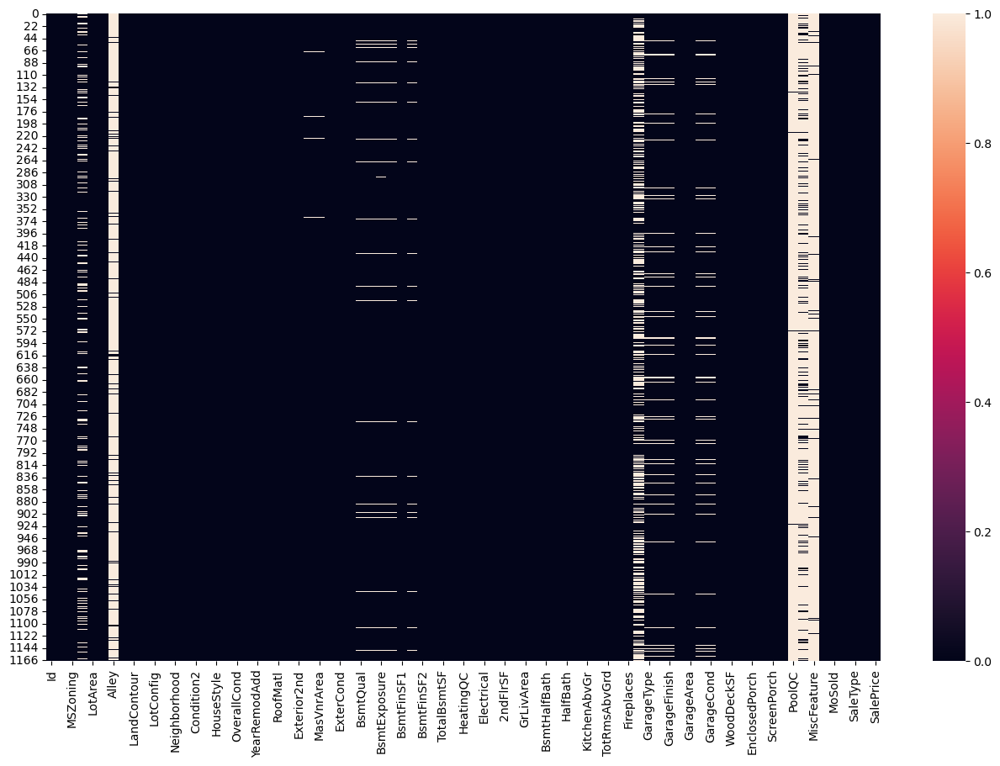

In [11]:
# Heatmap plot with null values
sns.set_palette('coolwarm_r')
plt.figure(figsize = (16,10))
sns.heatmap(df.isnull())
plt.show()

In [12]:
#Finding the percentage of data missing from the dataset
pd.set_option('display.max_rows',None) 
missing_values = df.isnull().sum()
percentage_missing_values =round((missing_values/len(df))*100,1)
dtyp=df.dtypes
null_values=pd.concat([dtyp,missing_values, percentage_missing_values], axis =1, keys =['Data Type','Missing Values', '% Missing data'])
print("Missing Values")
df_null=null_values.sort_values(by=["% Missing data"],ascending=False)
df_null=df_null.reset_index(drop=False)
df_null

Missing Values


,index,Data Type,Missing Values,% Missing data
0,PoolQC,object,1161,99.4
1,MiscFeature,object,1124,96.2
2,Alley,object,1091,93.4
3,Fence,object,931,79.7
4,FireplaceQu,object,551,47.2
5,LotFrontage,float64,214,18.3
6,GarageYrBlt,float64,64,5.5
7,GarageFinish,object,64,5.5
8,GarageType,object,64,5.5
9,GarageQual,object,64,5.5


#### Observation:
- **Null values are present in 18 columns out of 81 columns**
- **Columns 'PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu' have more than 45% of null values hence dropping these columns**
- **For remaining columns with null values, I will use 'mode' to replace null values for categorical variables and 'median' to replace null values for numerical variables.**

#### Dropping columns 'PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu' from the dataset

In [13]:
df.drop(['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu'],axis=1,inplace=True)

##### Missing Values Imputation

In [14]:
# Segregating colums with null values based on the datatype
df_null_cat=['GarageFinish','GarageType','GarageQual','GarageCond','BsmtExposure','BsmtFinType2','BsmtQual','BsmtCond','BsmtFinType1','MasVnrType']
df_null_num=['LotFrontage','GarageYrBlt','MasVnrArea']

In [15]:
# Filling null values of columns with categorical data with first value of 'mode'
for i in df_null_cat:
    if (df[i].dtype=='O' and df[i].isnull().sum()!=0):
        df[i]=df[i].fillna(df[i].mode()[0])

In [16]:
# Filling null values of columns with numerical data with 'median' as 'mean' can be sensitive to outliers
for i in df_null_num:
    if (df[i].dtype=='float64' and df[i].isnull().sum()!=0):
        df[i]=df[i].fillna(df[i].median())

print(df.isnull().sum().sum())

0


#### Observations:
- **No null values in the dataframe after imputation**

In [17]:
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,70.0,4928,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,2010,COD,Normal,190000
4,422,20,RL,70.0,16635,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,0,11,2006,New,Partial,219210
6,561,20,RL,70.0,11341,Pave,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,Detchd,1947.0,Unf,1,336,TA,TA,Y,158,0,102,0,0,0,0,10,2008,COD,Abnorml,118500


# Segregating columns based on data type for better EDA

In [18]:
df.shape

(1168, 76)

In [19]:
# Sorting the columns based on the datatype
df.columns.to_series().groupby(df.dtypes).groups

{int64: ['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'], float64: ['LotFrontage', 'MasVnrArea', 'GarageYrBlt'], object: ['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', '

**Checking the actual data values in "int" datatype to identify if any 'categorical' data exist in 'int' data and segregate it for easy data analysis using the below steps**

In [20]:
# All 'int' datatype columns in the dataset
int_col=['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
df_int=df[int_col]
df_int.head(5)

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,127,120,4928,6,5,1976,1976,120,0,958,1078,958,0,0,958,0,0,2,0,2,1,5,1,2,440,0,205,0,0,0,0,0,2,2007,128000
1,889,20,15865,8,6,1970,1970,351,823,1043,2217,2217,0,0,2217,1,0,2,0,4,1,8,1,2,621,81,207,0,0,224,0,0,10,2007,268000
2,793,60,9920,7,5,1996,1997,862,0,255,1117,1127,886,0,2013,1,0,2,1,3,1,8,1,2,455,180,130,0,0,0,0,0,6,2007,269790
3,110,20,11751,6,6,1977,1977,705,0,1139,1844,1844,0,0,1844,0,0,2,0,3,1,7,1,2,546,0,122,0,0,0,0,0,1,2010,190000
4,422,20,16635,6,7,1977,2000,1246,0,356,1602,1602,0,0,1602,0,1,2,0,3,1,8,1,2,529,240,0,0,0,0,0,0,6,2009,215000


In [21]:
# Taking a closer look at "int" data to understand the variables better
for i in int_col:
    length=df[i].nunique()
    name=[]
    value_count=[]
    percent_value_count=[]
    print('\033[1m'+i,'Values Count'+'\033[0m')
    for j in range(length):
        name.append(df[i].value_counts().index.values[j])
        value_count.append((df[i].value_counts()).iloc[j])
        percent_value_count.append(round(((df[i].value_counts()).iloc[j])*100/(df[i].value_counts().sum()),1))
    df_value_count=pd.DataFrame({'Value':name,'Count':value_count,'% Count': percent_value_count})
    display(df_value_count)
    print("="*100)

Id Values Count


,Value,Count,% Count
0,127,1,0.1
1,1391,1,0.1
2,1389,1,0.1
3,448,1,0.1
4,1179,1,0.1
5,821,1,0.1
6,178,1,0.1
7,1076,1,0.1
8,60,1,0.1
9,733,1,0.1


MSSubClass Values Count


,Value,Count,% Count
0,20,428,36.6
1,60,244,20.9
2,50,113,9.7
3,120,69,5.9
4,70,53,4.5
5,30,52,4.5
6,160,47,4.0
7,80,43,3.7
8,90,41,3.5
9,190,26,2.2


LotArea Values Count


,Value,Count,% Count
0,9600,21,1.8
1,7200,18,1.5
2,6000,16,1.4
3,8400,14,1.2
4,9000,11,0.9
5,10800,11,0.9
6,8125,7,0.6
7,6120,7,0.6
8,7500,6,0.5
9,6240,6,0.5


OverallQual Values Count


,Value,Count,% Count
0,5,314,26.9
1,6,295,25.3
2,7,260,22.3
3,8,138,11.8
4,4,93,8.0
5,9,32,2.7
6,3,16,1.4
7,10,15,1.3
8,2,3,0.3
9,1,2,0.2


OverallCond Values Count


,Value,Count,% Count
0,5,640,54.8
1,6,209,17.9
2,7,172,14.7
3,8,61,5.2
4,4,43,3.7
5,3,21,1.8
6,9,16,1.4
7,2,5,0.4
8,1,1,0.1


YearBuilt Values Count


,Value,Count,% Count
0,2006,57,4.9
1,2005,51,4.4
2,2007,41,3.5
3,2004,37,3.2
4,2003,33,2.8
5,1977,25,2.1
6,1976,23,2.0
7,1920,22,1.9
8,1959,21,1.8
9,2002,20,1.7


YearRemodAdd Values Count


,Value,Count,% Count
0,1950,146,12.5
1,2006,82,7.0
2,2007,64,5.5
3,2005,57,4.9
4,2004,46,3.9
5,2000,44,3.8
6,2002,41,3.5
7,2003,37,3.2
8,1996,31,2.7
9,2008,30,2.6


BsmtFinSF1 Values Count


,Value,Count,% Count
0,0,375,32.1
1,24,10,0.9
2,16,8,0.7
3,20,5,0.4
4,616,5,0.4
5,560,4,0.3
6,504,4,0.3
7,655,4,0.3
8,600,4,0.3
9,641,4,0.3


BsmtFinSF2 Values Count


,Value,Count,% Count
0,0,1032,88.4
1,180,5,0.4
2,41,2,0.2
3,147,2,0.2
4,117,2,0.2
5,468,2,0.2
6,64,2,0.2
7,182,2,0.2
8,290,2,0.2
9,294,2,0.2


BsmtUnfSF Values Count


,Value,Count,% Count
0,0,97,8.3
1,728,8,0.7
2,440,6,0.5
3,600,6,0.5
4,300,6,0.5
5,625,6,0.5
6,270,6,0.5
7,672,6,0.5
8,572,5,0.4
9,162,5,0.4


TotalBsmtSF Values Count


,Value,Count,% Count
0,0,30,2.6
1,864,28,2.4
2,912,13,1.1
3,672,13,1.1
4,816,12,1.0
5,1040,11,0.9
6,728,10,0.9
7,832,10,0.9
8,780,10,0.9
9,894,9,0.8


1stFlrSF Values Count


,Value,Count,% Count
0,864,19,1.6
1,1040,13,1.1
2,912,12,1.0
3,894,10,0.9
4,848,9,0.8
5,672,8,0.7
6,816,8,0.7
7,960,6,0.5
8,936,6,0.5
9,832,6,0.5


2ndFlrSF Values Count


,Value,Count,% Count
0,0,663,56.8
1,728,9,0.8
2,504,7,0.6
3,600,6,0.5
4,672,6,0.5
5,546,6,0.5
6,862,5,0.4
7,689,5,0.4
8,720,5,0.4
9,840,4,0.3


LowQualFinSF Values Count


,Value,Count,% Count
0,0,1145,98.0
1,80,3,0.3
2,360,2,0.2
3,384,1,0.1
4,420,1,0.1
5,473,1,0.1
6,371,1,0.1
7,232,1,0.1
8,513,1,0.1
9,481,1,0.1


GrLivArea Values Count


,Value,Count,% Count
0,864,16,1.4
1,1040,11,0.9
2,894,10,0.9
3,1456,9,0.8
4,1200,8,0.7
5,848,7,0.6
6,912,7,0.6
7,816,7,0.6
8,1728,6,0.5
9,1092,6,0.5


BsmtFullBath Values Count


,Value,Count,% Count
0,0,686,58.7
1,1,468,40.1
2,2,13,1.1
3,3,1,0.1


BsmtHalfBath Values Count


,Value,Count,% Count
0,0,1105,94.6
1,1,61,5.2
2,2,2,0.2


FullBath Values Count


,Value,Count,% Count
0,2,610,52.2
1,1,524,44.9
2,3,27,2.3
3,0,7,0.6


HalfBath Values Count


,Value,Count,% Count
0,0,724,62.0
1,1,434,37.2
2,2,10,0.9


BedroomAbvGr Values Count


,Value,Count,% Count
0,3,640,54.8
1,2,281,24.1
2,4,180,15.4
3,1,39,3.3
4,5,18,1.5
5,6,5,0.4
6,0,4,0.3
7,8,1,0.1


KitchenAbvGr Values Count


,Value,Count,% Count
0,1,1114,95.4
1,2,52,4.5
2,3,1,0.1
3,0,1,0.1


TotRmsAbvGrd Values Count


,Value,Count,% Count
0,6,325,27.8
1,7,268,22.9
2,5,217,18.6
3,8,148,12.7
4,4,72,6.2
5,9,65,5.6
6,10,41,3.5
7,11,13,1.1
8,3,11,0.9
9,12,6,0.5


Fireplaces Values Count


,Value,Count,% Count
0,0,551,47.2
1,1,518,44.3
2,2,94,8.0
3,3,5,0.4


GarageCars Values Count


,Value,Count,% Count
0,2,665,56.9
1,1,288,24.7
2,3,147,12.6
3,0,64,5.5
4,4,4,0.3


GarageArea Values Count


,Value,Count,% Count
0,0,64,5.5
1,440,44,3.8
2,576,39,3.3
3,240,31,2.7
4,528,26,2.2
5,484,22,1.9
6,288,22,1.9
7,400,21,1.8
8,480,20,1.7
9,308,17,1.5


WoodDeckSF Values Count


,Value,Count,% Count
0,0,603,51.6
1,144,29,2.5
2,192,28,2.4
3,100,26,2.2
4,120,25,2.1
5,168,20,1.7
6,140,12,1.0
7,224,11,0.9
8,240,10,0.9
9,208,9,0.8


OpenPorchSF Values Count


,Value,Count,% Count
0,0,531,45.5
1,36,24,2.1
2,48,18,1.5
3,20,17,1.5
4,39,14,1.2
5,40,14,1.2
6,24,14,1.2
7,60,13,1.1
8,45,13,1.1
9,28,11,0.9


EnclosedPorch Values Count


,Value,Count,% Count
0,0,999,85.5
1,112,13,1.1
2,96,6,0.5
3,192,5,0.4
4,216,5,0.4
5,116,4,0.3
6,176,3,0.3
7,126,3,0.3
8,252,3,0.3
9,156,3,0.3


3SsnPorch Values Count


,Value,Count,% Count
0,0,1146,98.1
1,168,3,0.3
2,216,2,0.2
3,180,2,0.2
4,144,2,0.2
5,153,1,0.1
6,23,1,0.1
7,304,1,0.1
8,130,1,0.1
9,182,1,0.1


ScreenPorch Values Count


,Value,Count,% Count
0,0,1073,91.9
1,192,5,0.4
2,224,5,0.4
3,189,4,0.3
4,180,3,0.3
5,120,3,0.3
6,168,3,0.3
7,160,3,0.3
8,126,3,0.3
9,144,2,0.2


PoolArea Values Count


,Value,Count,% Count
0,0,1161,99.4
1,555,1,0.1
2,576,1,0.1
3,738,1,0.1
4,519,1,0.1
5,480,1,0.1
6,648,1,0.1
7,512,1,0.1


MiscVal Values Count


,Value,Count,% Count
0,0,1126,96.4
1,400,10,0.9
2,500,7,0.6
3,2000,4,0.3
4,600,3,0.3
5,700,3,0.3
6,1200,2,0.2
7,1150,1,0.1
8,480,1,0.1
9,1300,1,0.1


MoSold Values Count


,Value,Count,% Count
0,6,203,17.4
1,7,187,16.0
2,5,166,14.2
3,4,113,9.7
4,8,95,8.1
5,3,87,7.4
6,11,67,5.7
7,10,66,5.7
8,9,57,4.9
9,12,46,3.9


YrSold Values Count


,Value,Count,% Count
0,2007,264,22.6
1,2009,260,22.3
2,2006,254,21.7
3,2008,248,21.2
4,2010,142,12.2


SalePrice Values Count


,Value,Count,% Count
0,140000,18,1.5
1,135000,16,1.4
2,155000,12,1.0
3,139000,11,0.9
4,160000,11,0.9
5,145000,10,0.9
6,190000,9,0.8
7,130000,9,0.8
8,110000,9,0.8
9,125000,8,0.7


**By having a closer look at the values of "int" datatype variables and by looking at the description of the datset features, "int" datatype data is further divided into two categories for easy data analysis**

In [22]:
# Integer data with categorical values i.e. categorical data with numeric values
df_int_cat=['MSSubClass','OverallQual','OverallCond','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr',
            'KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','MoSold','YrSold','YearBuilt','YearRemodAdd']
# Integere data without categorical values i.e. discrete numeric data
df_int_nocat=['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GarageArea',
              'WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal']

In [23]:
#Object data (categorical data with string values)
df_cat_str=['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 
            'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 
            'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 
            'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 
            'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']

In [24]:
#Continuous numerical data 
df_cont=['LotFrontage', 'MasVnrArea', 'GarageYrBlt']

In [25]:
# All variables with both discrete numeric and continuous data
df_numerical=['LotFrontage', 'MasVnrArea', 'GarageYrBlt','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GarageArea',
              'WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal']
df_numerical=df[df_numerical]

In [26]:
# All variables with categorical data (both string data and int data)
df_categorical=['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 
            'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 
            'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 
            'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 
            'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition','MSSubClass','OverallQual','OverallCond','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr',
            'KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','MoSold','YrSold','YearBuilt','YearRemodAdd']
df_categorical=df[df_categorical]

In [27]:
# Dropping unnecessary column "Id" from the dataset as it will not have any significance or contribute to model learning
df.drop(["Id"],axis=1,inplace=True)

# Statistical Summary:

In [28]:
# Statistical summary for numerical data
df_numerical.describe().T

,count,mean,std,min,25%,50%,75%,max
LotFrontage,1168.0,70.807363,22.440317,21.0,60.0,70.0,79.25,313.0
MasVnrArea,1168.0,101.696918,182.218483,0.0,0.0,0.0,160.00,1600.0
GarageYrBlt,1168.0,1978.292808,24.202053,1900.0,1962.0,1980.0,2001.00,2010.0
BsmtFinSF1,1168.0,444.726027,462.664785,0.0,0.0,385.5,714.50,5644.0
BsmtFinSF2,1168.0,46.647260,163.520016,0.0,0.0,0.0,0.00,1474.0
BsmtUnfSF,1168.0,569.721747,449.375525,0.0,216.0,474.0,816.00,2336.0
TotalBsmtSF,1168.0,1061.095034,442.272249,0.0,799.0,1005.5,1291.50,6110.0
1stFlrSF,1168.0,1169.860445,391.161983,334.0,892.0,1096.5,1392.00,4692.0
2ndFlrSF,1168.0,348.826199,439.696370,0.0,0.0,0.0,729.00,2065.0
LowQualFinSF,1168.0,6.380137,50.892844,0.0,0.0,0.0,0.00,572.0


In [29]:
# Statistical summary for object data type
df_categorical.describe(include='O').T

,count,unique,top,freq
MSZoning,1168,5,RL,928
Street,1168,2,Pave,1164
LotShape,1168,4,Reg,740
LandContour,1168,4,Lvl,1046
Utilities,1168,1,AllPub,1168
LotConfig,1168,5,Inside,842
LandSlope,1168,3,Gtl,1105
Neighborhood,1168,25,NAmes,182
Condition1,1168,9,Norm,1005
Condition2,1168,8,Norm,1154


#### Observations:
- **count is same for all columns. Hence,no null values are present.**
- **unique shows number of unique values present in each column**
- **top shows the mode of each column**
- **freq is frequency of model value in each columns**
- **Interestingly, there is only one unique value in the columns "Utilities", hence this column can be dropped from the dataset as it will not have any impact on target variable "Salesprice"**

# Visualization of data

### Univariate Graphical Analysis for Categorical data

In [30]:
len(df_cat_str)

38

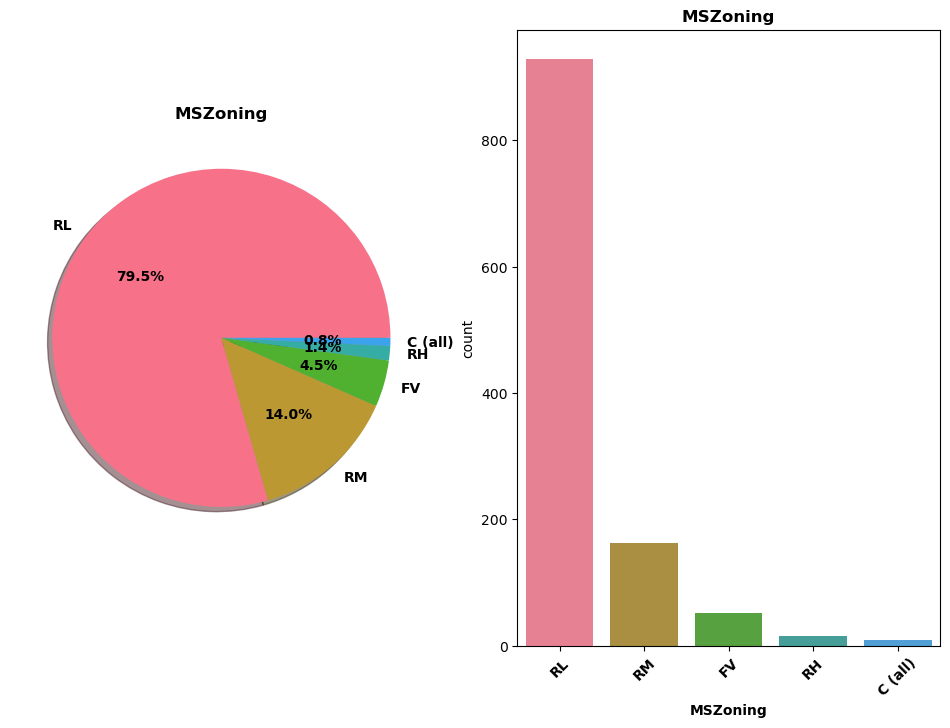

**Observations for MSZoning :**

,Value,Count,% Count
0,RL,928,79.5
1,RM,163,14.0
2,FV,52,4.5
3,RH,16,1.4
4,C (all),9,0.8


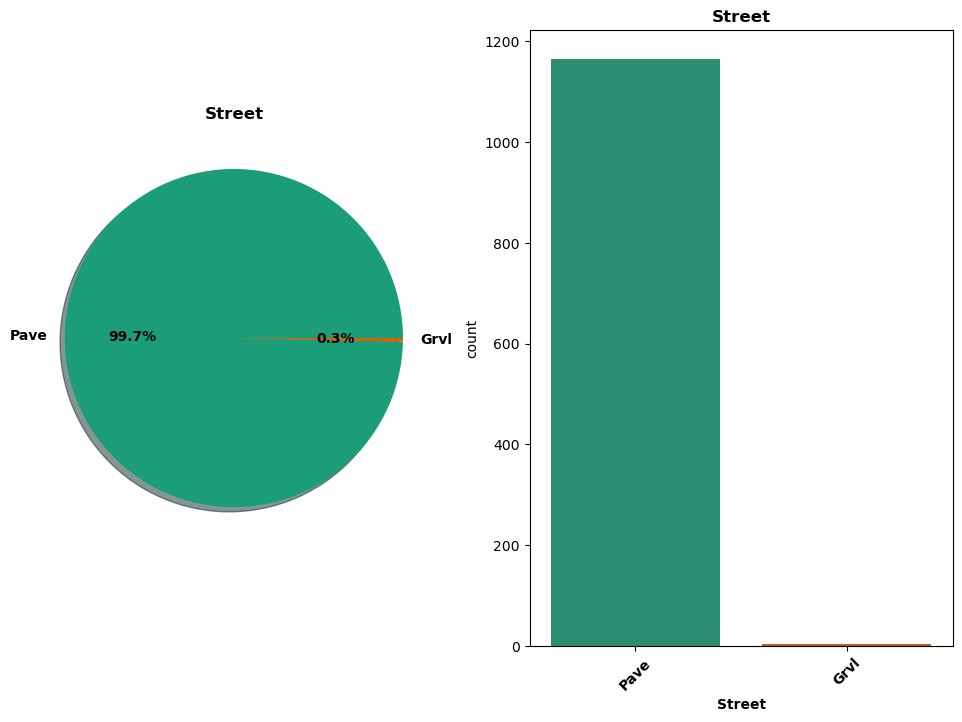

**Observations for Street :**

,Value,Count,% Count
0,Pave,1164,99.7
1,Grvl,4,0.3


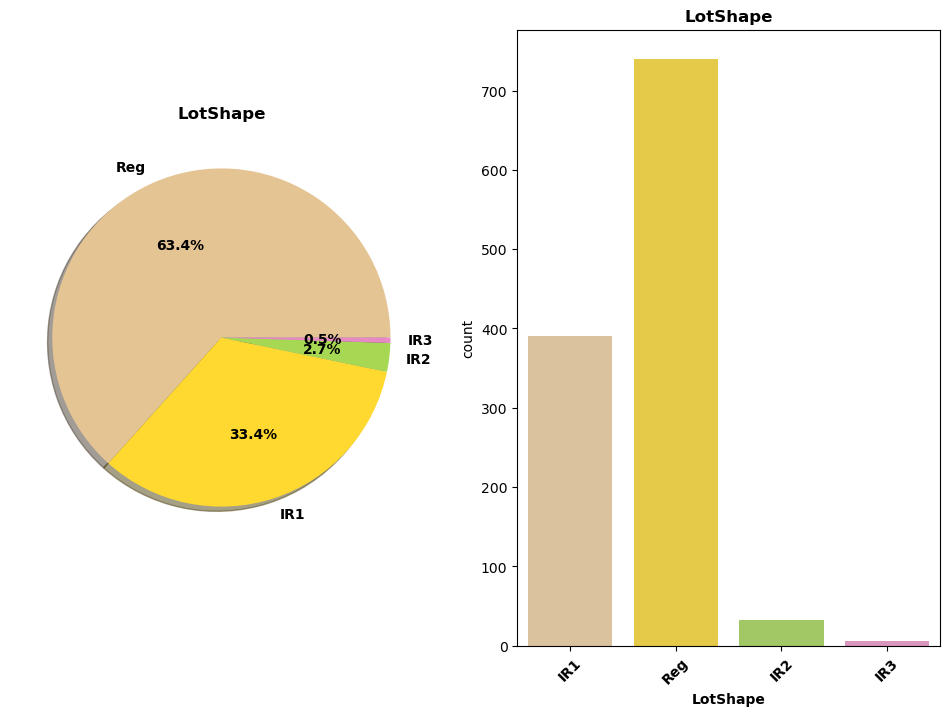

**Observations for LotShape :**

,Value,Count,% Count
0,Reg,740,63.4
1,IR1,390,33.4
2,IR2,32,2.7
3,IR3,6,0.5


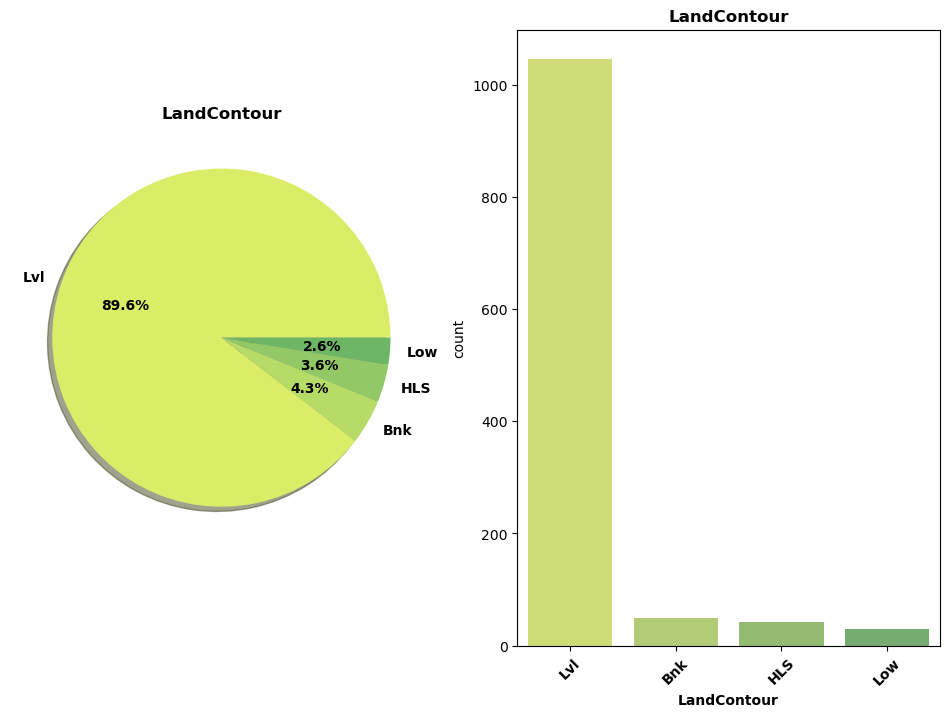

**Observations for LandContour :**

,Value,Count,% Count
0,Lvl,1046,89.6
1,Bnk,50,4.3
2,HLS,42,3.6
3,Low,30,2.6


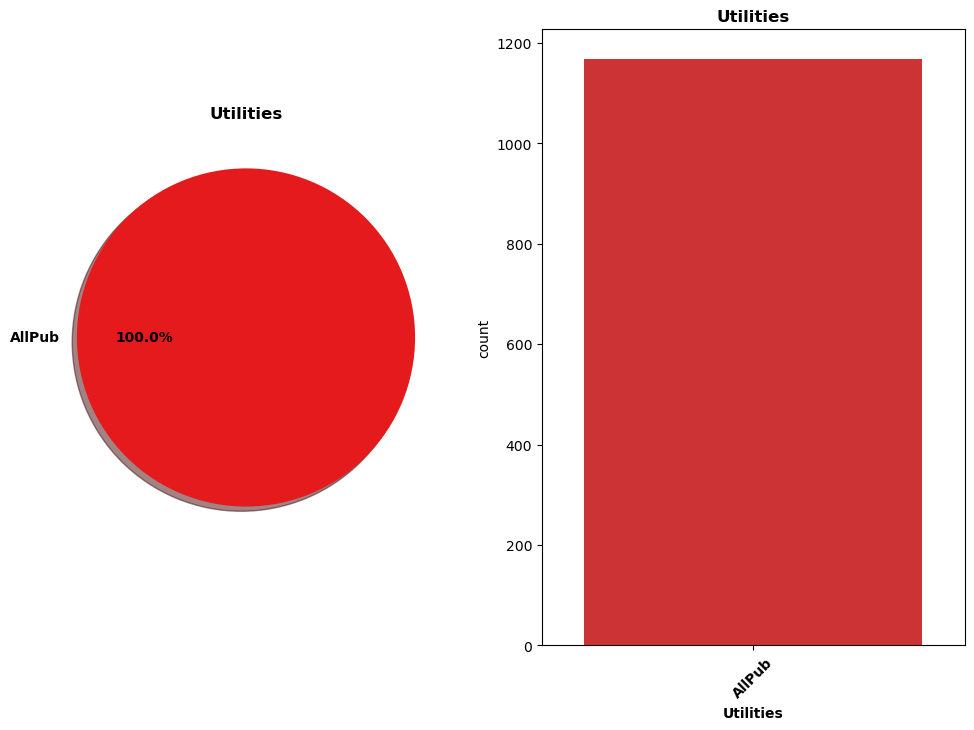

**Observations for Utilities :**

,Value,Count,% Count
0,AllPub,1168,100.0


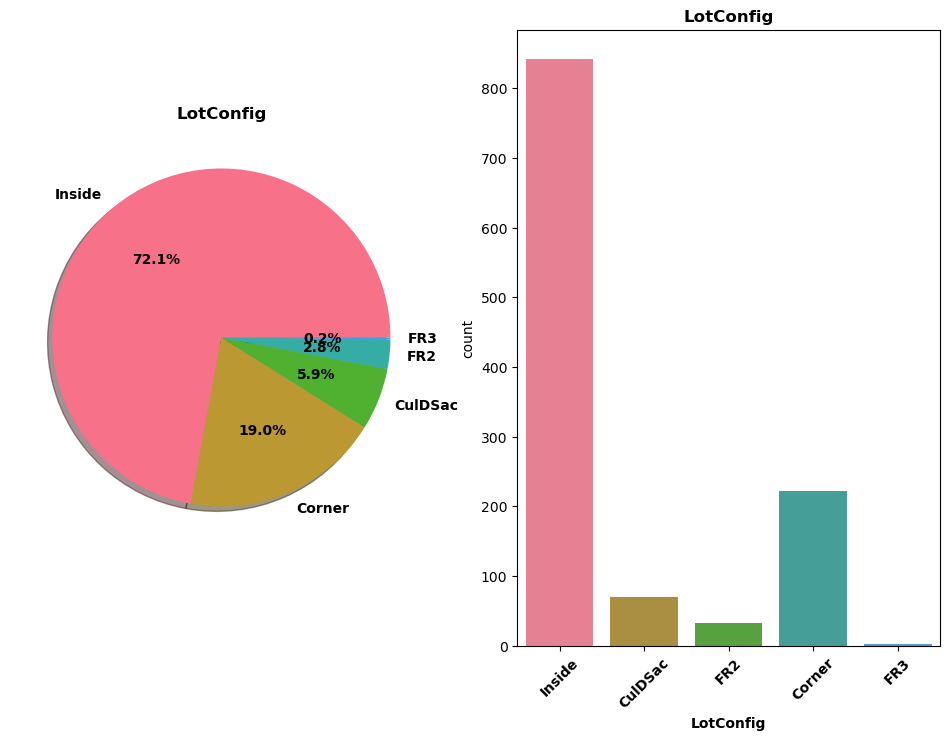

**Observations for LotConfig :**

,Value,Count,% Count
0,Inside,842,72.1
1,Corner,222,19.0
2,CulDSac,69,5.9
3,FR2,33,2.8
4,FR3,2,0.2


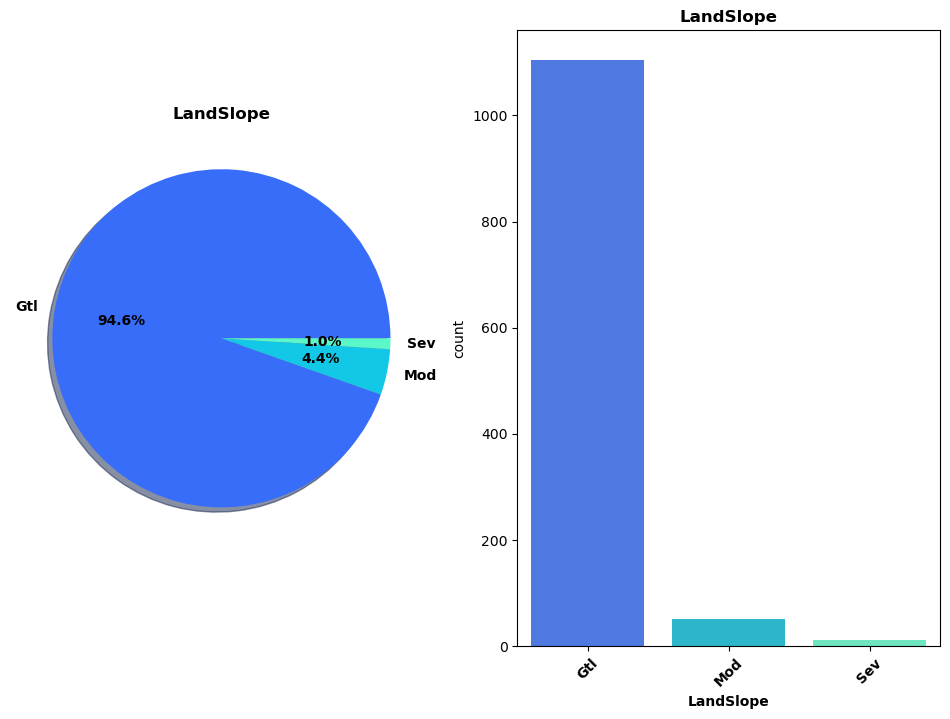

**Observations for LandSlope :**

,Value,Count,% Count
0,Gtl,1105,94.6
1,Mod,51,4.4
2,Sev,12,1.0


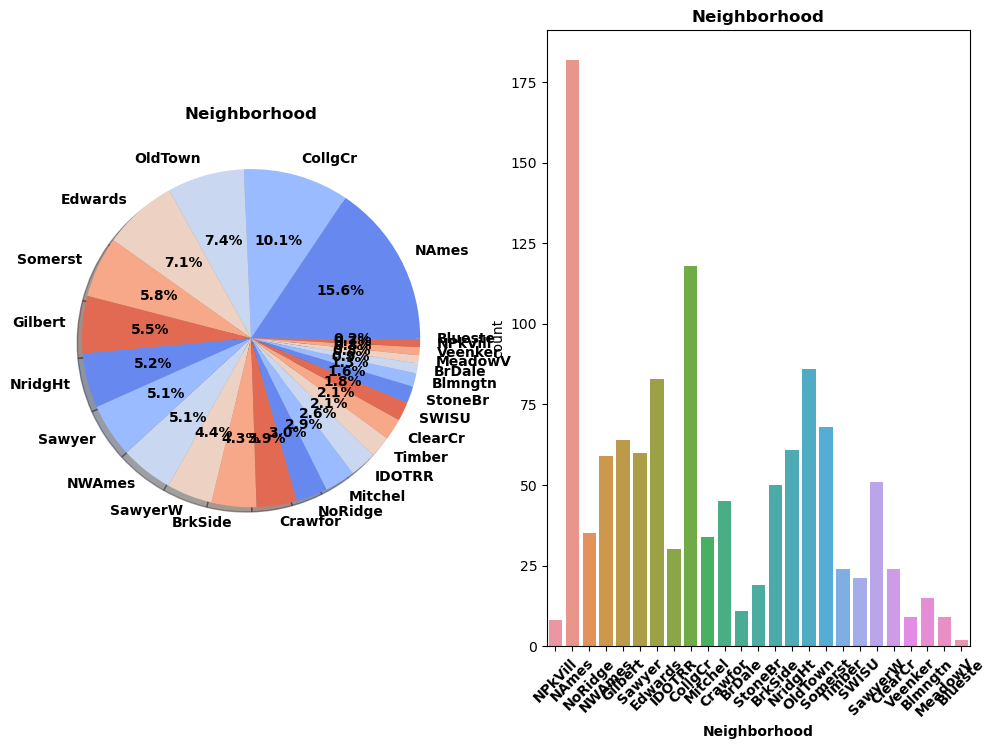

**Observations for Neighborhood :**

,Value,Count,% Count
0,NAmes,182,15.6
1,CollgCr,118,10.1
2,OldTown,86,7.4
3,Edwards,83,7.1
4,Somerst,68,5.8
5,Gilbert,64,5.5
6,NridgHt,61,5.2
7,Sawyer,60,5.1
8,NWAmes,59,5.1
9,SawyerW,51,4.4


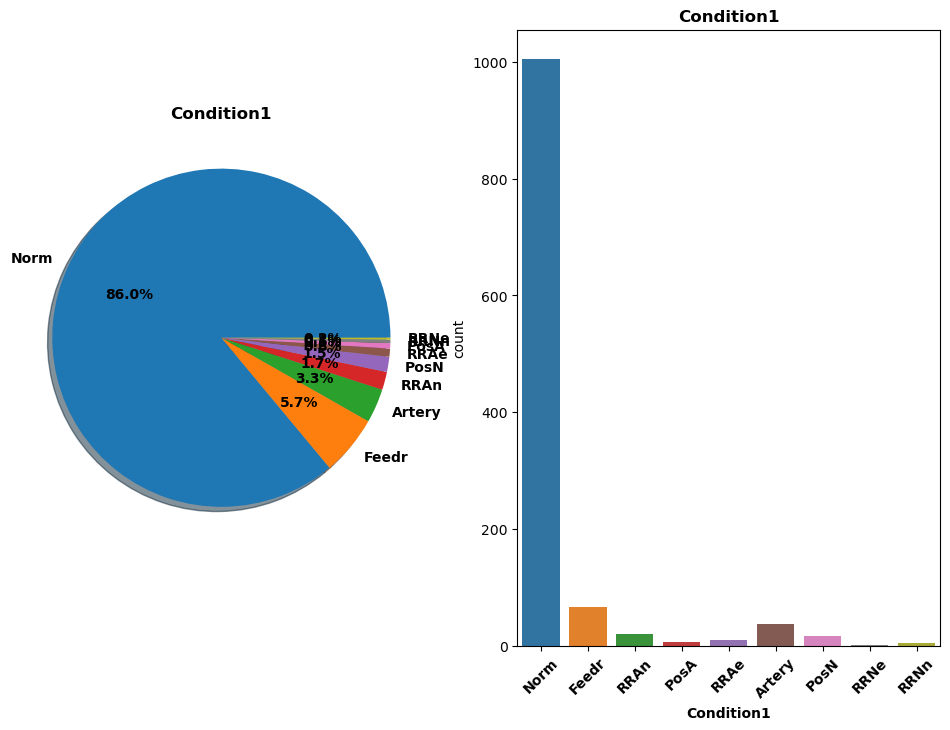

**Observations for Condition1 :**

,Value,Count,% Count
0,Norm,1005,86.0
1,Feedr,67,5.7
2,Artery,38,3.3
3,RRAn,20,1.7
4,PosN,17,1.5
5,RRAe,9,0.8
6,PosA,6,0.5
7,RRNn,4,0.3
8,RRNe,2,0.2


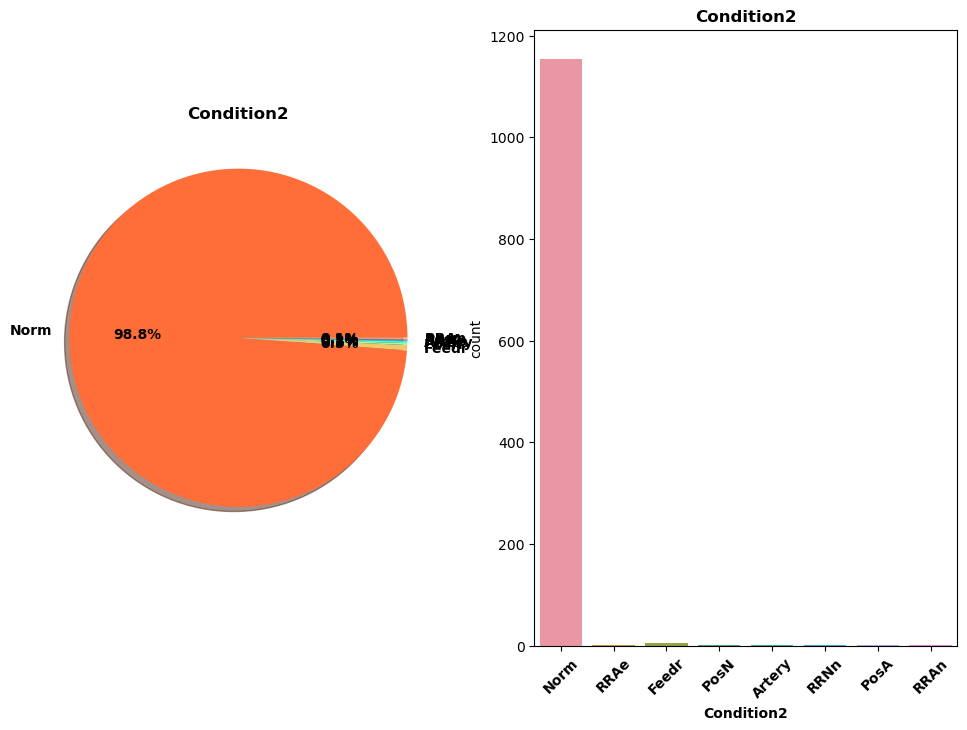

**Observations for Condition2 :**

,Value,Count,% Count
0,Norm,1154,98.8
1,Feedr,6,0.5
2,PosN,2,0.2
3,Artery,2,0.2
4,RRAe,1,0.1
5,RRNn,1,0.1
6,PosA,1,0.1
7,RRAn,1,0.1


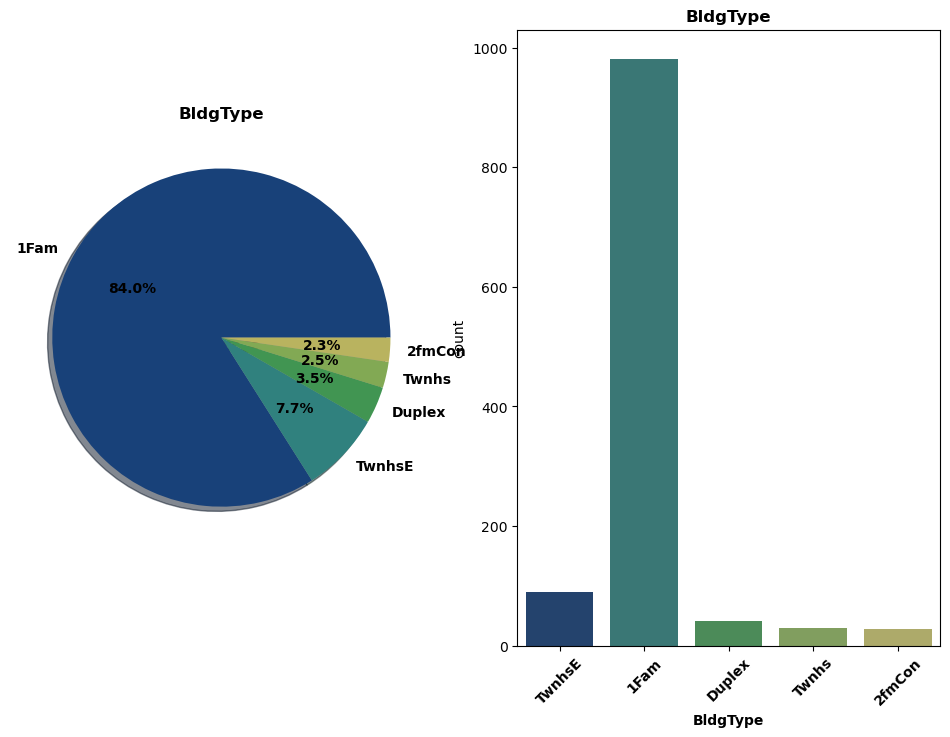

**Observations for BldgType :**

,Value,Count,% Count
0,1Fam,981,84.0
1,TwnhsE,90,7.7
2,Duplex,41,3.5
3,Twnhs,29,2.5
4,2fmCon,27,2.3


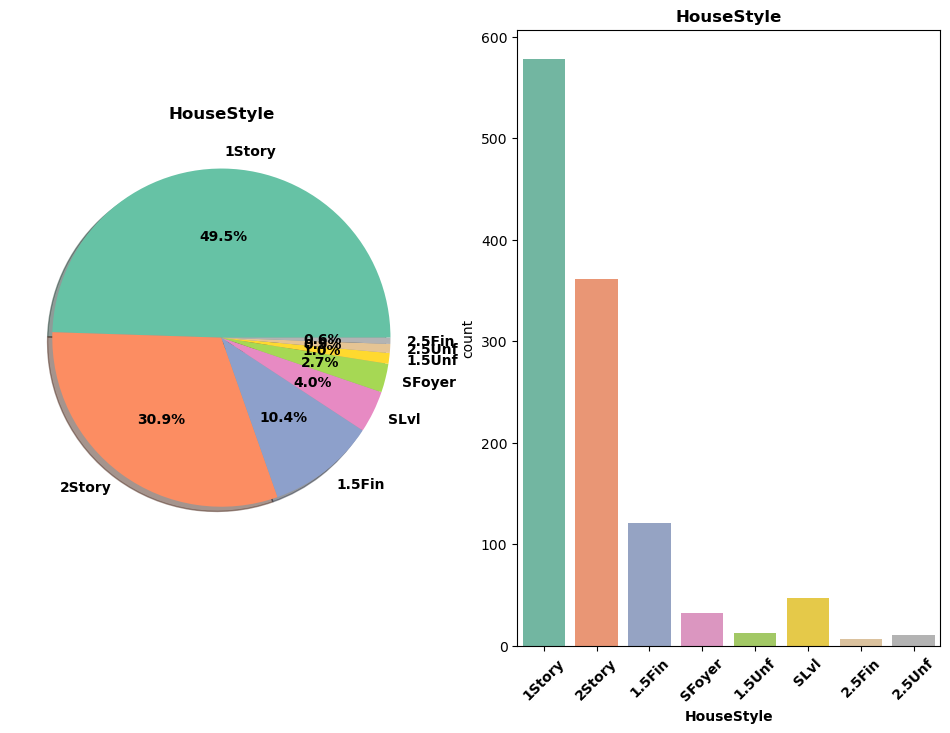

**Observations for HouseStyle :**

,Value,Count,% Count
0,1Story,578,49.5
1,2Story,361,30.9
2,1.5Fin,121,10.4
3,SLvl,47,4.0
4,SFoyer,32,2.7
5,1.5Unf,12,1.0
6,2.5Unf,10,0.9
7,2.5Fin,7,0.6


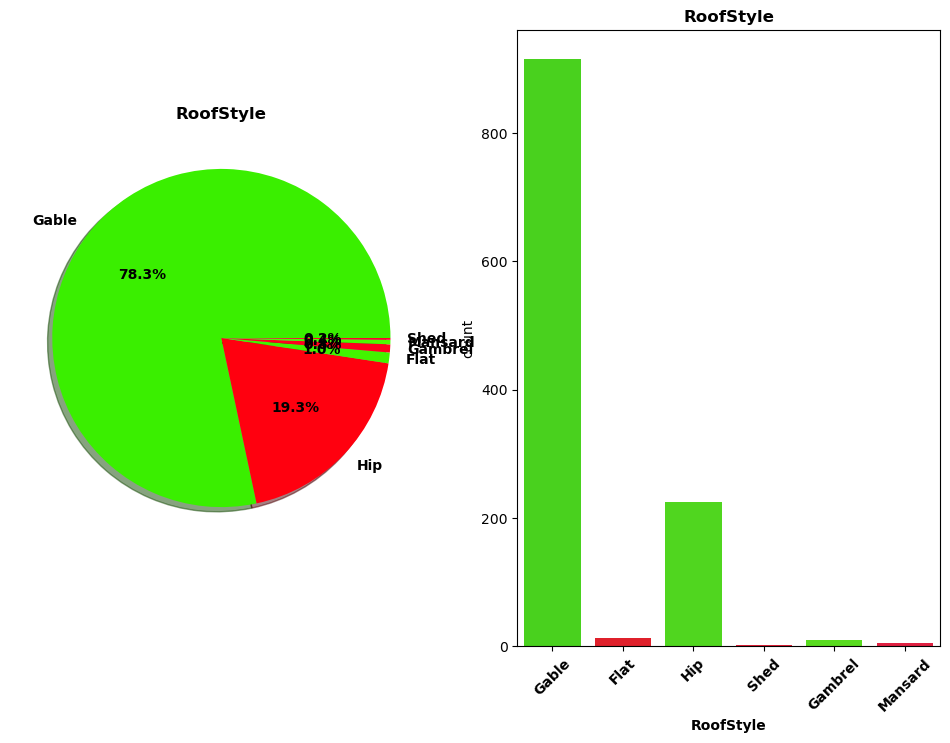

**Observations for RoofStyle :**

,Value,Count,% Count
0,Gable,915,78.3
1,Hip,225,19.3
2,Flat,12,1.0
3,Gambrel,9,0.8
4,Mansard,5,0.4
5,Shed,2,0.2


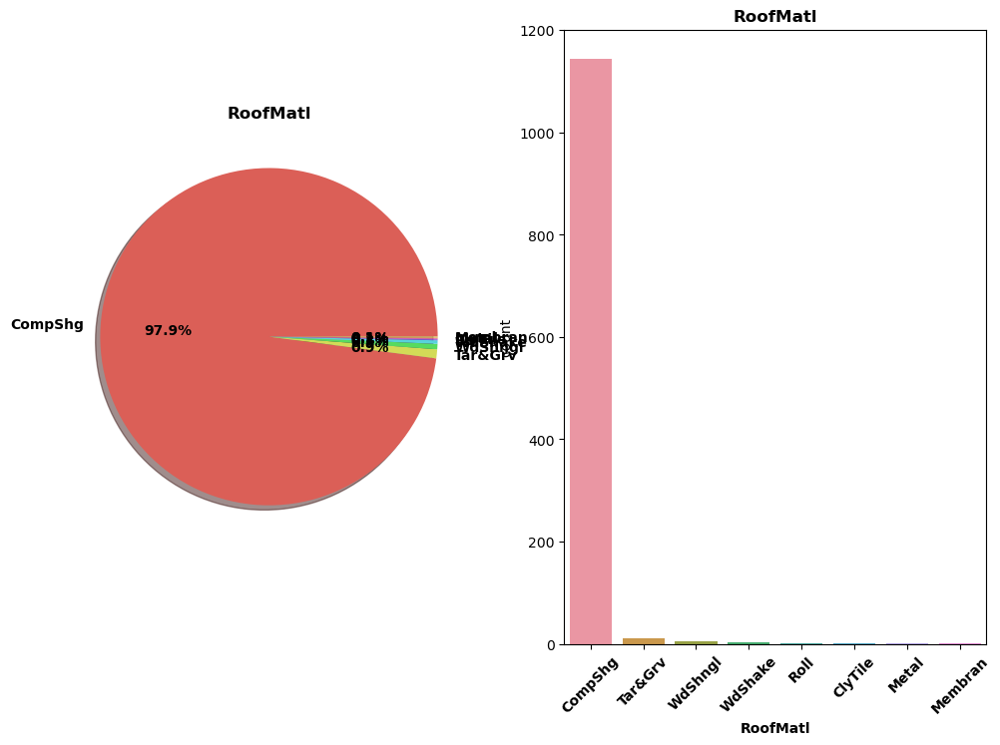

**Observations for RoofMatl :**

,Value,Count,% Count
0,CompShg,1144,97.9
1,Tar&Grv,10,0.9
2,WdShngl,6,0.5
3,WdShake,4,0.3
4,Roll,1,0.1
5,ClyTile,1,0.1
6,Metal,1,0.1
7,Membran,1,0.1


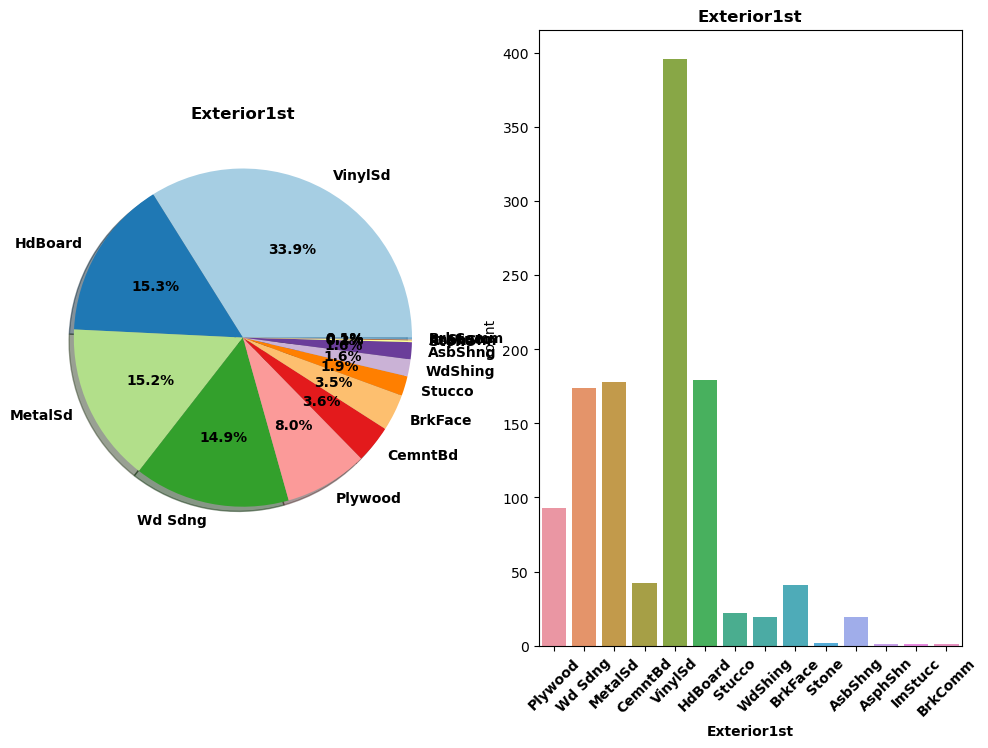

**Observations for Exterior1st :**

,Value,Count,% Count
0,VinylSd,396,33.9
1,HdBoard,179,15.3
2,MetalSd,178,15.2
3,Wd Sdng,174,14.9
4,Plywood,93,8.0
5,CemntBd,42,3.6
6,BrkFace,41,3.5
7,Stucco,22,1.9
8,WdShing,19,1.6
9,AsbShng,19,1.6


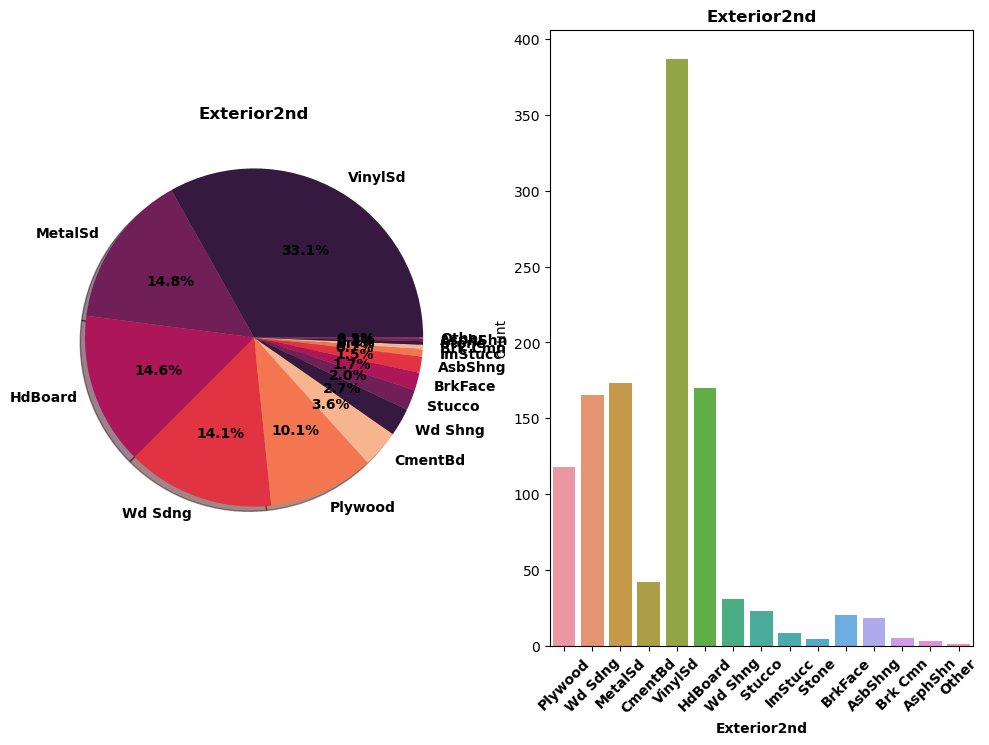

**Observations for Exterior2nd :**

,Value,Count,% Count
0,VinylSd,387,33.1
1,MetalSd,173,14.8
2,HdBoard,170,14.6
3,Wd Sdng,165,14.1
4,Plywood,118,10.1
5,CmentBd,42,3.6
6,Wd Shng,31,2.7
7,Stucco,23,2.0
8,BrkFace,20,1.7
9,AsbShng,18,1.5


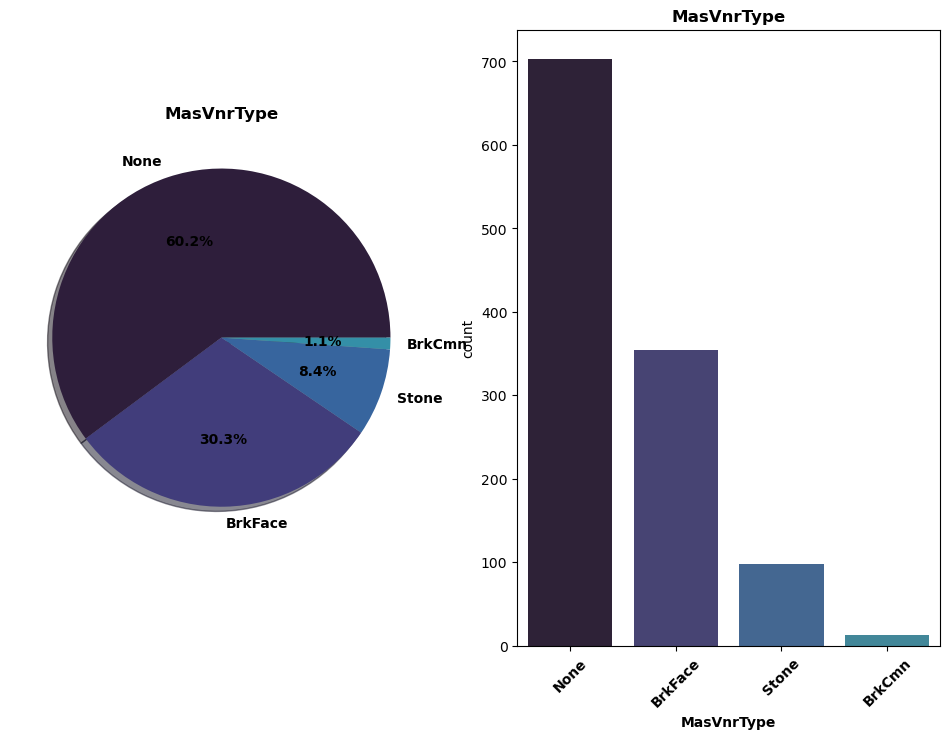

**Observations for MasVnrType :**

,Value,Count,% Count
0,None,703,60.2
1,BrkFace,354,30.3
2,Stone,98,8.4
3,BrkCmn,13,1.1


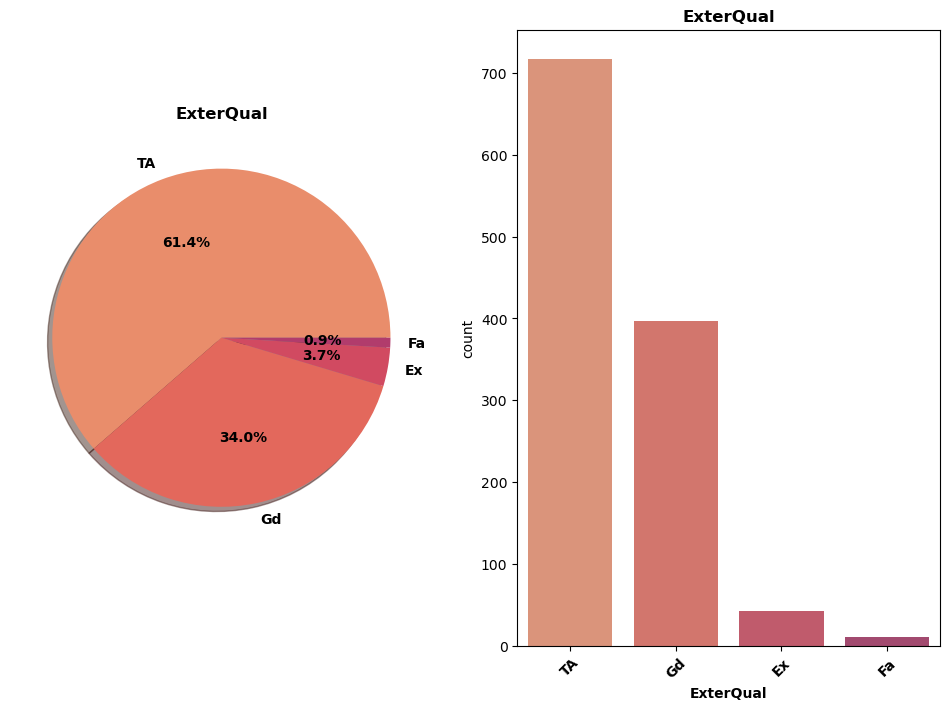

**Observations for ExterQual :**

,Value,Count,% Count
0,TA,717,61.4
1,Gd,397,34.0
2,Ex,43,3.7
3,Fa,11,0.9


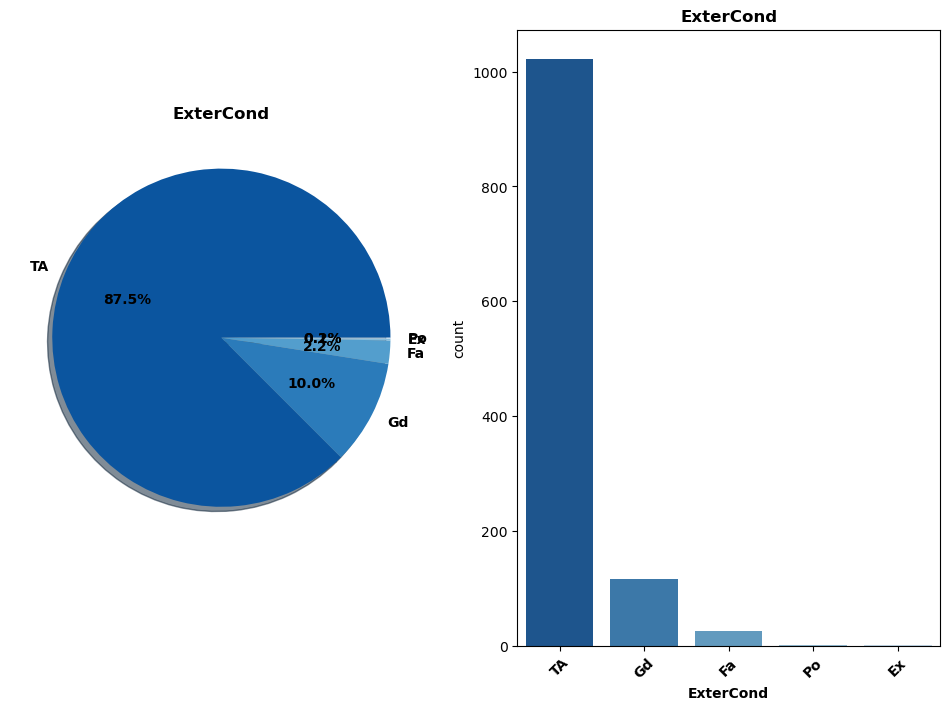

**Observations for ExterCond :**

,Value,Count,% Count
0,TA,1022,87.5
1,Gd,117,10.0
2,Fa,26,2.2
3,Ex,2,0.2
4,Po,1,0.1


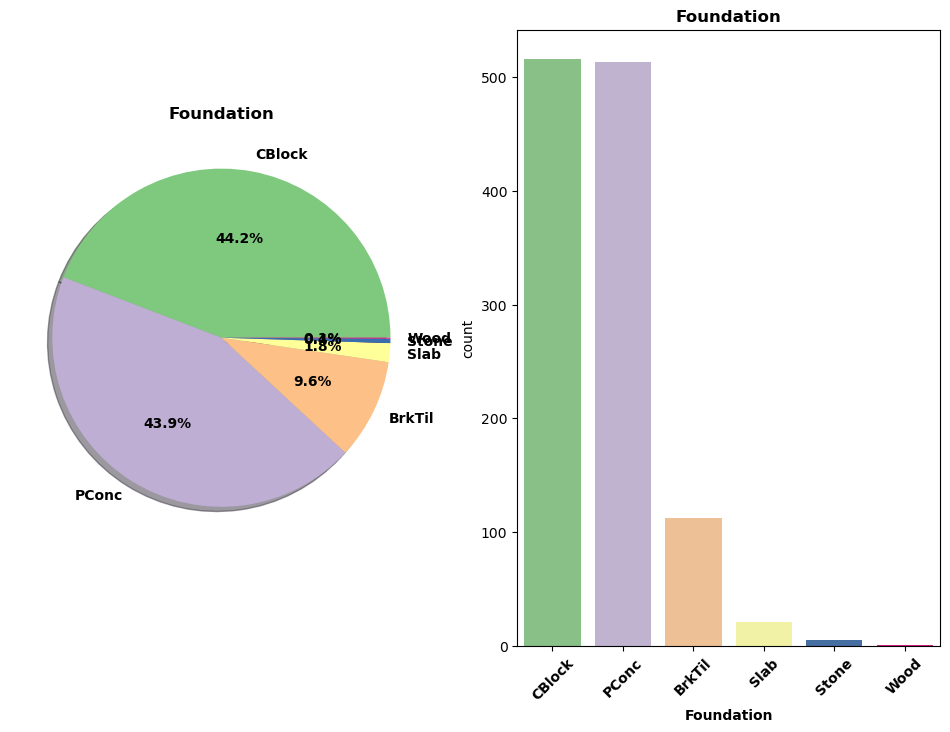

**Observations for Foundation :**

,Value,Count,% Count
0,CBlock,516,44.2
1,PConc,513,43.9
2,BrkTil,112,9.6
3,Slab,21,1.8
4,Stone,5,0.4
5,Wood,1,0.1


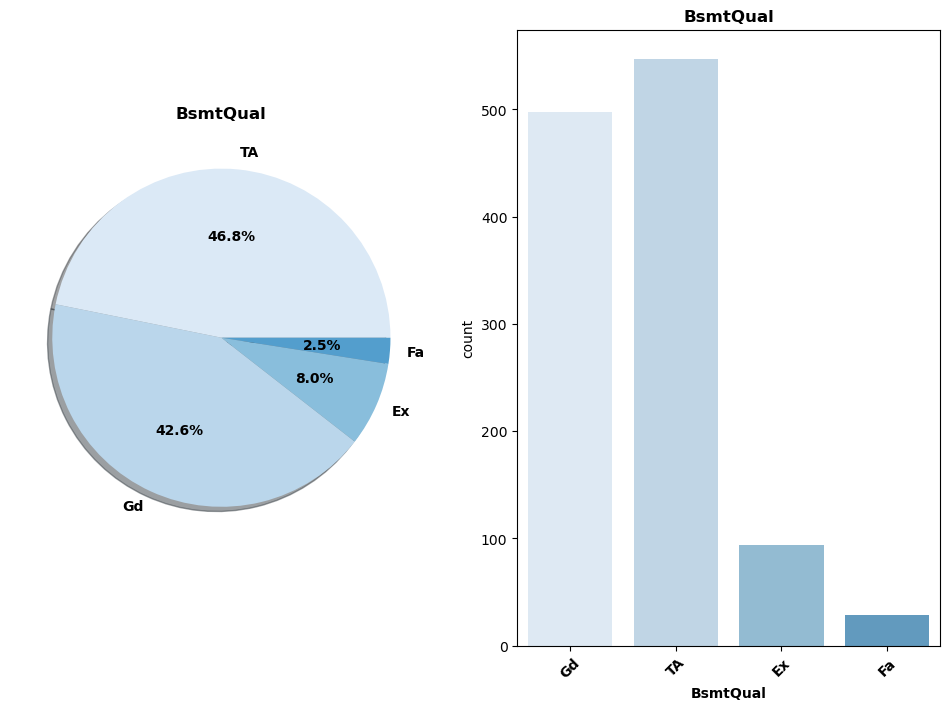

**Observations for BsmtQual :**

,Value,Count,% Count
0,TA,547,46.8
1,Gd,498,42.6
2,Ex,94,8.0
3,Fa,29,2.5


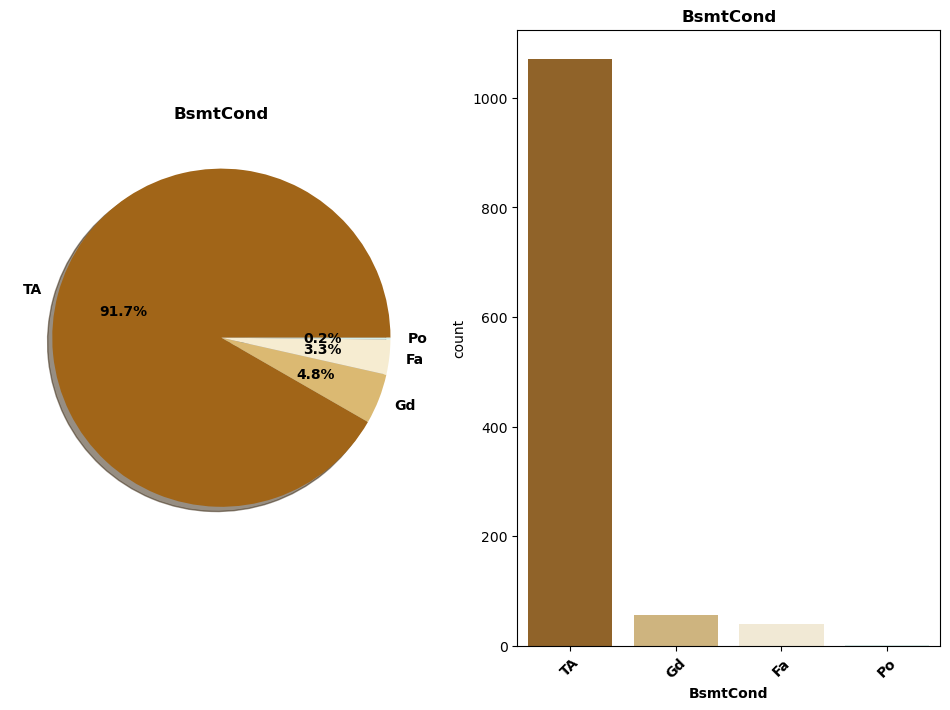

**Observations for BsmtCond :**

,Value,Count,% Count
0,TA,1071,91.7
1,Gd,56,4.8
2,Fa,39,3.3
3,Po,2,0.2


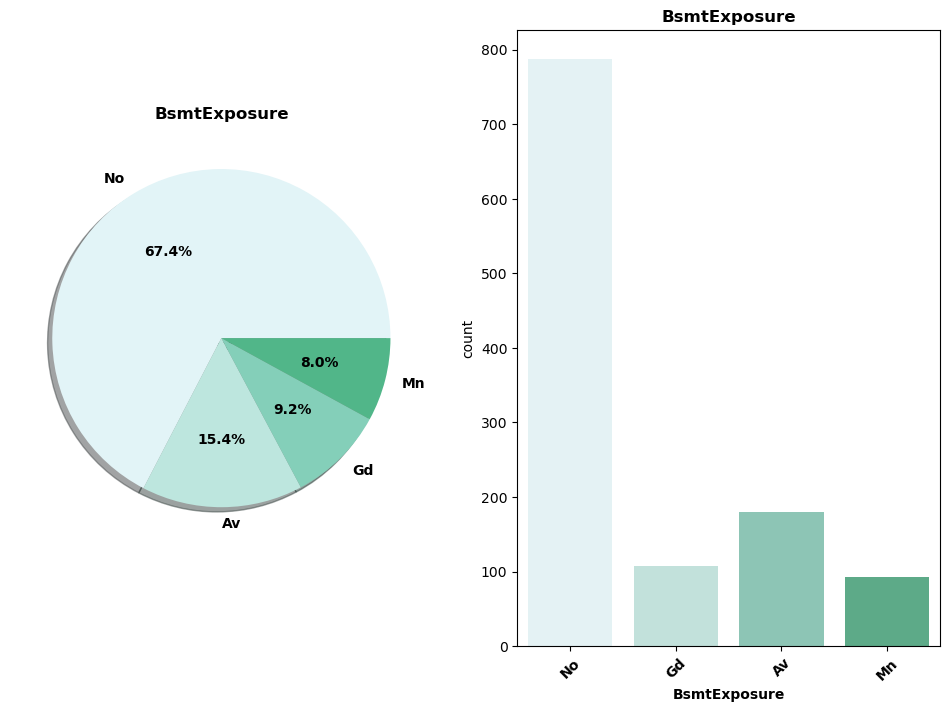

**Observations for BsmtExposure :**

,Value,Count,% Count
0,No,787,67.4
1,Av,180,15.4
2,Gd,108,9.2
3,Mn,93,8.0


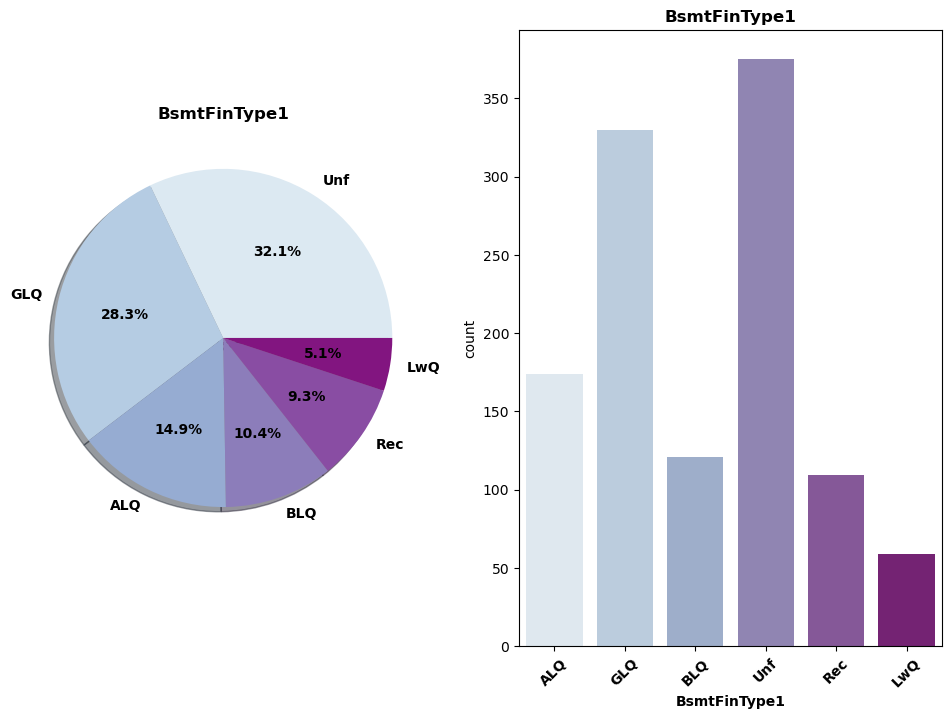

**Observations for BsmtFinType1 :**

,Value,Count,% Count
0,Unf,375,32.1
1,GLQ,330,28.3
2,ALQ,174,14.9
3,BLQ,121,10.4
4,Rec,109,9.3
5,LwQ,59,5.1


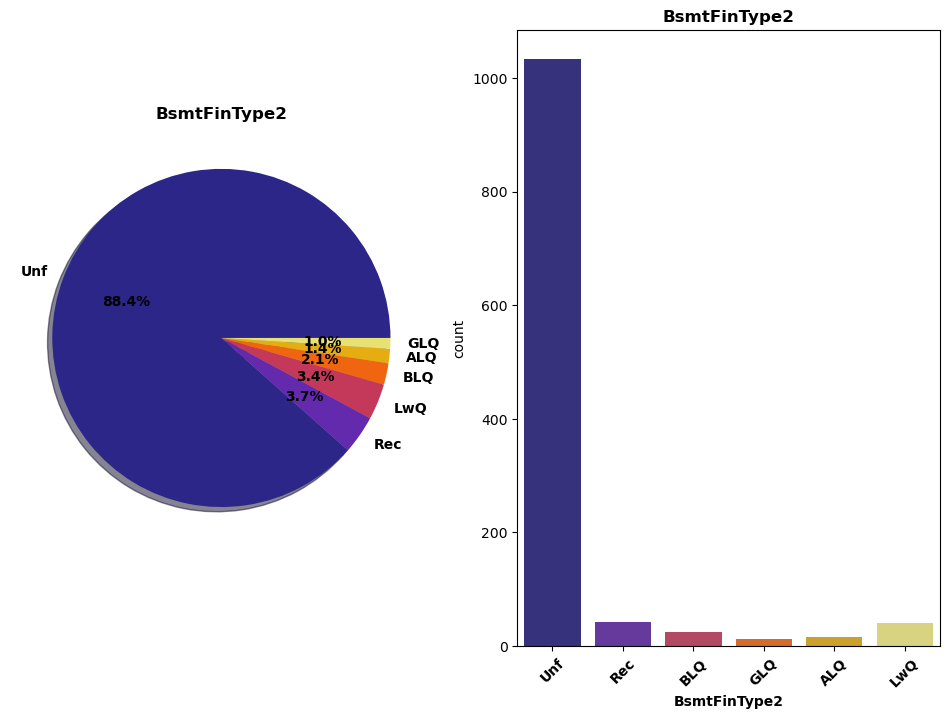

**Observations for BsmtFinType2 :**

,Value,Count,% Count
0,Unf,1033,88.4
1,Rec,43,3.7
2,LwQ,40,3.4
3,BLQ,24,2.1
4,ALQ,16,1.4
5,GLQ,12,1.0


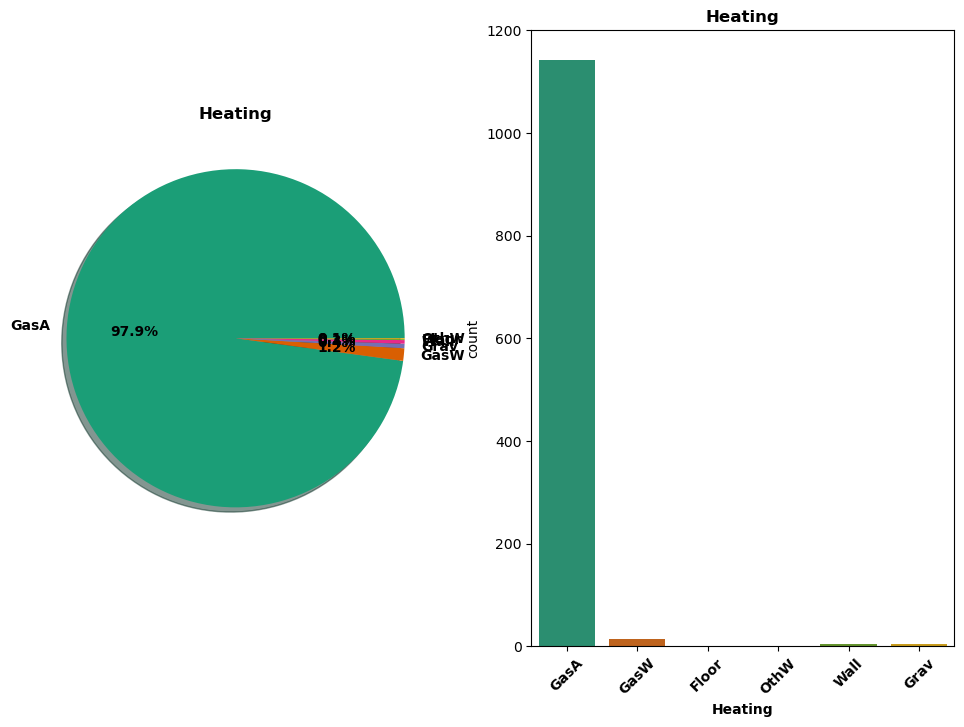

**Observations for Heating :**

,Value,Count,% Count
0,GasA,1143,97.9
1,GasW,14,1.2
2,Grav,5,0.4
3,Wall,4,0.3
4,Floor,1,0.1
5,OthW,1,0.1


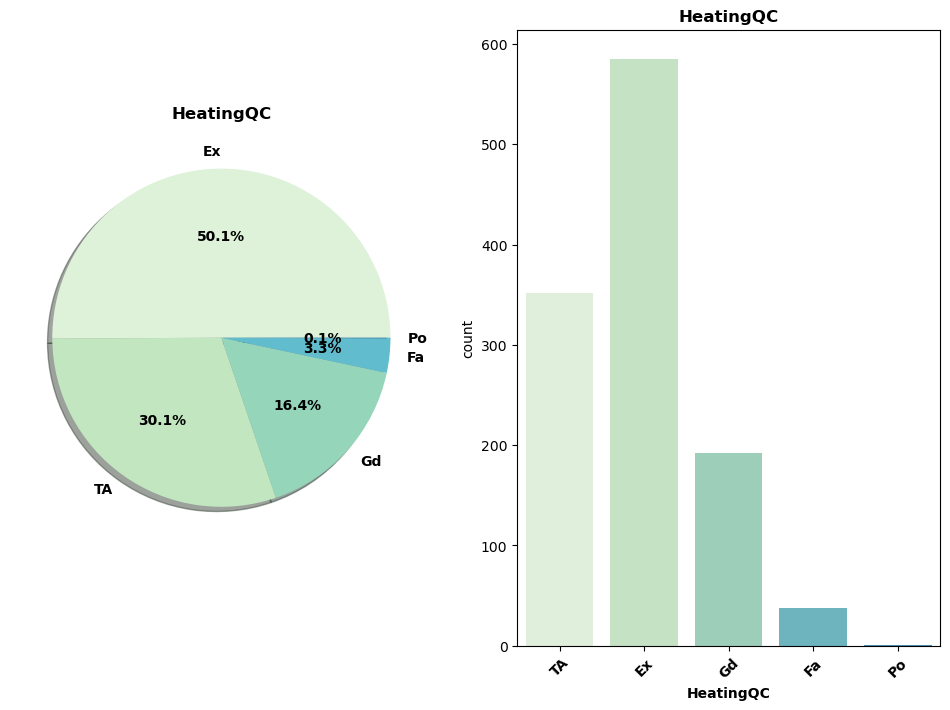

**Observations for HeatingQC :**

,Value,Count,% Count
0,Ex,585,50.1
1,TA,352,30.1
2,Gd,192,16.4
3,Fa,38,3.3
4,Po,1,0.1


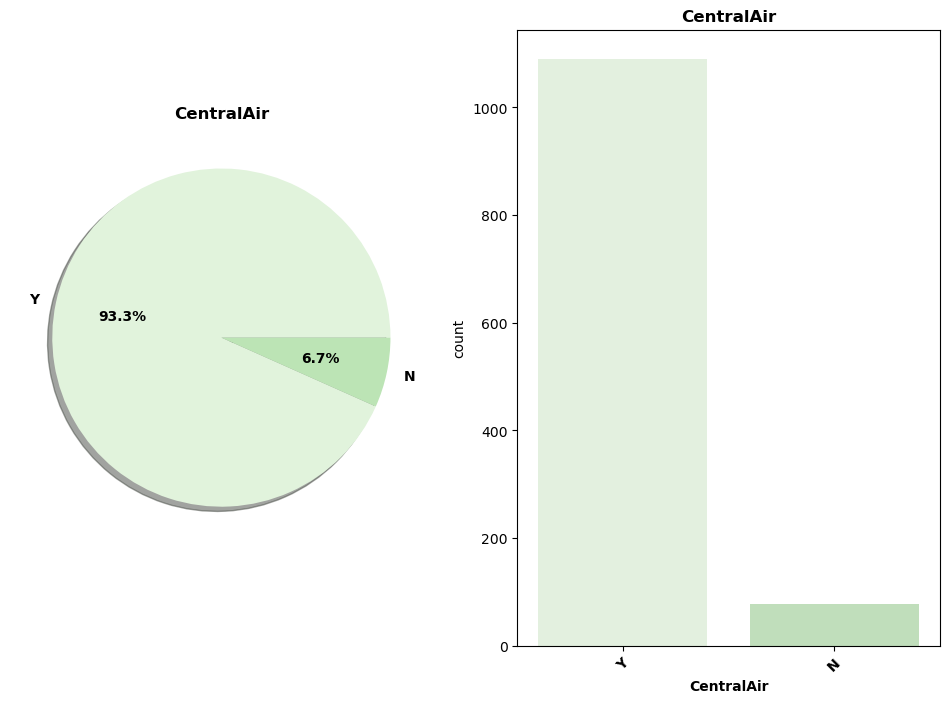

**Observations for CentralAir :**

,Value,Count,% Count
0,Y,1090,93.3
1,N,78,6.7


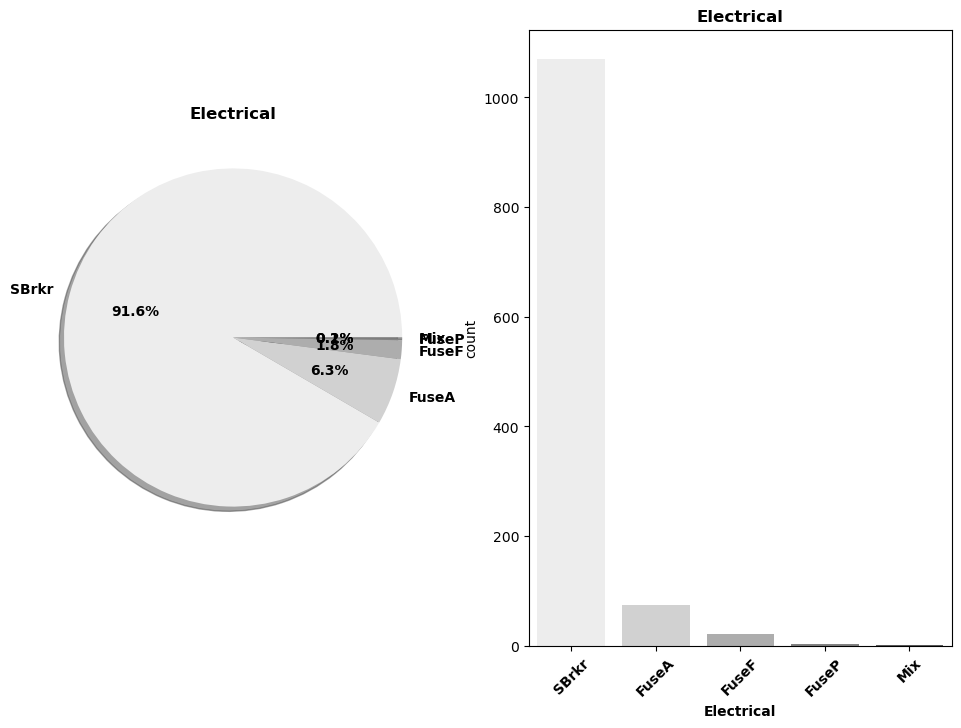

**Observations for Electrical :**

,Value,Count,% Count
0,SBrkr,1070,91.6
1,FuseA,74,6.3
2,FuseF,21,1.8
3,FuseP,2,0.2
4,Mix,1,0.1


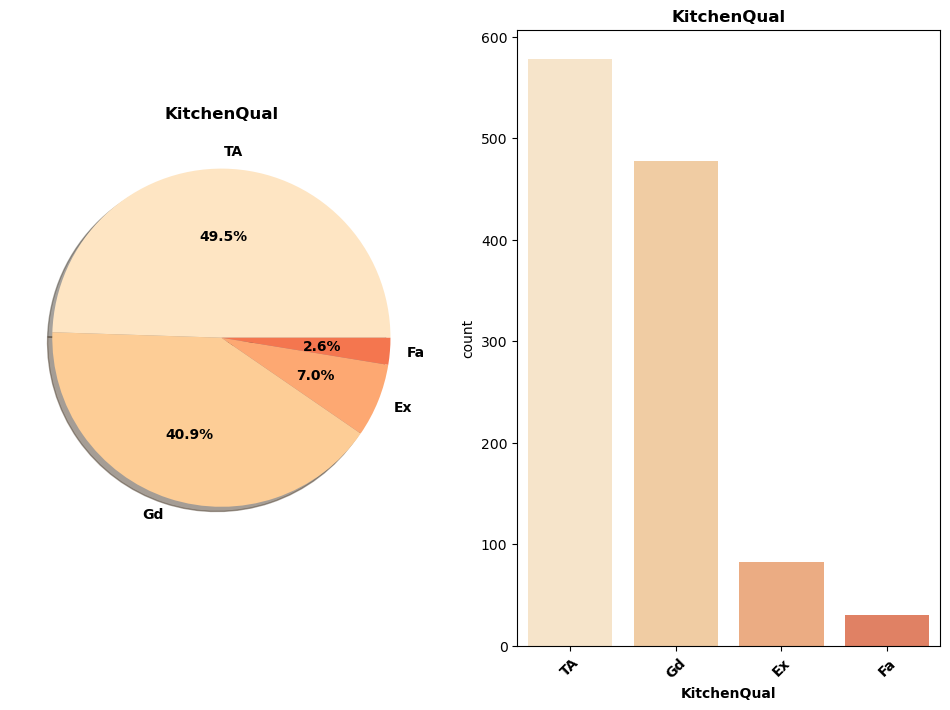

**Observations for KitchenQual :**

,Value,Count,% Count
0,TA,578,49.5
1,Gd,478,40.9
2,Ex,82,7.0
3,Fa,30,2.6


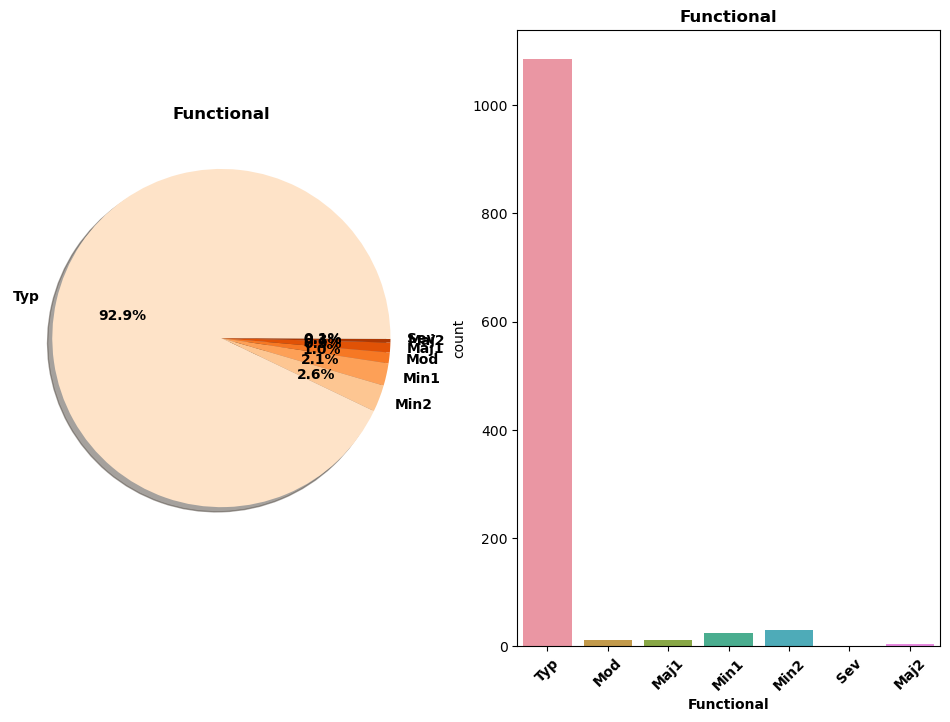

**Observations for Functional :**

,Value,Count,% Count
0,Typ,1085,92.9
1,Min2,30,2.6
2,Min1,25,2.1
3,Mod,12,1.0
4,Maj1,11,0.9
5,Maj2,4,0.3
6,Sev,1,0.1


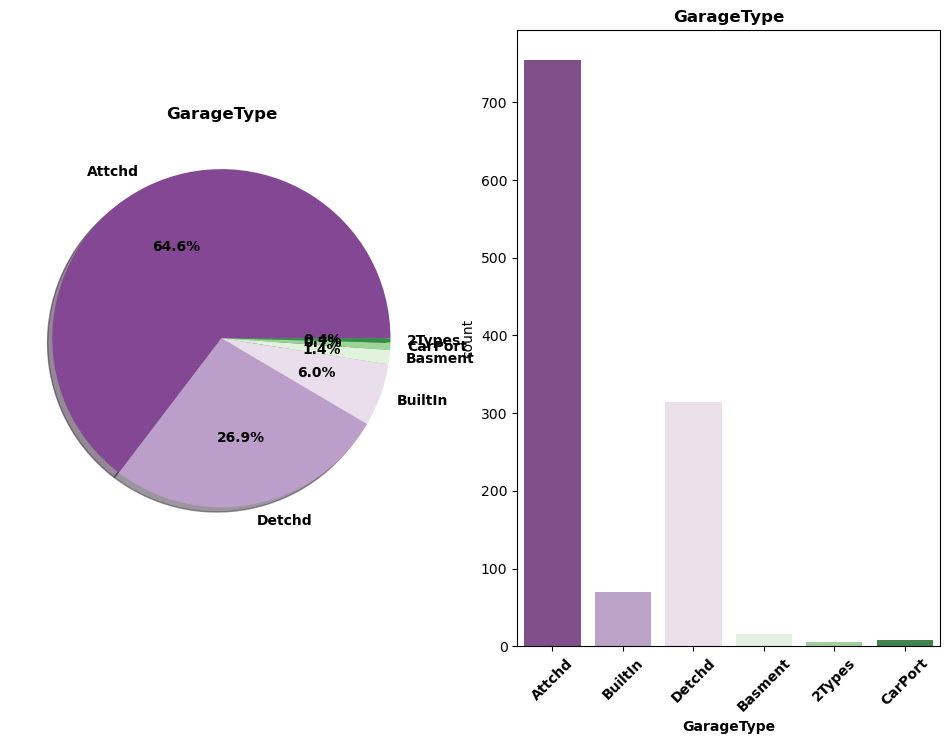

**Observations for GarageType :**

,Value,Count,% Count
0,Attchd,755,64.6
1,Detchd,314,26.9
2,BuiltIn,70,6.0
3,Basment,16,1.4
4,CarPort,8,0.7
5,2Types,5,0.4


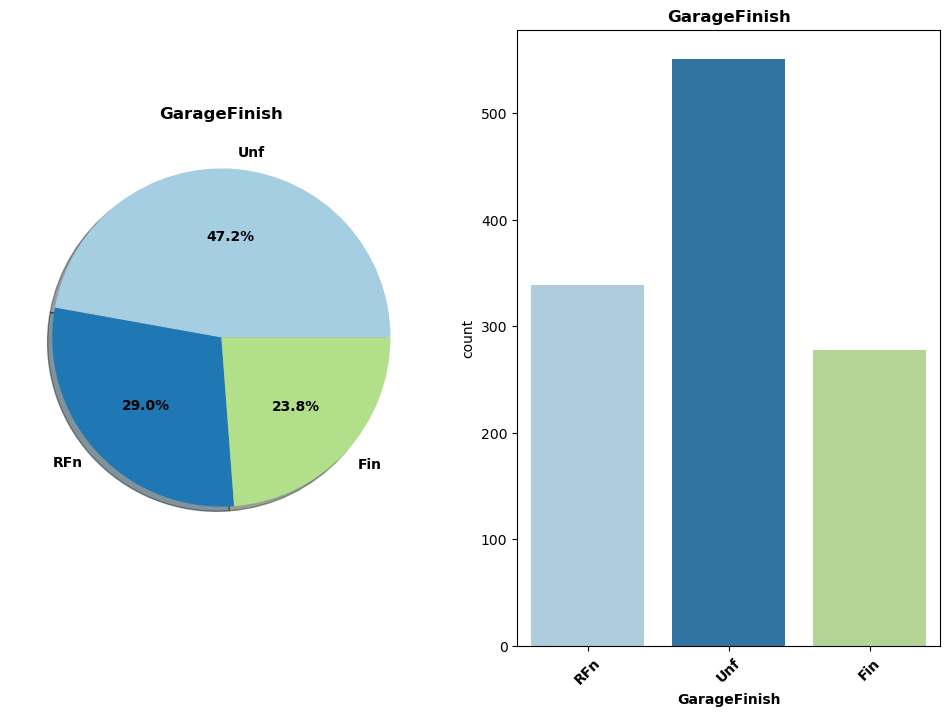

**Observations for GarageFinish :**

,Value,Count,% Count
0,Unf,551,47.2
1,RFn,339,29.0
2,Fin,278,23.8


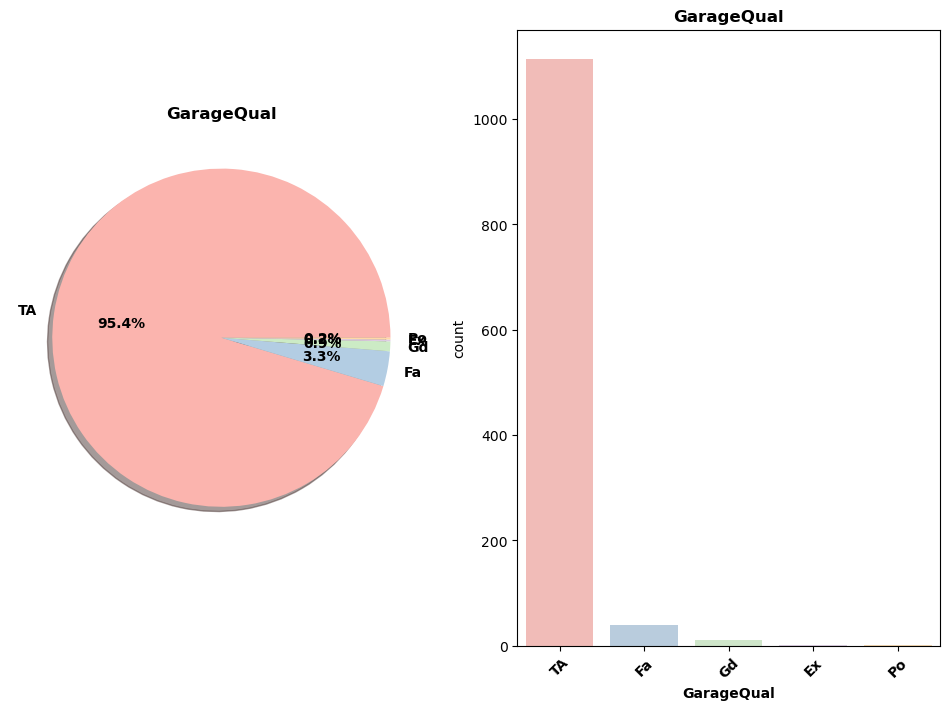

**Observations for GarageQual :**

,Value,Count,% Count
0,TA,1114,95.4
1,Fa,39,3.3
2,Gd,11,0.9
3,Ex,2,0.2
4,Po,2,0.2


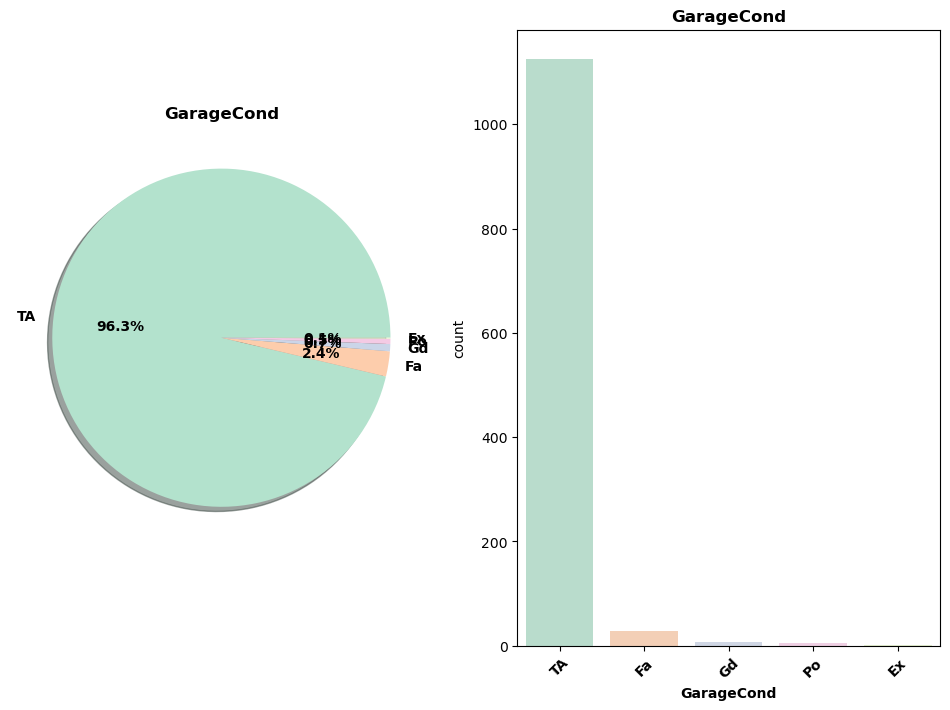

**Observations for GarageCond :**

,Value,Count,% Count
0,TA,1125,96.3
1,Fa,28,2.4
2,Gd,8,0.7
3,Po,6,0.5
4,Ex,1,0.1


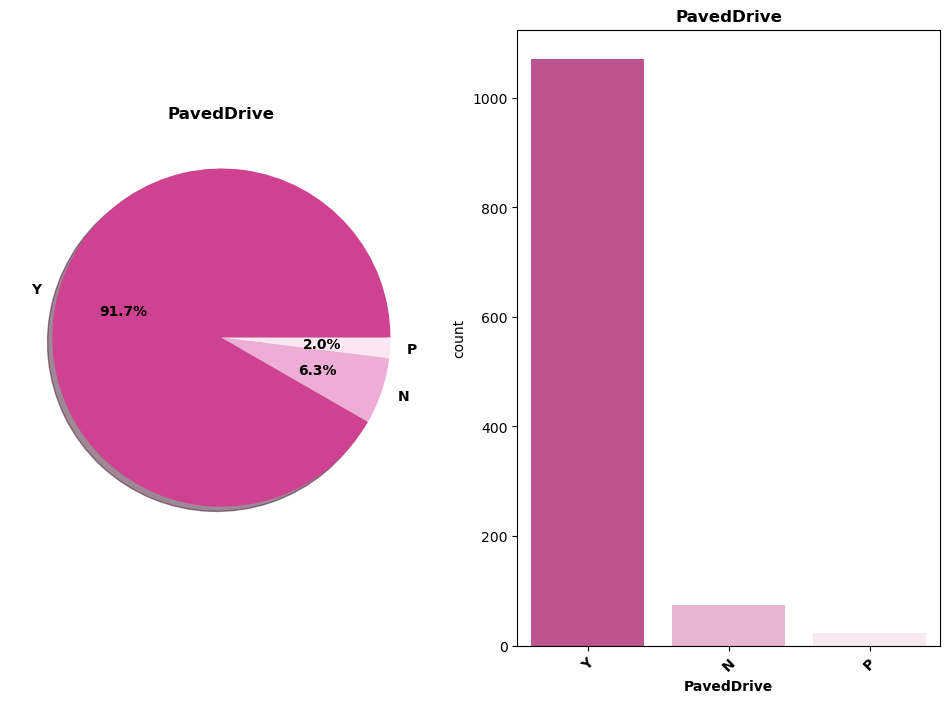

**Observations for PavedDrive :**

,Value,Count,% Count
0,Y,1071,91.7
1,N,74,6.3
2,P,23,2.0


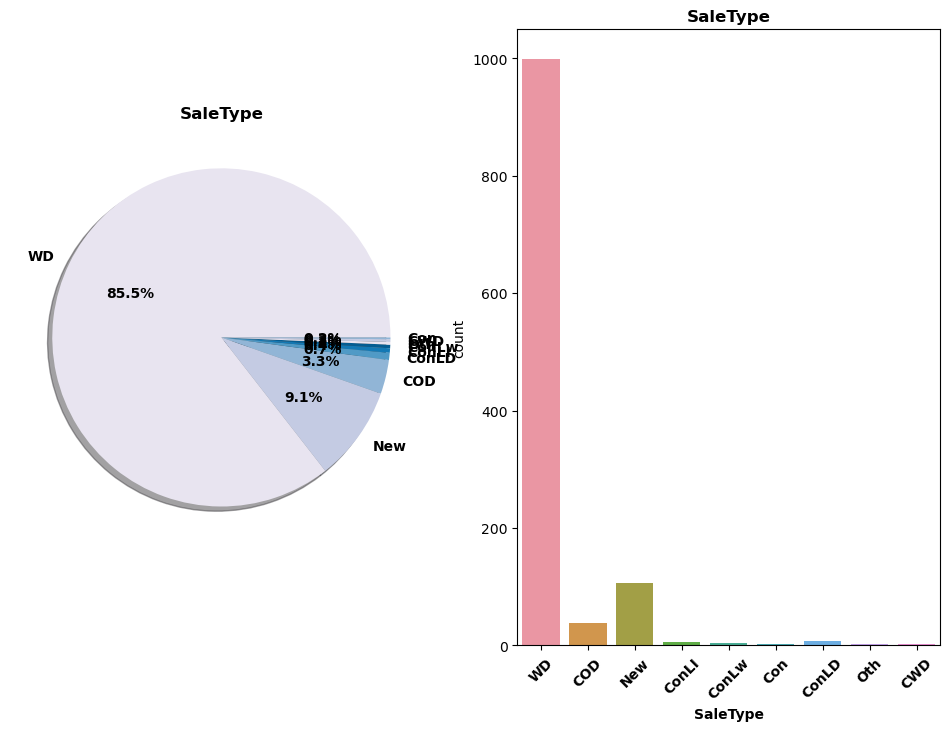

**Observations for SaleType :**

,Value,Count,% Count
0,WD,999,85.5
1,New,106,9.1
2,COD,38,3.3
3,ConLD,8,0.7
4,ConLI,5,0.4
5,ConLw,4,0.3
6,Oth,3,0.3
7,CWD,3,0.3
8,Con,2,0.2


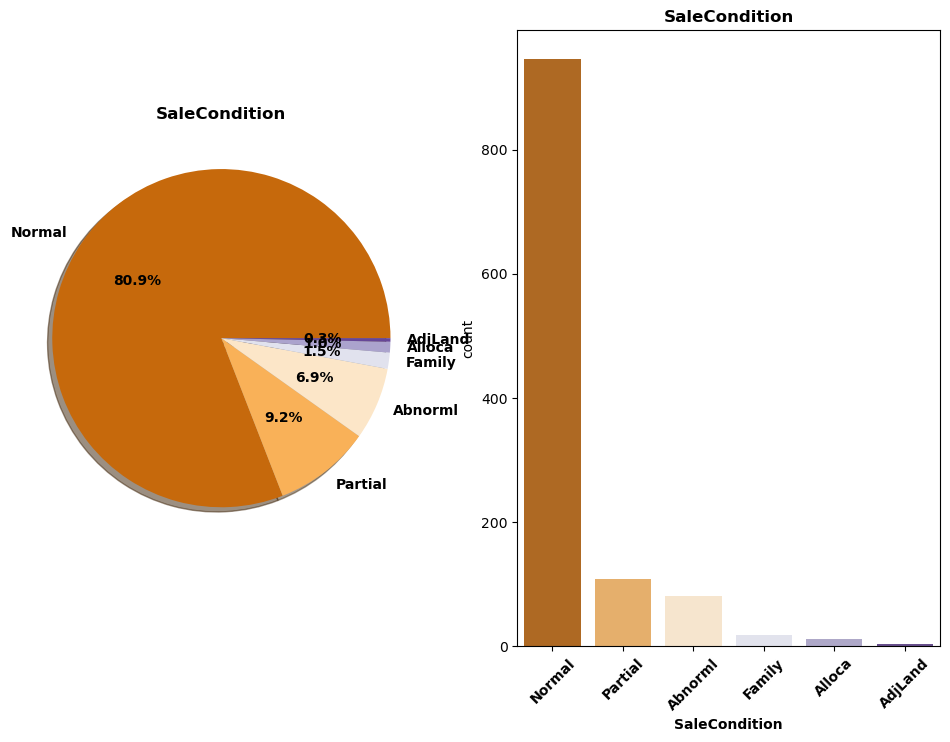

**Observations for SaleCondition :**

,Value,Count,% Count
0,Normal,945,80.9
1,Partial,108,9.2
2,Abnorml,81,6.9
3,Family,18,1.5
4,Alloca,12,1.0
5,AdjLand,4,0.3


In [31]:
colors=['husl','Dark2','Set2_r','summer_r','Set1','husl','rainbow','coolwarm','tab10','rainbow_r','gist_earth','Set2','prism',
        'hls','Paired','rocket','mako','flare','Blues_r','Accent', 'Blues', 'BrBG', 'BuGn', 'BuPu', 'CMRmap','Dark2', 'GnBu', 'Greens', 'Greys', 'OrRd', 'Oranges','PRGn',
        'Paired', 'Pastel1', 'Pastel2', 'PiYG','PuBu', 'PuOr', 'PuRd', 'Purples', 'RdBu','RdGy', 'RdPu', 'RdYlBu', 'RdYlGn',
        'Reds', 'Set1','Set2', 'Set3', 'Spectral', 'Wistia', 'YlGn','YlOrBr', 'YlOrRd', 'afmhot', 'autumn', 'binary','bone',
        'brg', 'bwr', 'cividis', 'cool', 'coolwarm','copper', 'cubehelix', 'flag', 'gist_earth','gist_gray', 'gist_heat', 
        'gist_ncar', 'gist_rainbow','gist_stern', 'gist_yarg', 'gnuplot', 'gnuplot2', 'gray','hot', 'hsv', 'icefire', 
        'inferno', 'jet', 'magma','mako', 'nipy_spectral', 'ocean', 'pink', 'plasma','prism', 'rainbow', 'rocket', 
        'seismic', 'spring','summer', 'tab10', 'tab20','terrain', 'turbo', 'twilight','viridis', 'vlag', 'winter']

from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))

plotnumber =1
for i in df_cat_str:
    sns.set_palette(colors[plotnumber-1])
    if plotnumber <=38:
        f,ax=plt.subplots(1,2,figsize=(12,8))
        df[i].value_counts().plot.pie(autopct='%3.1f%%',
                                      textprops ={ 'fontweight': 'bold','fontsize':10}, ax=ax[0],shadow=True)
        ax[0].set_title(i, fontsize=12,fontweight ='bold')
        ax[0].set_ylabel('')
        sns.countplot(df[i],data=df,ax=ax[1])
        ax[1].set_title(i,fontsize=12,fontweight ='bold')
        ax[1].set_xlabel(i,fontsize=10,fontweight ='bold')
        plt.xticks(fontsize=10,fontweight ='bold',rotation=45)
    plotnumber+=1
    plt.show()
    length=df[i].nunique()
    printmd("**Observations for {} :**".format(i))   
    length=df[i].nunique()
    name=[]
    value_count=[]
    percent_value_count=[]
    for j in range(length):
        name.append(df[i].value_counts().index.values[j])
        value_count.append((df[i].value_counts()).iloc[j])
        percent_value_count.append(round(((df[i].value_counts())[j])*100/(df[i].value_counts().sum()),1))
    df_value_count=pd.DataFrame({'Value':name,'Count':value_count,'% Count': percent_value_count})
    display(df_value_count)
    print("="*120)

In [32]:
len(df_int_cat)

16

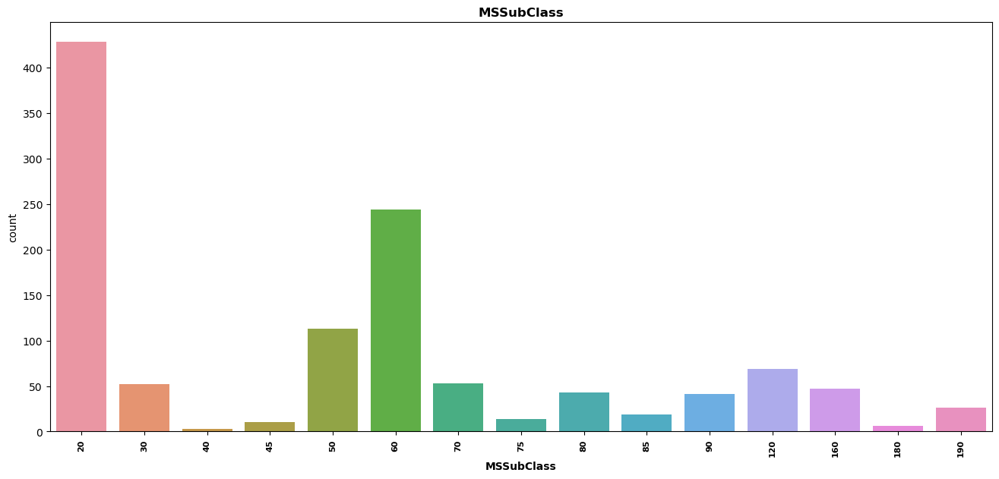

**Observations for MSSubClass :**

,Value,Count,% Count
0,20,428,36.6
1,60,244,20.9
2,50,113,9.7
3,120,69,5.9
4,70,53,4.5
5,30,52,4.5
6,160,47,4.0
7,80,43,3.7
8,90,41,3.5
9,190,26,2.2


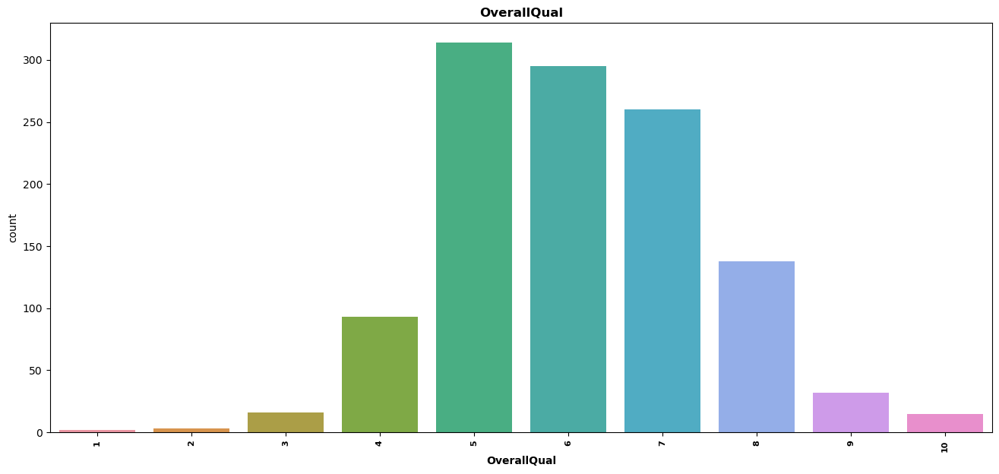

**Observations for OverallQual :**

,Value,Count,% Count
0,5,314,26.9
1,6,295,25.3
2,7,260,22.3
3,8,138,11.8
4,4,93,8.0
5,9,32,2.7
6,3,16,1.4
7,10,15,1.3
8,2,3,0.3
9,1,2,0.2


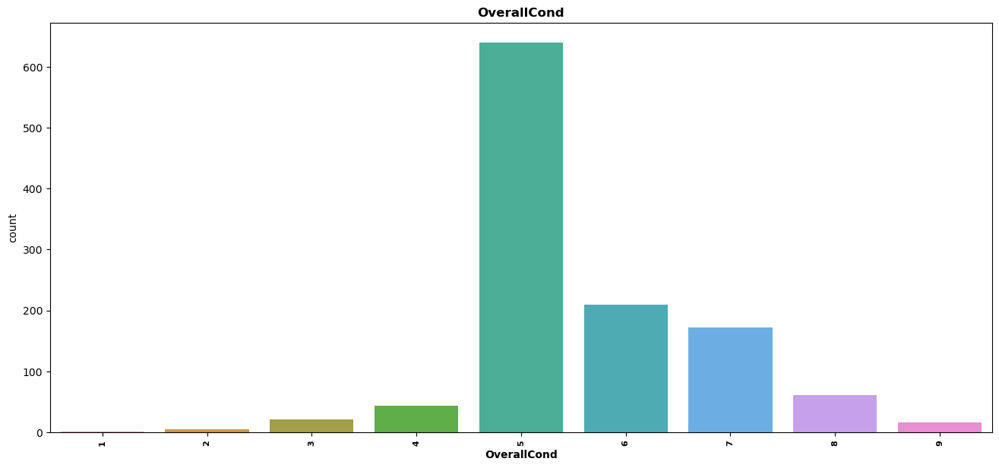

**Observations for OverallCond :**

,Value,Count,% Count
0,5,640,54.8
1,6,209,17.9
2,7,172,14.7
3,8,61,5.2
4,4,43,3.7
5,3,21,1.8
6,9,16,1.4
7,2,5,0.4
8,1,1,0.1


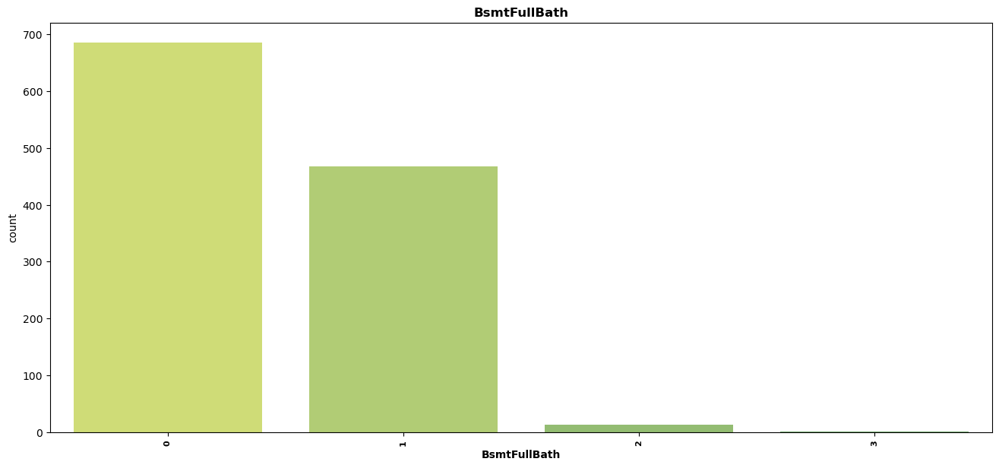

**Observations for BsmtFullBath :**

,Value,Count,% Count
0,0,686,58.7
1,1,468,40.1
2,2,13,1.1
3,3,1,0.1


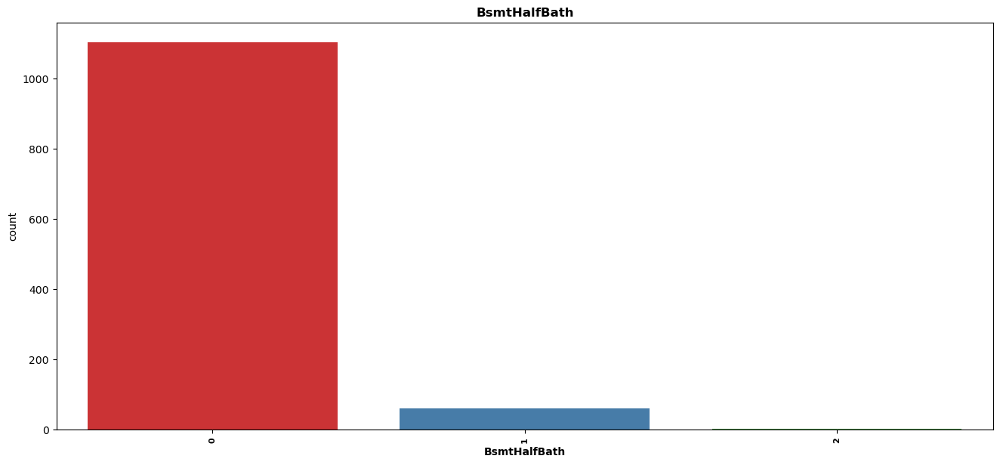

**Observations for BsmtHalfBath :**

,Value,Count,% Count
0,0,1105,94.6
1,1,61,5.2
2,2,2,0.2


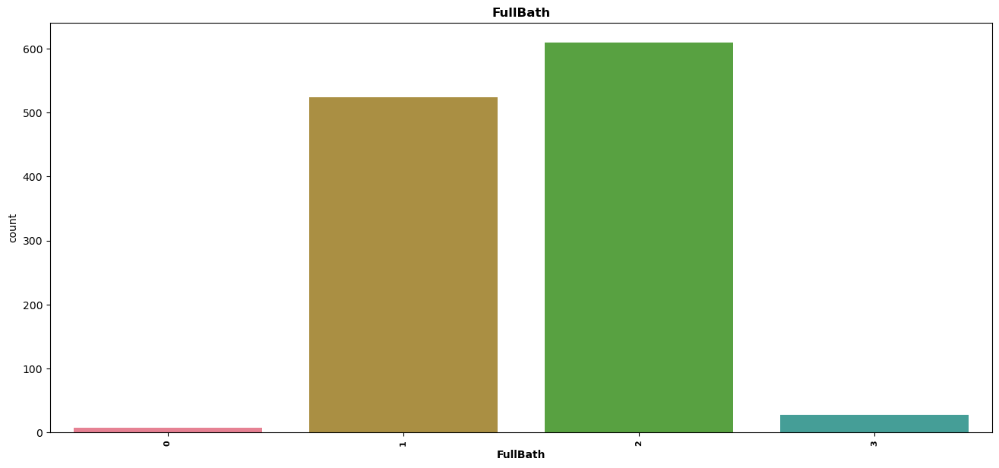

**Observations for FullBath :**

,Value,Count,% Count
0,2,610,52.2
1,1,524,44.9
2,3,27,2.3
3,0,7,0.6


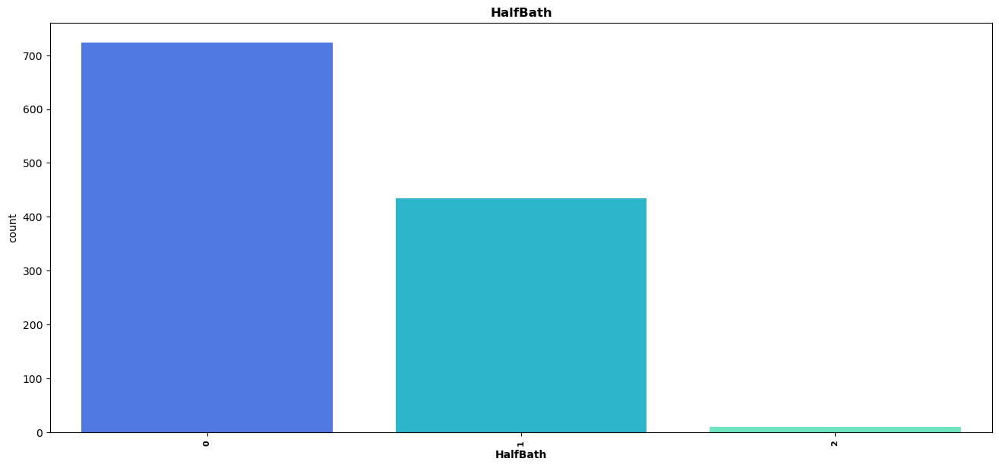

**Observations for HalfBath :**

,Value,Count,% Count
0,0,724,62.0
1,1,434,37.2
2,2,10,0.9


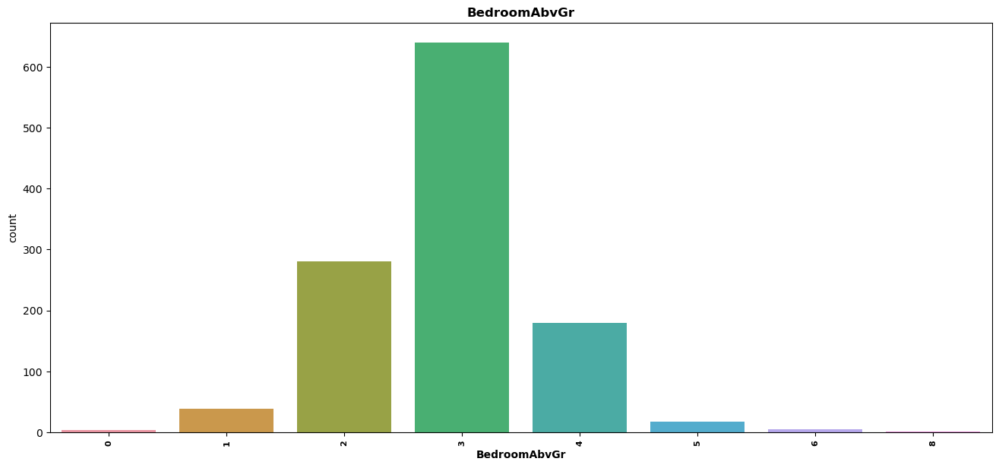

**Observations for BedroomAbvGr :**

,Value,Count,% Count
0,3,640,54.8
1,2,281,24.1
2,4,180,15.4
3,1,39,3.3
4,5,18,1.5
5,6,5,0.4
6,0,4,0.3
7,8,1,0.1


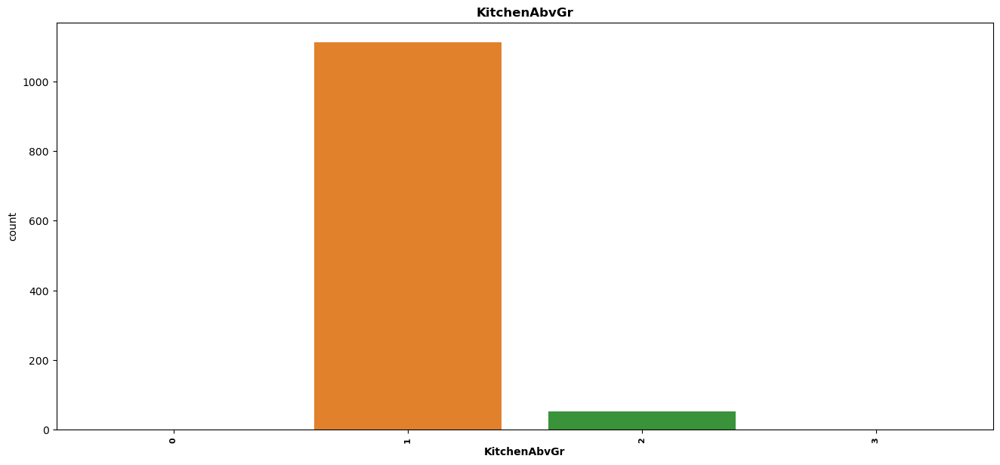

**Observations for KitchenAbvGr :**

,Value,Count,% Count
0,1,1114,95.4
1,2,52,4.5
2,3,1,0.1
3,0,1,0.1


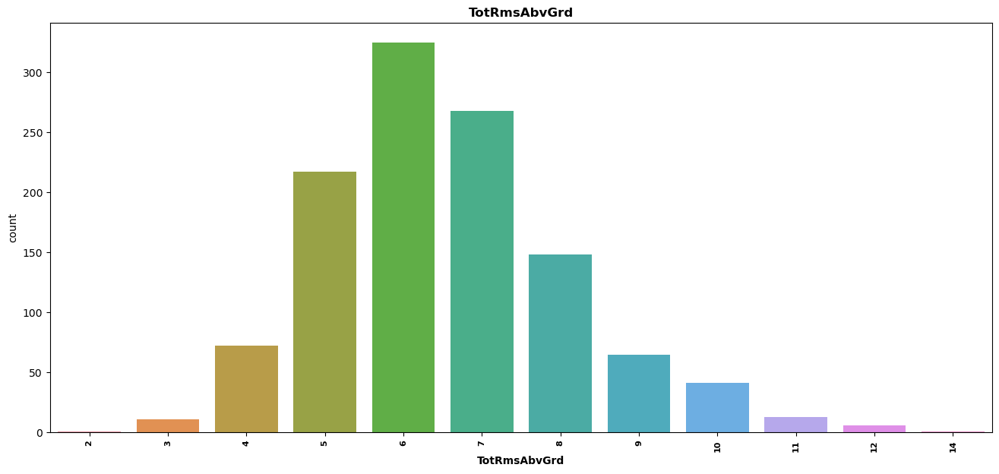

**Observations for TotRmsAbvGrd :**

,Value,Count,% Count
0,6,325,27.8
1,7,268,22.9
2,5,217,18.6
3,8,148,12.7
4,4,72,6.2
5,9,65,5.6
6,10,41,3.5
7,11,13,1.1
8,3,11,0.9
9,12,6,0.5


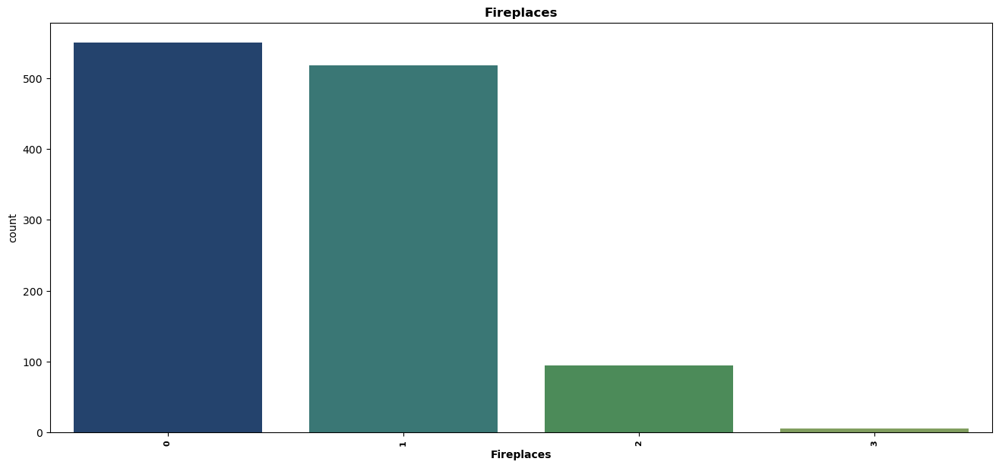

**Observations for Fireplaces :**

,Value,Count,% Count
0,0,551,47.2
1,1,518,44.3
2,2,94,8.0
3,3,5,0.4


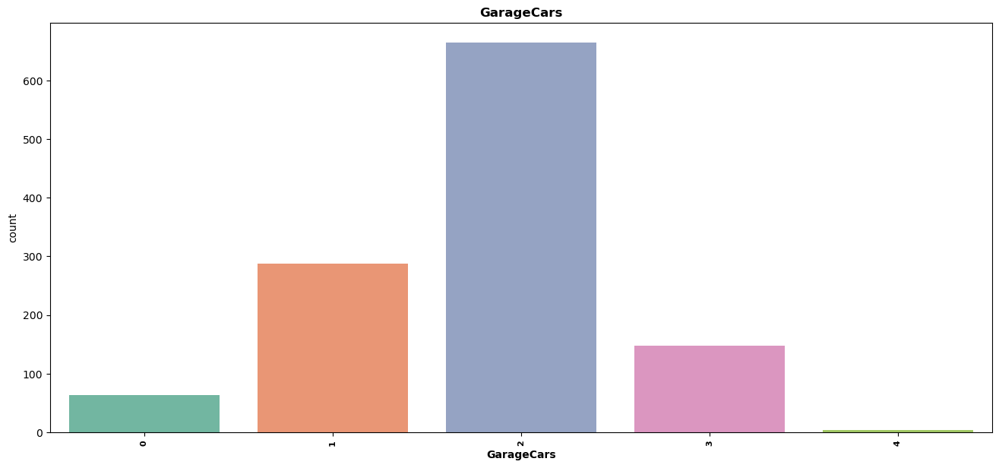

**Observations for GarageCars :**

,Value,Count,% Count
0,2,665,56.9
1,1,288,24.7
2,3,147,12.6
3,0,64,5.5
4,4,4,0.3


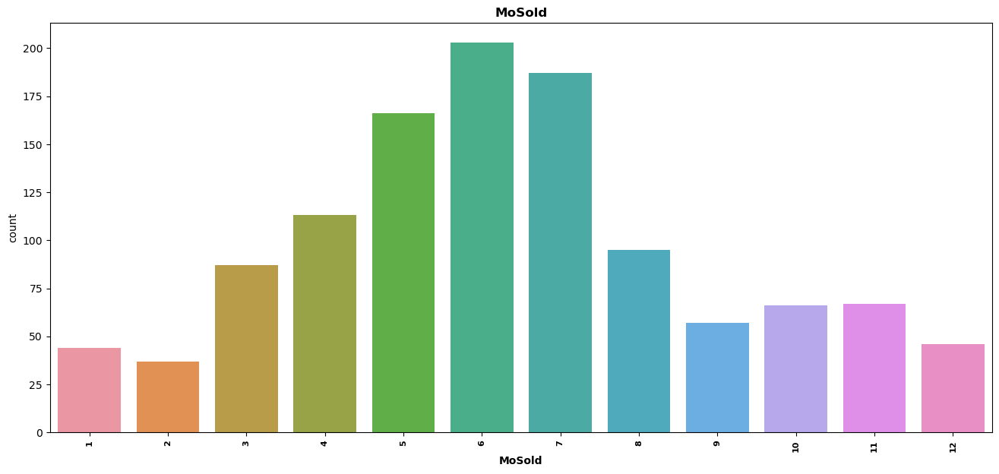

**Observations for MoSold :**

,Value,Count,% Count
0,6,203,17.4
1,7,187,16.0
2,5,166,14.2
3,4,113,9.7
4,8,95,8.1
5,3,87,7.4
6,11,67,5.7
7,10,66,5.7
8,9,57,4.9
9,12,46,3.9


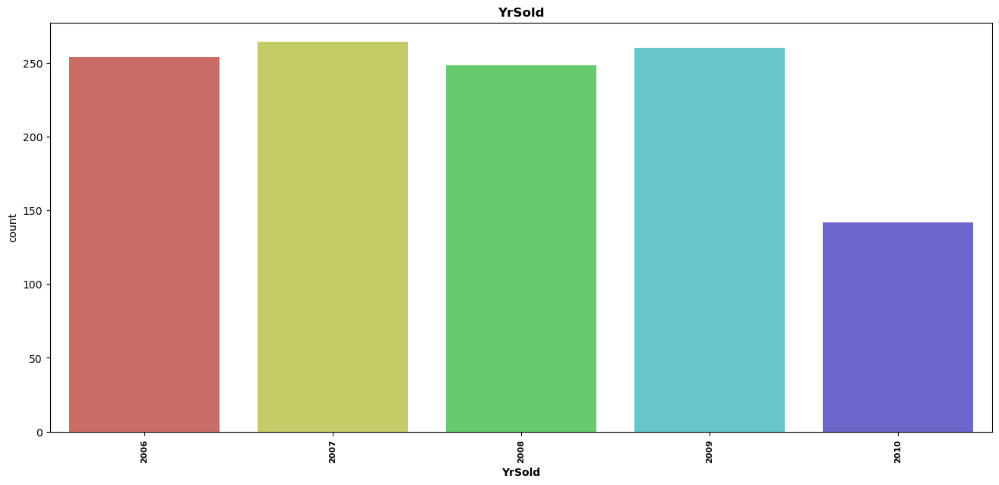

**Observations for YrSold :**

,Value,Count,% Count
0,2007,264,22.6
1,2009,260,22.3
2,2006,254,21.7
3,2008,248,21.2
4,2010,142,12.2


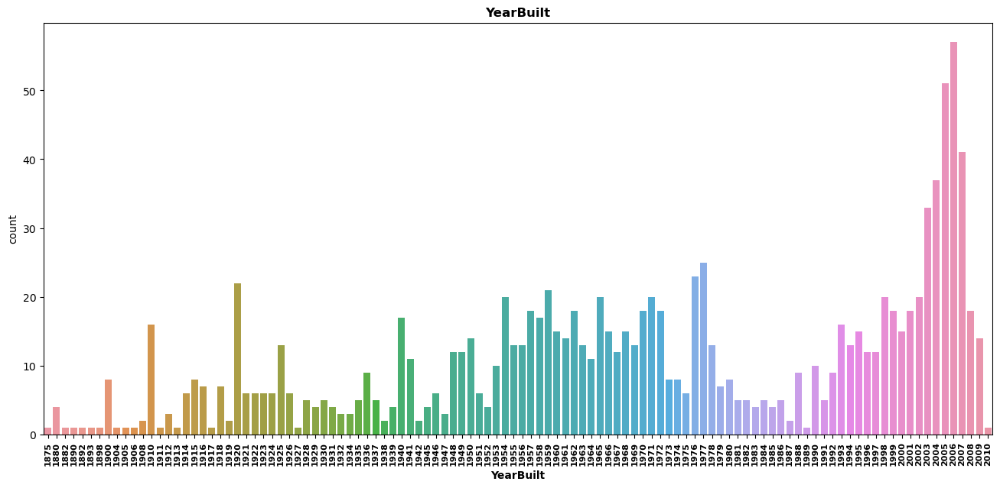

**Observations for YearBuilt :**

,Value,Count,% Count
0,2006,57,4.9
1,2005,51,4.4
2,2007,41,3.5
3,2004,37,3.2
4,2003,33,2.8
5,1977,25,2.1
6,1976,23,2.0
7,1920,22,1.9
8,1959,21,1.8
9,2002,20,1.7


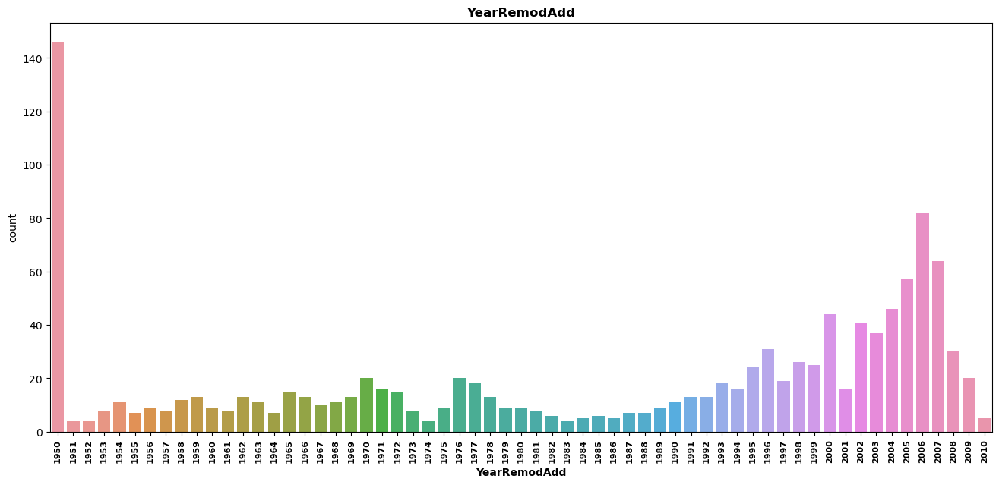

**Observations for YearRemodAdd :**

,Value,Count,% Count
0,1950,146,12.5
1,2006,82,7.0
2,2007,64,5.5
3,2005,57,4.9
4,2004,46,3.9
5,2000,44,3.8
6,2002,41,3.5
7,2003,37,3.2
8,1996,31,2.7
9,2008,30,2.6


In [33]:
colors=['husl','Dark2','Set2_r','summer_r','Set1','husl','rainbow','coolwarm','tab10','rainbow_r','gist_earth','Set2','prism',
        'hls','Paired','rocket','mako','flare','Blues_r','Accent', 'Blues', 'BrBG', 'BuGn', 'BuPu', 'CMRmap','Dark2', 'GnBu', 'Greens', 'Greys', 'OrRd', 'Oranges','PRGn',
        'Paired', 'Pastel1', 'Pastel2', 'PiYG','PuBu', 'PuOr', 'PuRd', 'Purples', 'RdBu','RdGy', 'RdPu', 'RdYlBu', 'RdYlGn',
        'Reds', 'Set1','Set2', 'Set3', 'Spectral', 'Wistia', 'YlGn','YlOrBr', 'YlOrRd', 'afmhot', 'autumn', 'binary','bone',
        'brg', 'bwr', 'cividis', 'cool', 'coolwarm','copper', 'cubehelix', 'flag', 'gist_earth','gist_gray', 'gist_heat', 
        'gist_ncar', 'gist_rainbow','gist_stern', 'gist_yarg', 'gnuplot', 'gnuplot2', 'gray','hot', 'hsv', 'icefire', 
        'inferno', 'jet', 'magma','mako', 'nipy_spectral', 'ocean', 'pink', 'plasma','prism', 'rainbow', 'rocket', 
        'seismic', 'spring','summer', 'tab10', 'tab20','terrain', 'turbo', 'twilight','viridis', 'vlag', 'winter']

from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))

plotnumber =1
for i in df_int_cat:
    sns.set_palette(colors[plotnumber-1])
    if plotnumber <=16:
        f,ax=plt.subplots(1,1,figsize=(16,7))
        sns.countplot(df[i],data=df)
        ax.set_title(i,fontsize=12,fontweight ='bold')
        ax.set_xlabel(i,fontsize=10,fontweight ='bold')
        plt.xticks(fontsize=8,fontweight ='bold',rotation=90)
    plotnumber+=1
    plt.show()
    length=df[i].nunique()
    printmd("**Observations for {} :**".format(i))   
    length=df[i].nunique()
    name=[]
    value_count=[]
    percent_value_count=[]
    for j in range(length):
        name.append(df[i].value_counts().index.values[j])
        value_count.append((df[i].value_counts()).iloc[j])
        percent_value_count.append(round(((df[i].value_counts()).iloc[j])*100/(df[i].value_counts().sum()),1))
    df_value_count=pd.DataFrame({'Value':name,'Count':value_count,'% Count': percent_value_count})
    display(df_value_count)
    print("="*120)

### Univariate Graphical Analysis for Numerical data

In [34]:
len(df_numerical.columns)

18

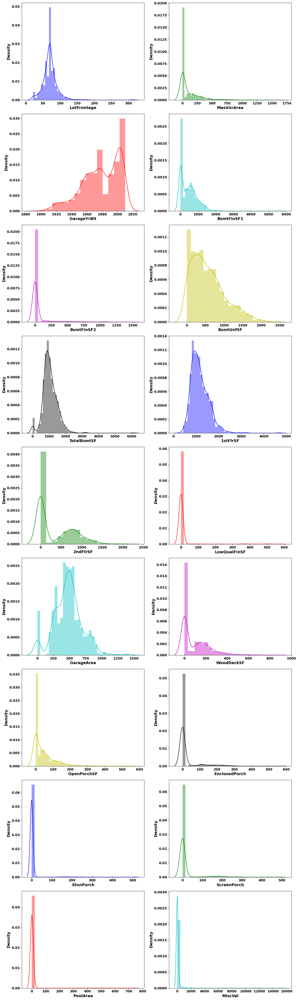

In [35]:
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,50),facecolor='white')
sns.set_palette('plasma')
plotnum=1
for col in df_numerical.columns:
    if plotnum<=18:
        plt.subplot(9,2,plotnum)
        sns.distplot(df[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

#### Observations:
- **All the columns are not normally distributed. The building blocks are out of the normalized curve.**
- **Std deviation is low in the columns 'BsmtFinSF2', '2ndFlrSF', 'LowQualFinSF', 'WoodDeckSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal' and high in the remaining columns**

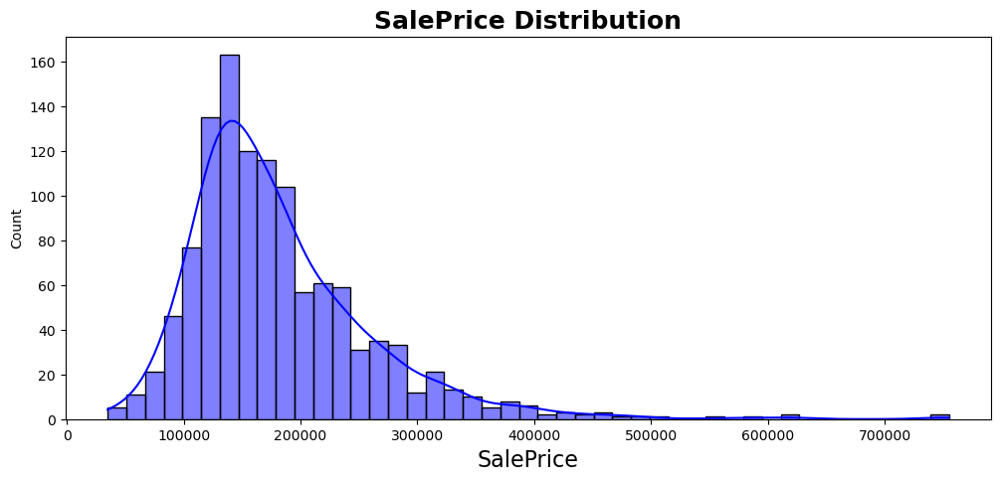

In [36]:
# Checking the variaiton in SalePrice
plt.figure(figsize=(12,5))
sns.histplot(df["SalePrice"], kde=True, color='b')
plt.xlabel('SalePrice',fontsize=16)
plt.title('SalePrice Distribution', fontsize=18,fontweight ='bold')
plt.show()

#### Observations for target variable:
- **The curve is not normally distributed and right skewed**

### Bivariate Graphical Analysis for categorical data

In [37]:
len(df_cat_str)

38

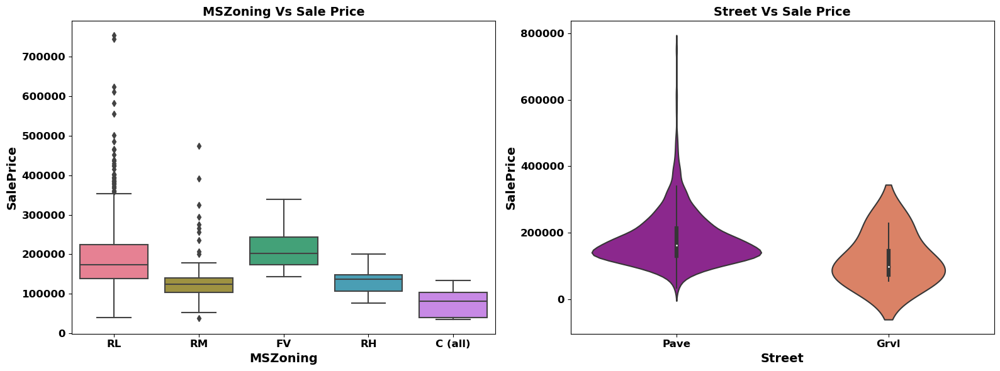

In [38]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[0]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[0]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[0], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[1]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[1]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[1], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher in Residential Low Density zone where as it is lower in Commercial zone**
- **Sale Price of the property is higher with Paved type of road access to property where as it is lower Gravel type of road access to property**

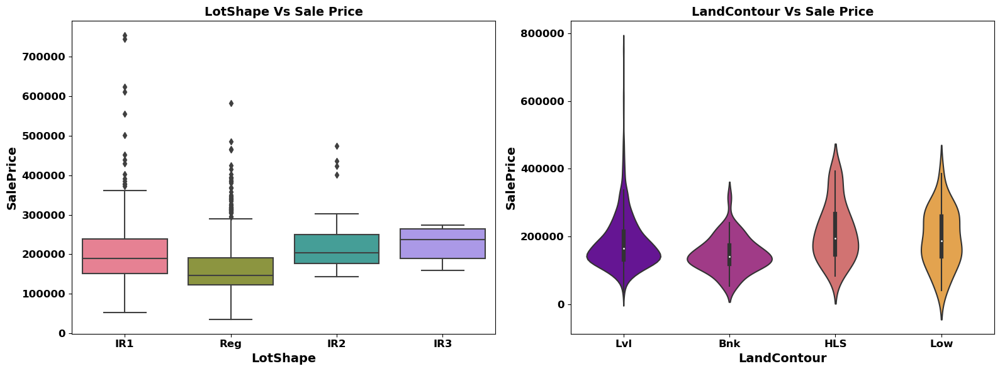

In [39]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[2]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[2]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[2], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[3]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[3]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[3], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Slightly irregular shape of property where as it is lower with irregular shape**
- **Sale Price of the property is higher with Near Flat/Level Flatness of property**

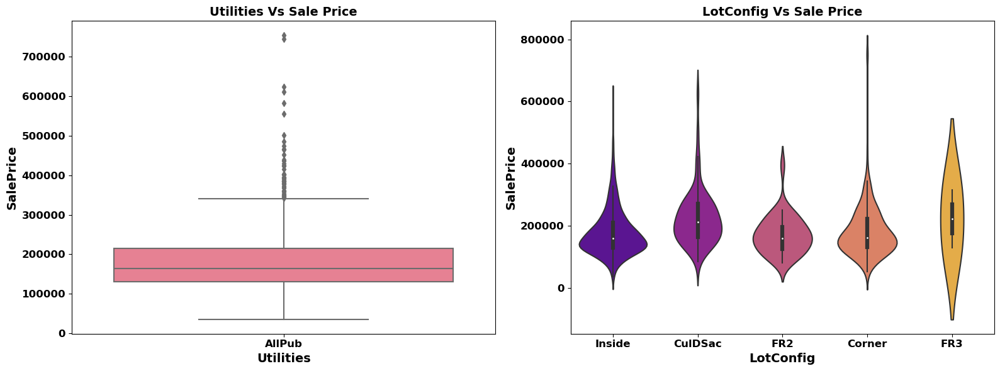

In [40]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[4]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[4]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[4], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[5]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[5]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[5], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **No relation between Sale Price of the property Utilities as there is only utility**
- **Sale Price of the property is higher with Corner lot configuration where as it is lower with Frontage on 2 sides of property**

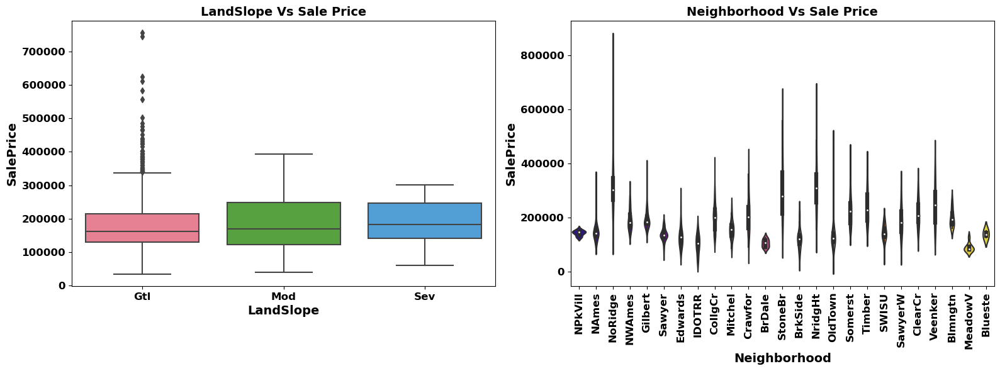

In [41]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[6]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[6]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[6], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[7]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[7]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[7], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Gentle slope of property where as it is lower with Severe Slope of the property**
- **Sale Price of the property is higher near to Northridge location where as it is lower near to Briardale location**

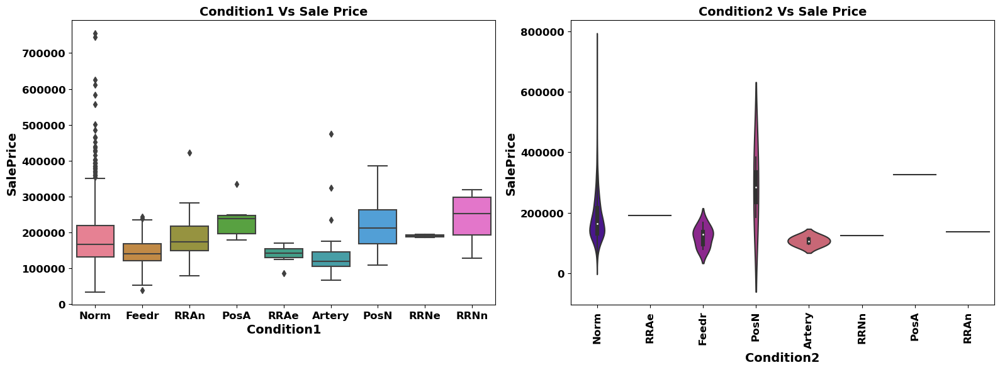

In [42]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[8]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[8]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[8], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[9]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[9]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[9], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher in Normal condition where as it is lower in Adjacent to East-West Railroad**
- **Sale Price of the property is higher in Normal condition where as it is lower Within 200' of North-South Railroad**

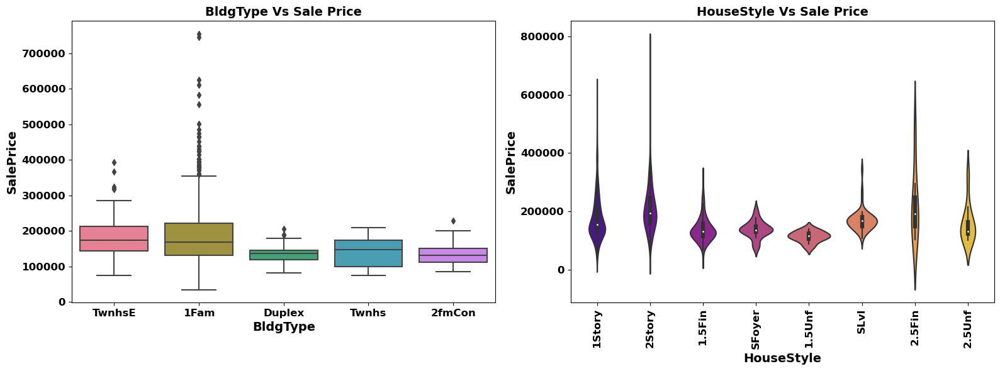

In [43]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[10]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[10]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[10], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[11]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[11]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[11], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Single-family Detached type of dwelling where as it is lower with Duplex**
- **Sale Price of the property is higher with Two story style of dwelling where as it is lower with One and one-half story: 2nd level unfinished type of dwelling**

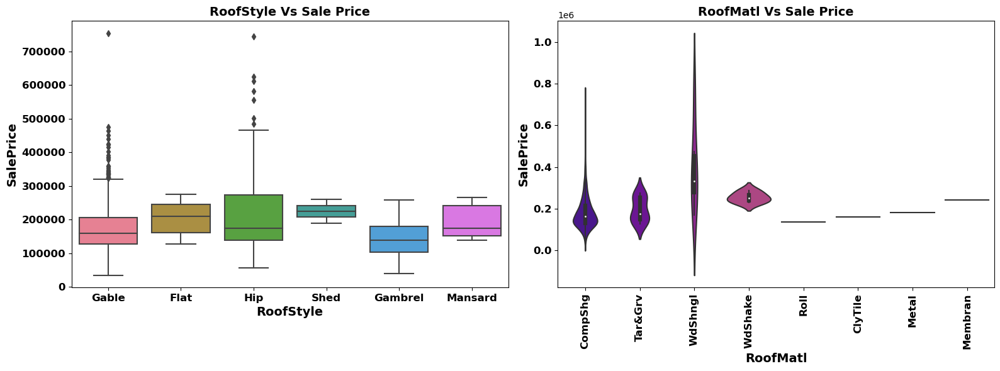

In [44]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[12]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[12]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[12], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[13]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[13]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[13], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Hip type of roof where as it is lower with Gabrel type of roof**
- **Sale Price of the property is higher with Wood Shingles roof material where as it is lower with Roll roof material**

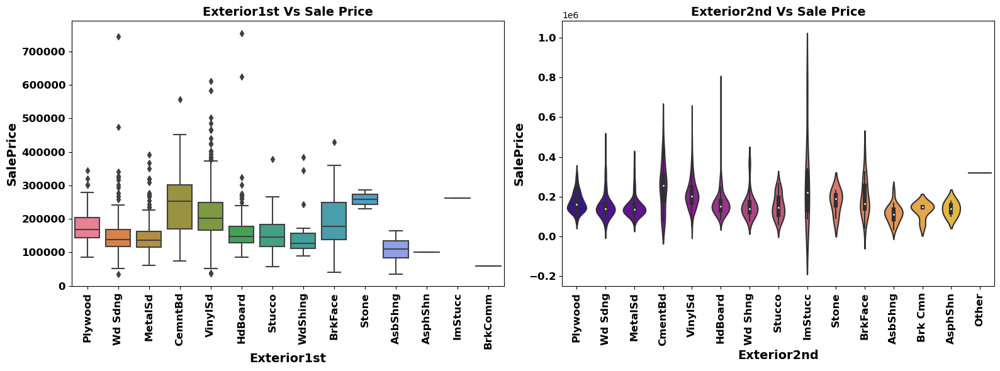

In [45]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[14]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[14]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[14], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[15]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[15]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[15], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Hard Board Exterior covering on house but seems like an outlier where as it is lower with Wood Siding Exterior covering on house**
- **Sale Price of the property is higher as well as lower with Imitation Stucco Exterior covering on house**

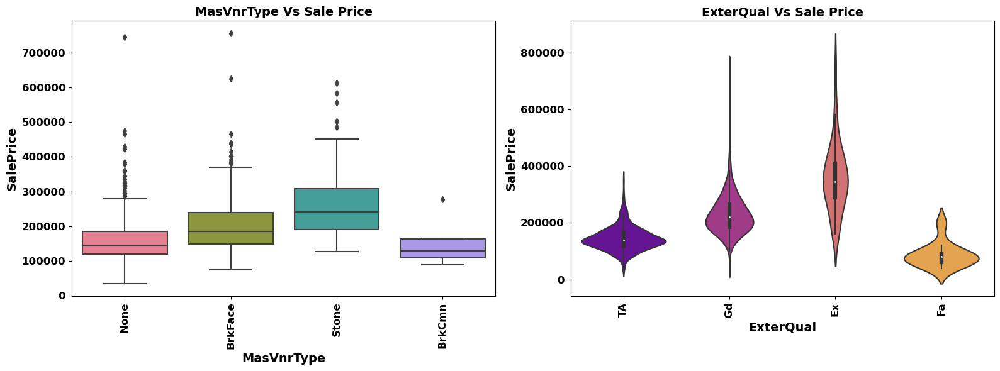

In [46]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[16]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[16]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[16], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[17]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[17]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[17], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Brick Face Masonry veneer type**
- **Sale Price of the property is higher with Excellent quality of the material on the exterior where as it is lower with Fair quality of the material on the exterior**

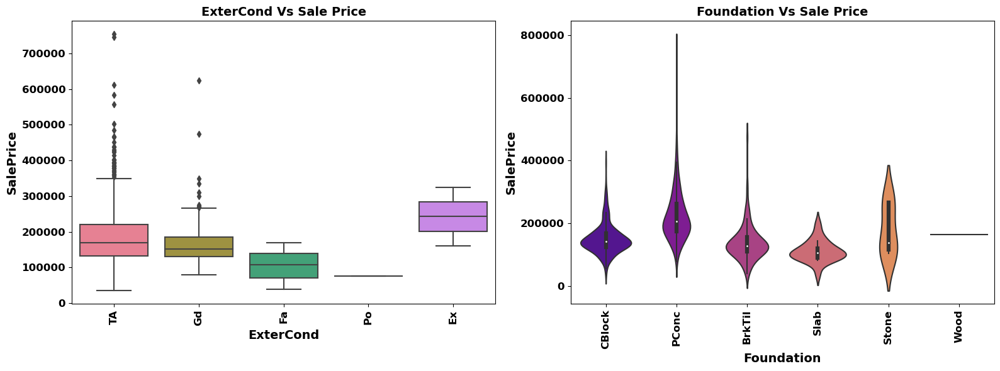

In [47]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[18]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[18]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[18], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[19]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[19]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[19], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Average/Typical condition of the material on the exterior where as it is lower with Fair condition of the material on the exterior**
- **Sale Price of the property is higher with Poured Contrete type of foundation where as it is lower with Stone type of foundation**

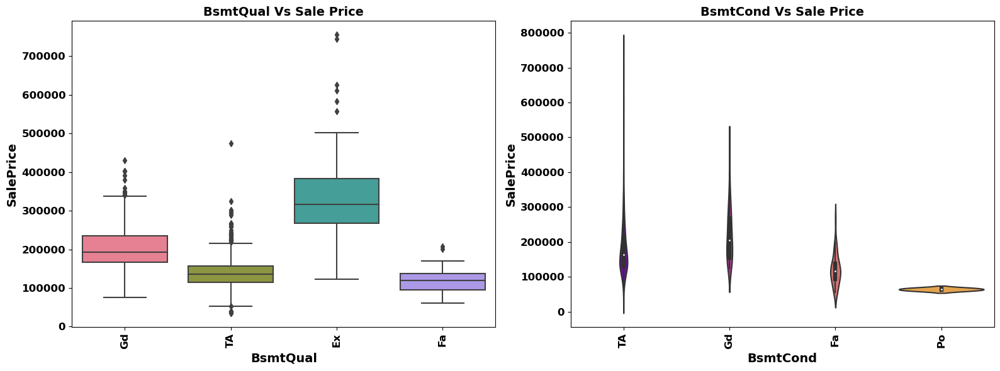

In [48]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[20]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[20]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[20], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[21]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[21]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[21], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Excellent (100+ inches) height of the basement where as it is lower with typical (80-89 inches) height of the basement**
- **Sale Price of the property is higher with Typical - slight dampness allowed condition of the basement where as it is lower with Fair - dampness or some cracking or settling condition of the basement**

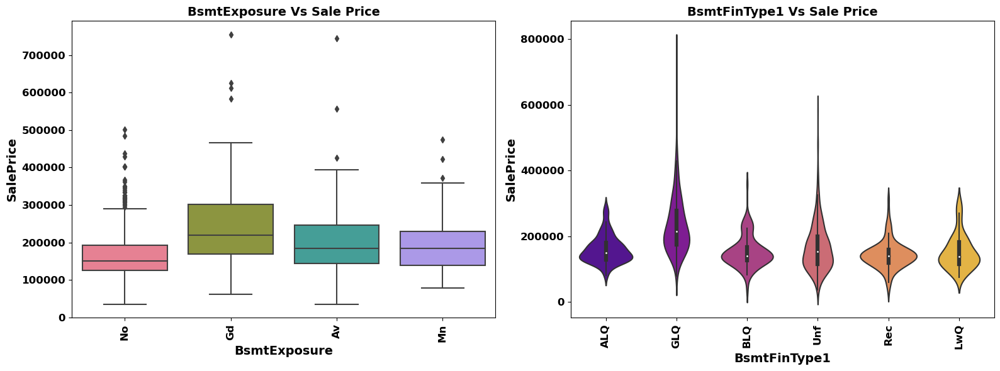

In [49]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[22]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[22]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[22], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[23]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[23]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[23], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Good basement Exposure where as it is lower with No basement Exposure**
- **Sale Price of the property is higher with Good Living Quarters Rating of basement finished area where as it is lower with Unfinshed Rating of basement finished area**

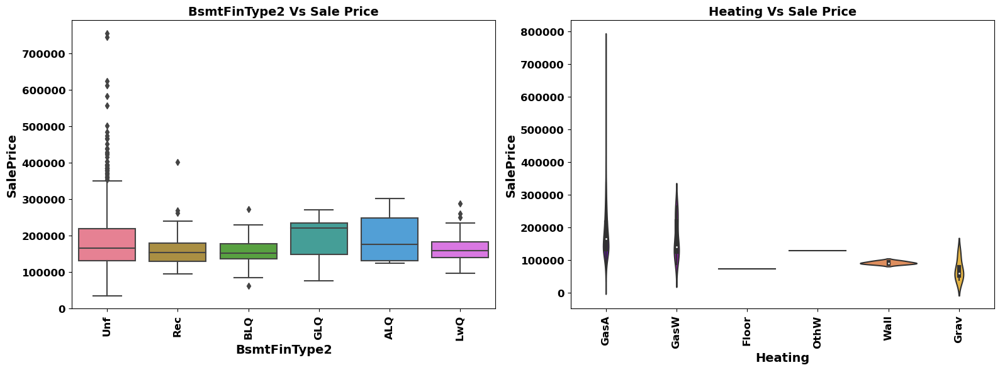

In [50]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[24]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[24]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[24], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[25]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[25]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[25], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher and lower as well with Unfinshed Rating of basement finished area**
- **Sale Price of the property is higher with Gas forced warm air furnace type of heating where as it is lower with Gravity furnace type of heating**

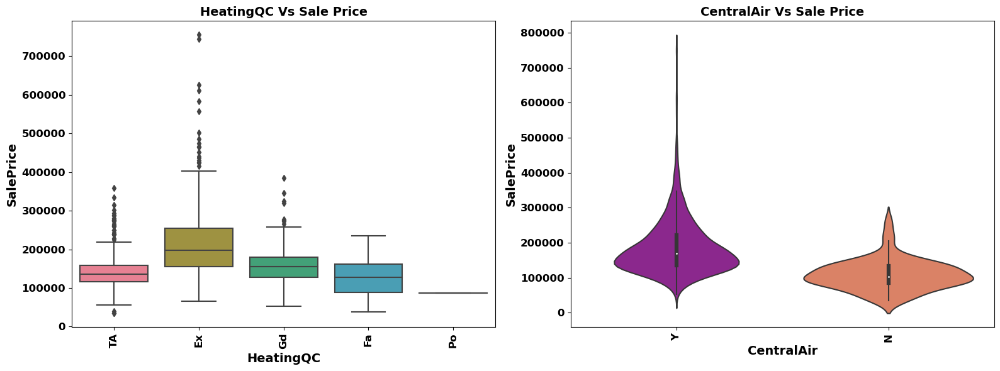

In [51]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[26]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[26]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[26], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[27]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[27]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[27], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Excellent Heating quality and condition where as it is lower with Average/Typical Heating quality and condition**
- **Sale Price of the property is higher with Central air conditioning where as it is lower with no Central air conditioning**

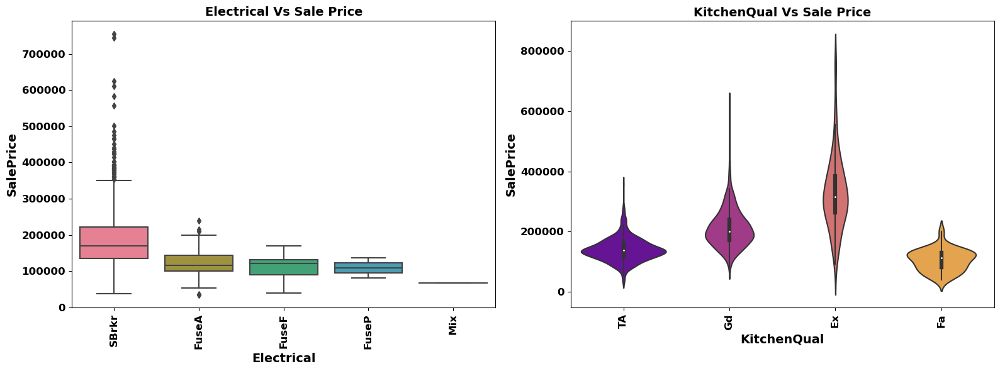

In [52]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[28]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[28]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[28], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[29]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[29]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[29], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Standard Circuit Breakers Electrical system & Romex where as it is lower with Fuse Box over 60 AMP and all Romex wiring (Average) Electrical system**
- **Sale Price of the property is higher with excellent Kitchen quality where as it is lower with Typical/Average kitchen quality**

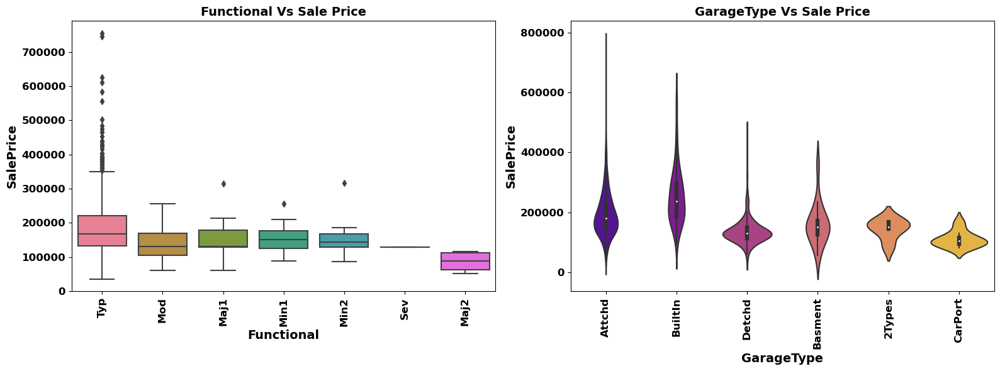

In [53]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[30]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[30]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[30], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[31]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[31]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[31], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher and lower as well with Typical Home Functionality**
- **Sale Price of the property is higher with Attached to home attached to home where as it is lower with Basement Garage**

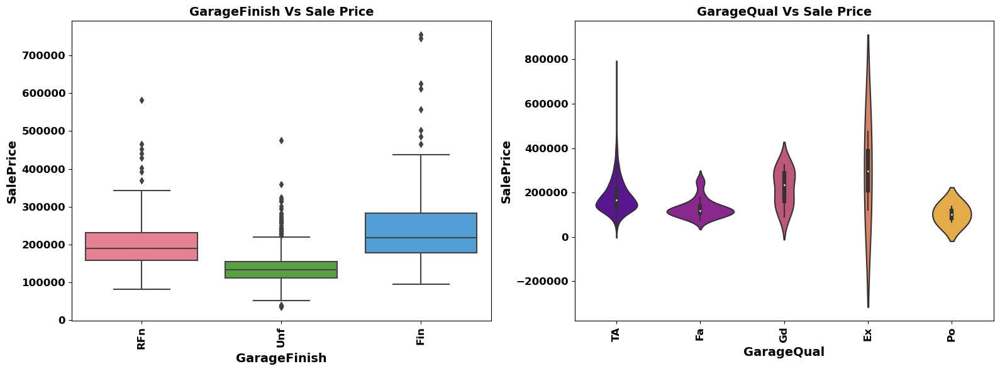

In [54]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[32]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[32]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[32], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[33]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[33]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[33], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Finished Interior finish of the garage where as it is lower with Unfinished Interior finish of the garage**
- **Sale Price of the property is higher with excellent Garage quality and surprisingly it is lower with same excellent Garage quality**

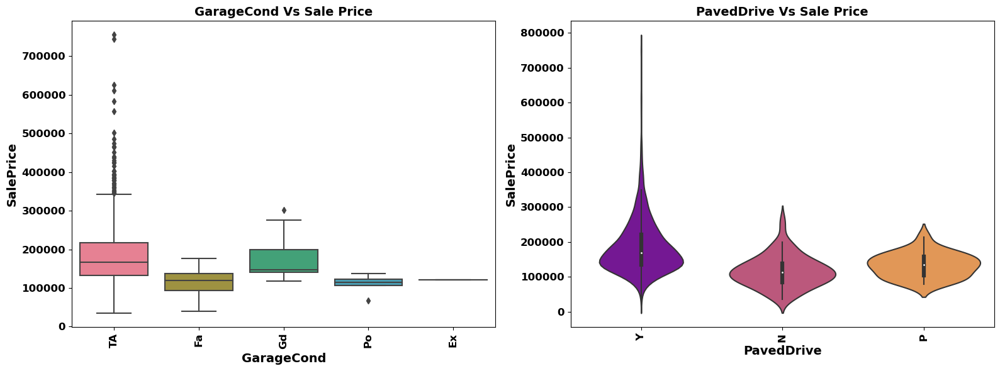

In [55]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[34]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[34]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[34], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[35]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[35]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[35], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with excellent Garage condition where as it is lower fair Garage condition**
- **Sale Price of the property is higher with Paved driveway**

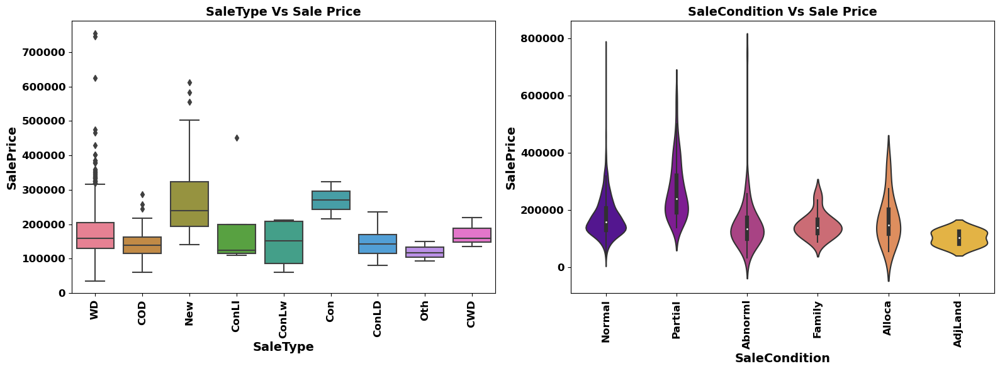

In [56]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_cat_str[36]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_cat_str[36]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[36], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_cat_str[37]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_cat_str[37]),fontsize=14, fontweight='bold')
plt.xlabel(df_cat_str[37], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher and lower as well with Warranty Deed - Conventional type of sale**
- **Sale Price of the property is higher with Abnormal condition of Sale (trade, foreclosure, short sale) where as it is lower with Allocation (two linked properties with separate deeds, typically condo with a garage unit)**

In [57]:
len(df_int_cat)

16

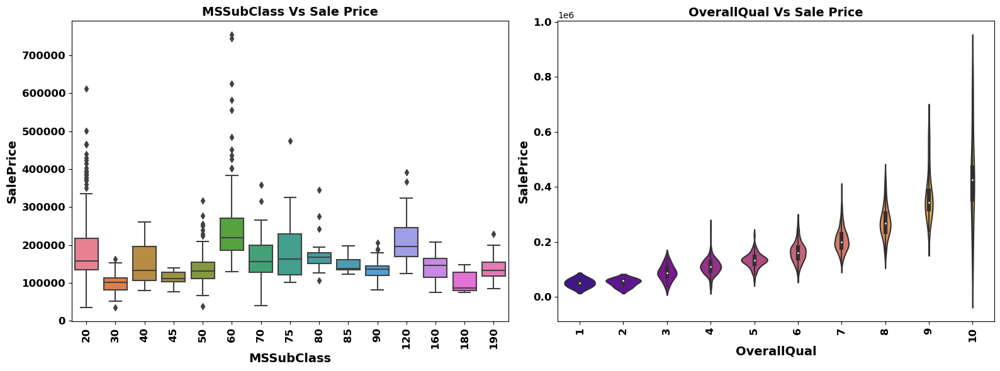

In [58]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_int_cat[0]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_int_cat[0]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[0], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_int_cat[1]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_int_cat[1]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[1], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with 2-STORY 1946 & NEWER type of dwelling where as it is lower with 1-STORY 1945 & OLDER type of dwelling**
- **Sale Price of the property is increasing with overall quality of the material and finish of the house**

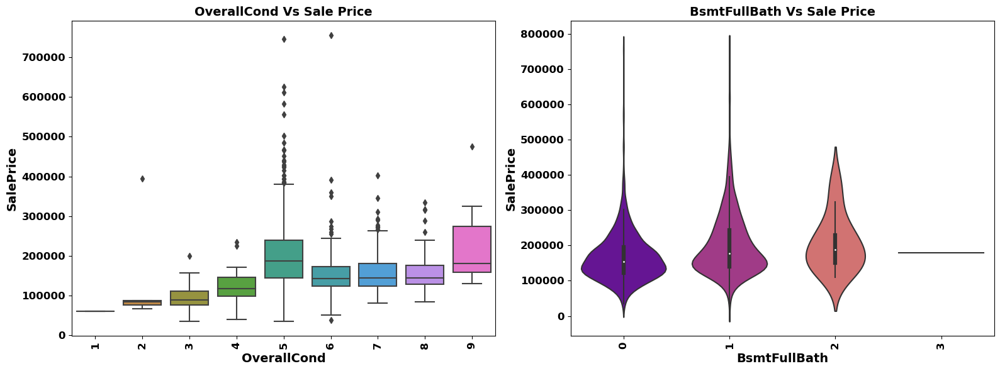

In [59]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_int_cat[2]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_int_cat[2]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[2], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_int_cat[3]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_int_cat[3]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[3], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with Average overall condition of the house based on the plot howerver it seems like there are outliers with this data. But of most of the times, sale price property is higher with excellent quality condition of the house**
- **Sale Price of the property is higher with 0 or 1 Basement full bathrooms**

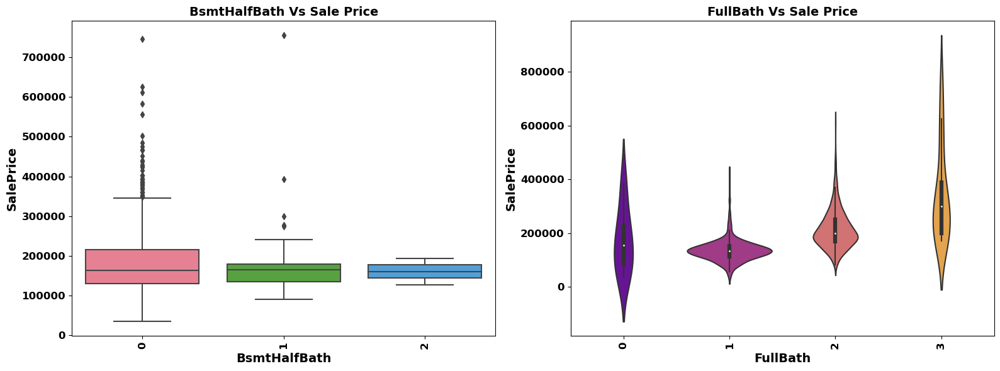

In [60]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_int_cat[4]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_int_cat[4]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[4], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_int_cat[5]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_int_cat[5]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[5], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with 0 Basement full bathrooms**
- **Sale Price of the property is higher with 3 Full bathrooms above grade**

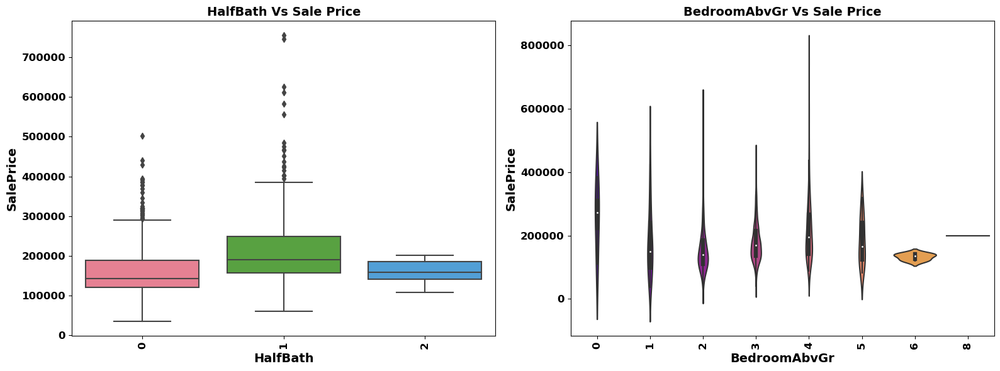

In [61]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_int_cat[6]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_int_cat[6]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[6], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_int_cat[7]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_int_cat[7]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[7], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with 1 Half baths above grade and lower with no Half baths above grade
- **Sale Price of the property is higher with 4 Bedrooms above grade and lower with no Bedrooms above grade**

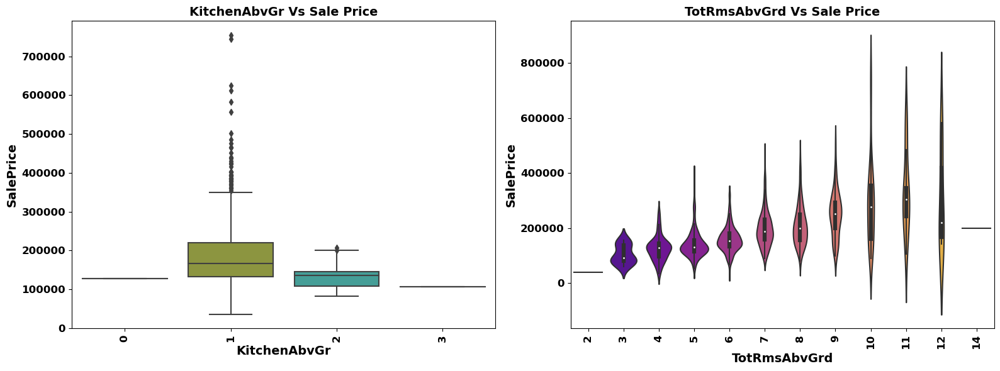

In [62]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_int_cat[8]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_int_cat[8]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[8], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_int_cat[9]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_int_cat[9]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[9], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with 1 Kitchens above grade**
- **Sale Price of the property is higher with 10 Total rooms above grade**

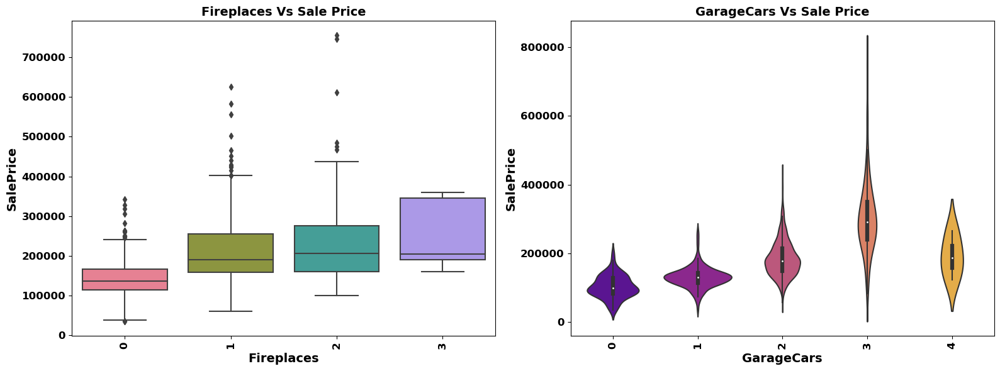

In [63]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_int_cat[10]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_int_cat[10]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[10], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_int_cat[11]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_int_cat[11]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[11], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher with 2 Number of fireplaces where as it is lower with no fireplaces**
- **Sale Price of the property is higher with 3 Size of garage in car capacity where as it is lower with no garage car capacity**

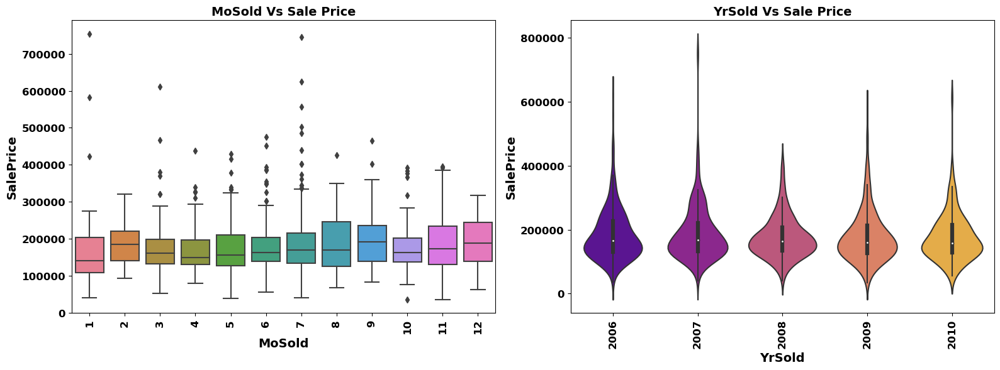

In [64]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.boxplot(df[df_int_cat[12]], df['SalePrice'], palette = 'husl')
plt.title('{} Vs Sale Price'.format(df_int_cat[12]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[12], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.violinplot(df[df_int_cat[13]], df['SalePrice'], palette = 'plasma')
plt.title('{} Vs Sale Price'.format(df_int_cat[13]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[13], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property is higher in 7th month of the year where as it is lower in 1st and 11th months of the year**
- **Sale Price of the property is higher in year 2007**

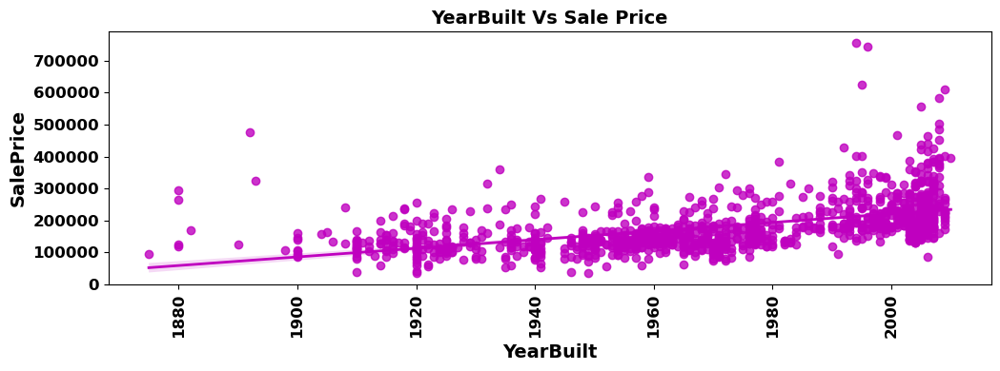

In [65]:
plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_int_cat[14], y='SalePrice',color='m',line_kws={'linewidth':2})
plt.title('{} Vs Sale Price'.format(df_int_cat[14]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[14], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()

#### Observations:
- **Sale Price of the property is higher for the properties built in latest times i.e. sale price is less for older properties**

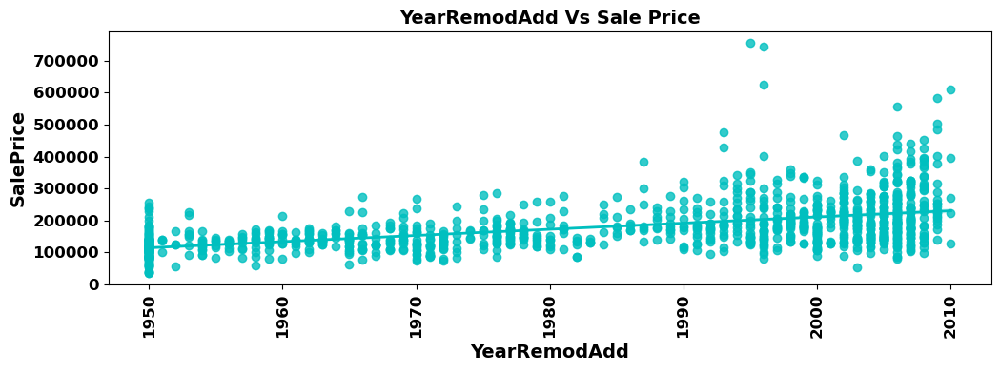

In [66]:
plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_int_cat[15], y='SalePrice',color='c',line_kws={'linewidth':2})
plt.title('{} Vs Sale Price'.format(df_int_cat[15]),fontsize=14, fontweight='bold')
plt.xlabel(df_int_cat[15], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()

#### Observations:
- **Price of properties start decreases over the time after remodelling**

### Bivariate Graphical Analysis for Numerical data

In [67]:
len(df_numerical.columns)

18

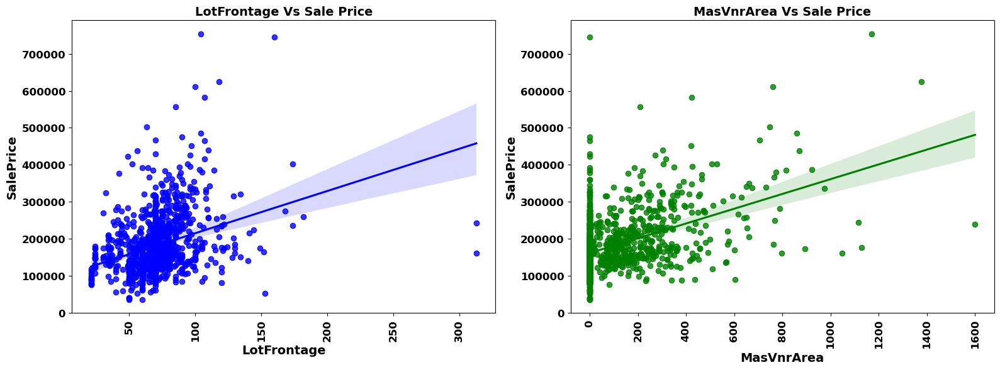

In [68]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_numerical.columns[0], y='SalePrice',color='b')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[0]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[0], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=df,x=df_numerical.columns[1], y='SalePrice',color='g')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[1]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[1], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property increases with increase in Linear feet of street connected to property**
- **Sale Price of the property increases with increase in Masonry veneer area**

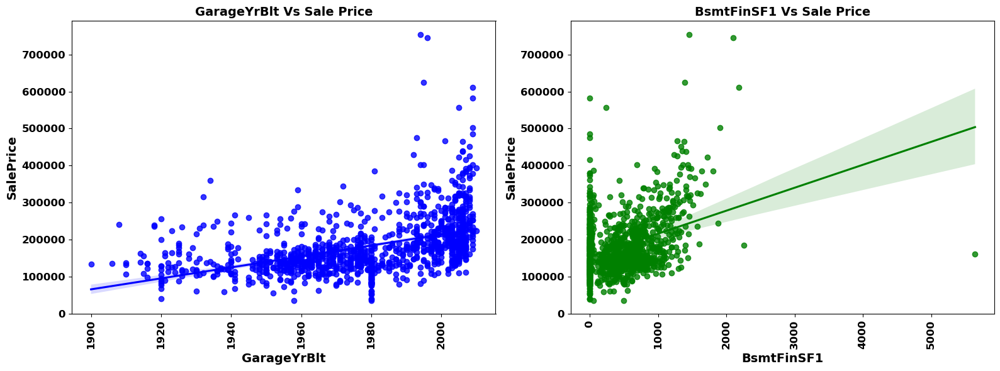

In [69]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_numerical.columns[2], y='SalePrice',color='b')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[2]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[2], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=df,x=df_numerical.columns[3], y='SalePrice',color='g')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[3]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[3], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Older the garage age less the price of Property**
- **Sale Price of the property increases with increase in Basement Type 1 finished square feet**

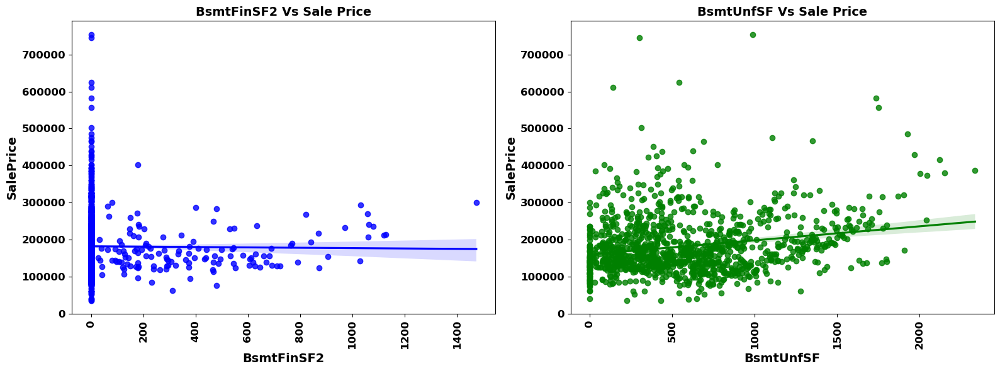

In [70]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_numerical.columns[4], y='SalePrice',color='b')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[4]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[4], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=df,x=df_numerical.columns[5], y='SalePrice',color='g')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[5]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[5], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **There is not much relation with Basement Type 2 finished square feet**
- **Sale Price of the property increases with increase in Unfinished square feet of basement area**

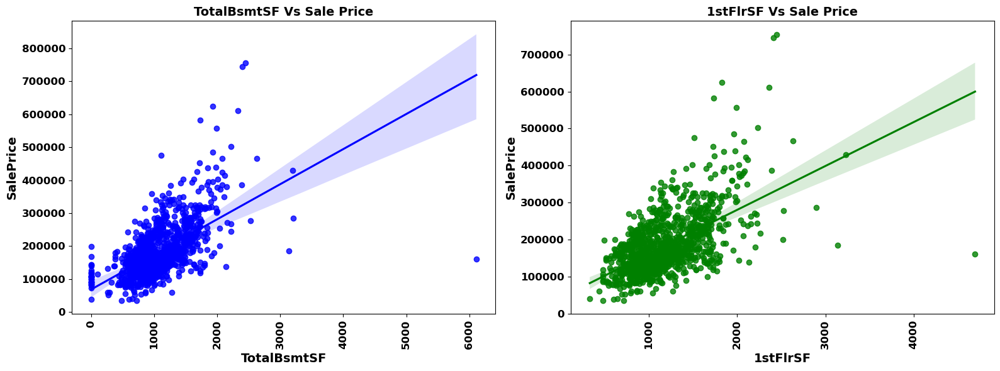

In [71]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_numerical.columns[6], y='SalePrice',color='b')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[6]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[6], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=df,x=df_numerical.columns[7], y='SalePrice',color='g')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[7]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[7], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property increases with increase in Total square feet of basement area**
- **Sale Price of the property increases with increase in First Floor square feet**

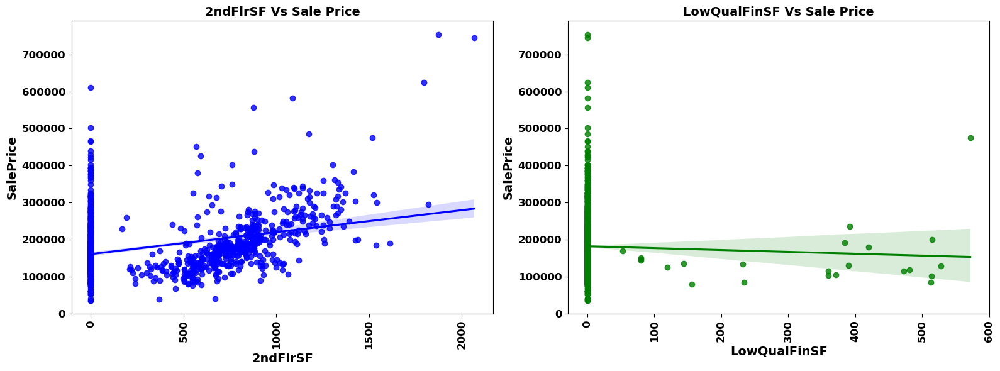

In [72]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_numerical.columns[8], y='SalePrice',color='b')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[8]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[8], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=df,x=df_numerical.columns[9], y='SalePrice',color='g')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[9]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[9], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property increases with increase in Second floor square feet**
- **Sale Price of the property increases with decrease in Low quality finished square feet (all floors)**

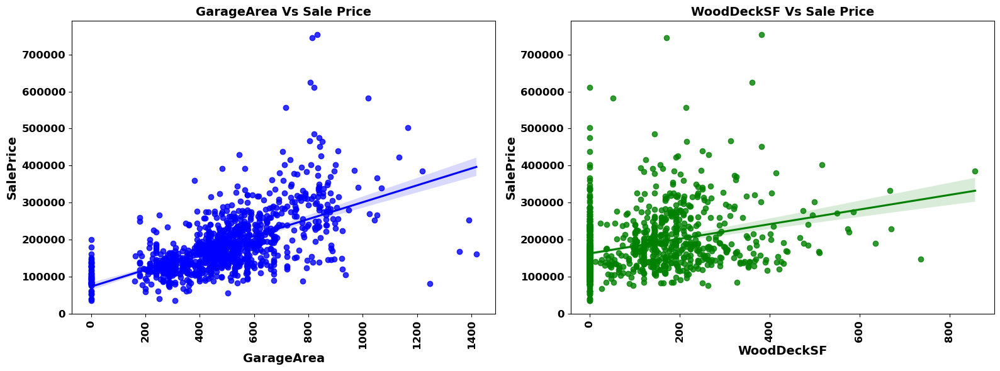

In [73]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_numerical.columns[10], y='SalePrice',color='b')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[10]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[10], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=df,x=df_numerical.columns[11], y='SalePrice',color='g')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[11]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[11], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property increases with Size of garage**
- **Sale Price of the property increases with increase in Wood deck area**

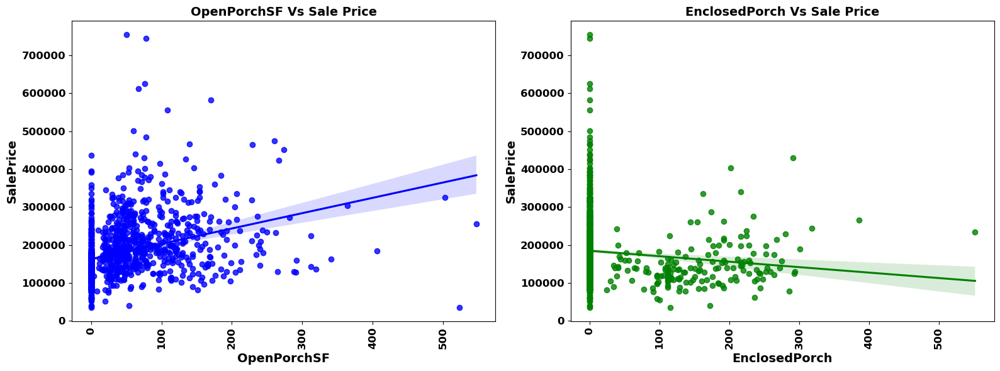

In [74]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_numerical.columns[12], y='SalePrice',color='b')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[12]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[12], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=df,x=df_numerical.columns[13], y='SalePrice',color='g')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[13]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[13], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property increases with increase in Open porch area**
- **Sale Price of the property increases with decrease in Enclosed porch area**

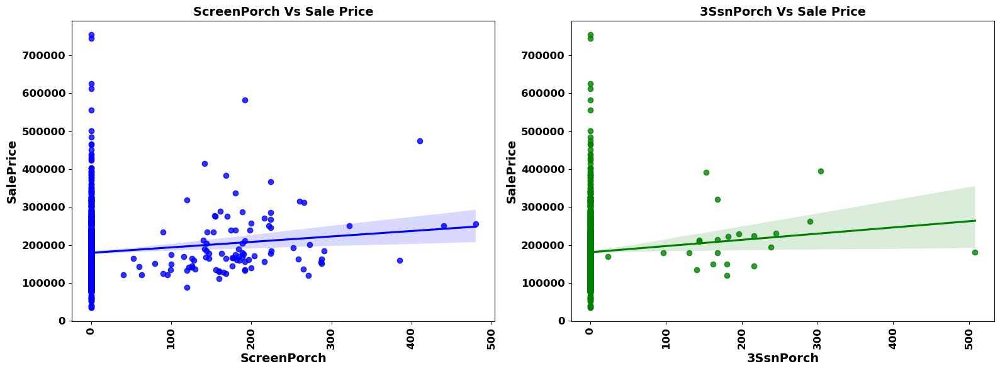

In [75]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_numerical.columns[15], y='SalePrice',color='b')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[15]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[15], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=df,x=df_numerical.columns[14], y='SalePrice',color='g')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[14]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[14], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property increases with increase in Screen porch area**
- **Sale Price of the property increases with increase in Three season porch area**

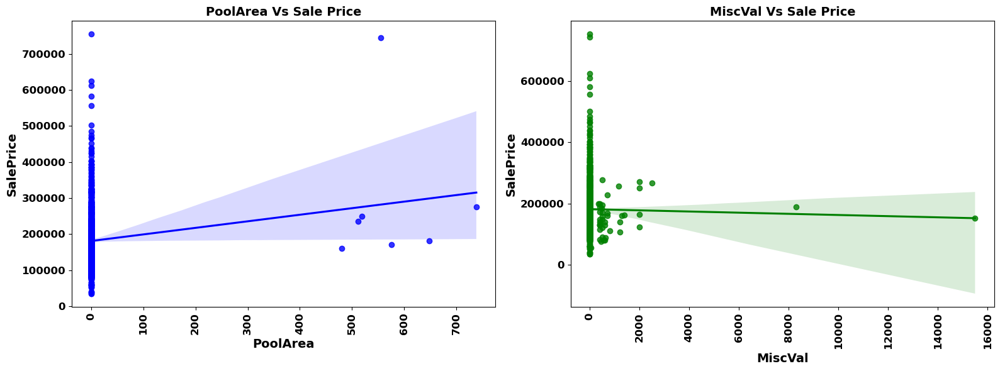

In [76]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=df,x=df_numerical.columns[16], y='SalePrice',color='b')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[16]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[16], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=df,x=df_numerical.columns[17], y='SalePrice',color='g')
plt.title('{} Vs Sale Price'.format(df_numerical.columns[17]),fontsize=14, fontweight='bold')
plt.xlabel(df_numerical.columns[17], fontsize=14,fontweight='bold')
plt.ylabel('SalePrice', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Sale Price of the property increases with increase in Pool area**
- **There is not much relation between sale price of the property and Misc values*

### Multivariate Graphical Analysis

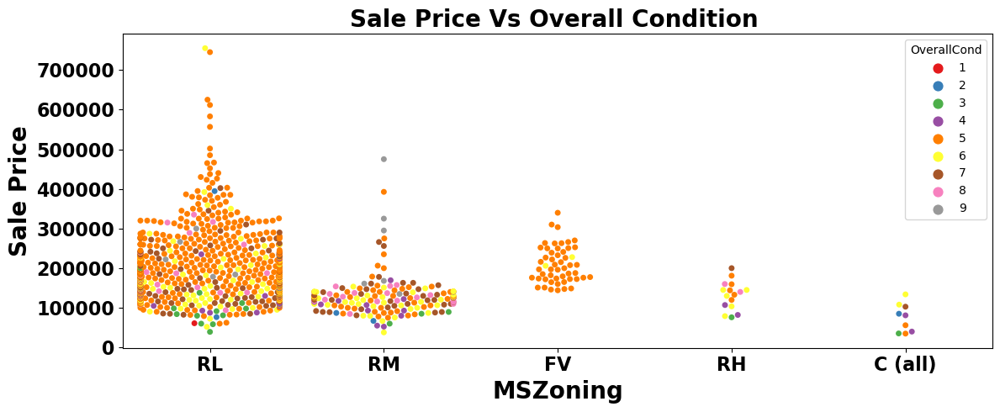

In [77]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('Set1')
plt.figure(figsize=(12,5))
sns.swarmplot(y=df['SalePrice'], x=df['MSZoning'], hue =df['OverallCond'])
plt.title("Sale Price Vs Overall Condition ",fontsize=20,fontweight ='bold')
plt.xlabel('MSZoning',fontsize = 20,fontweight ='bold')
plt.ylabel('Sale Price',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Most of properties for sale have overall condition rating of either 5 or 6.**
- **Sale price inside RL Zone is much higher than other remaining zones.**
- **Cheapest properties are available in Commerical zone.**

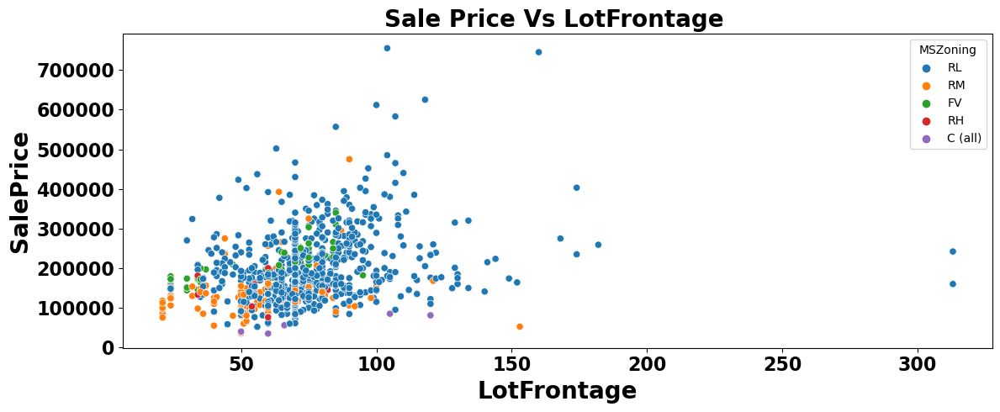

In [78]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('tab10')
plt.figure(figsize=(12,5))
sns.scatterplot(y=df['SalePrice'], x=df['LotFrontage'], hue =df['MSZoning'])
plt.title("Sale Price Vs LotFrontage ",fontsize=20,fontweight ='bold')
plt.xlabel('LotFrontage',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **With Exception of Commerical zone, as Lot Frontage area increases (which indicate Size of street connected to property); the Sale Price also increases**

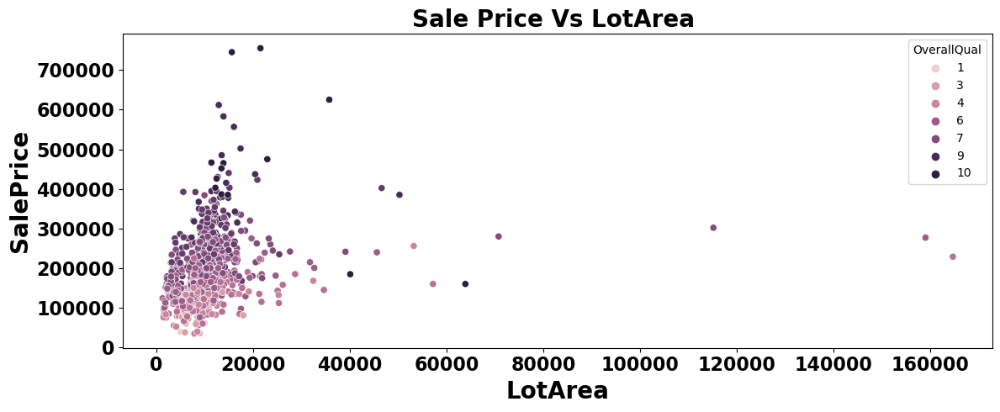

In [79]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('rainbow')
plt.figure(figsize=(12,5))
sns.scatterplot(y=df['SalePrice'], x=df['LotArea'], hue =df['OverallQual'])
plt.title("Sale Price Vs LotArea ",fontsize=20,fontweight ='bold')
plt.xlabel('LotArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **There is No Significant relationship found between Sale price & Lot area**

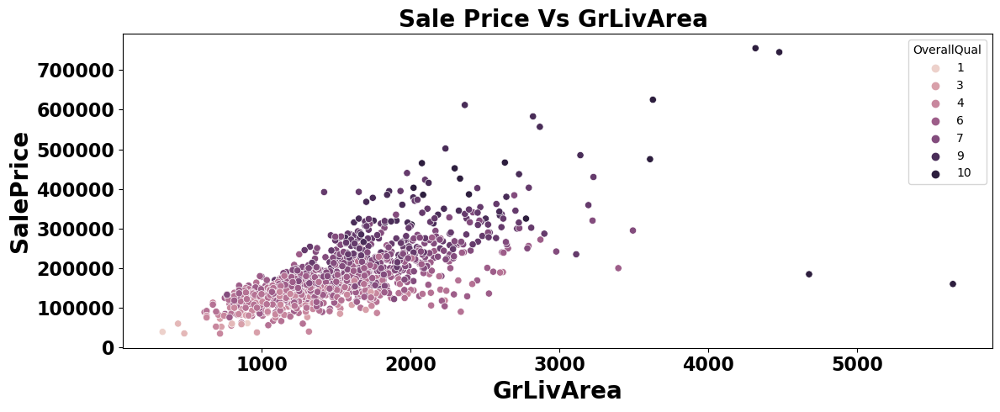

In [80]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('husl')
plt.figure(figsize=(12,5))
sns.scatterplot(y=df['SalePrice'], x=df['GrLivArea'], hue =df['OverallQual'])
plt.title("Sale Price Vs GrLivArea ",fontsize=20,fontweight ='bold')
plt.xlabel('GrLivArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **Total floor area increases the sale price also get increases corresponding the overall quality of House**

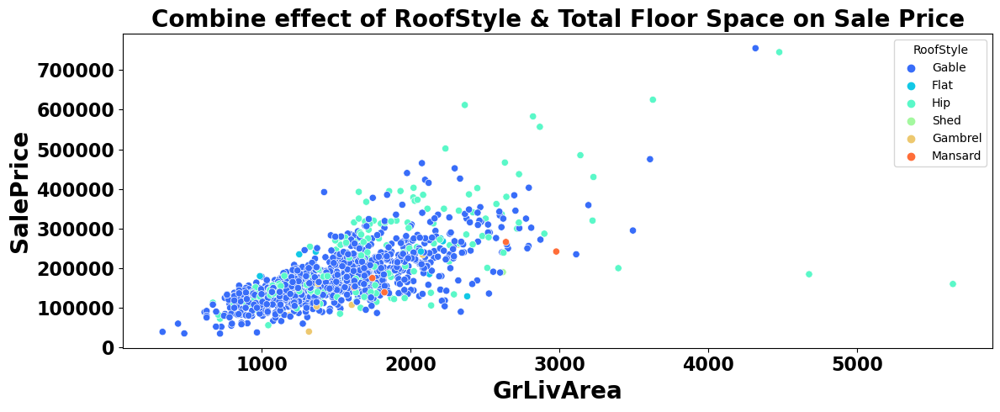

In [81]:
plt.rcParams['figure.autolayout']= True
sns.set_palette('rainbow')
plt.figure(figsize=(12,5))
sns.scatterplot(y=df['SalePrice'], x=df['GrLivArea'], hue =df['RoofStyle'])
plt.title("Combine effect of RoofStyle & Total Floor Space on Sale Price",fontsize=20,fontweight ='bold')
plt.xlabel('GrLivArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **For High floor area construction mainly Hip style Roof is used and invariably high cost properties mostly comes up with Hip Style Roof**

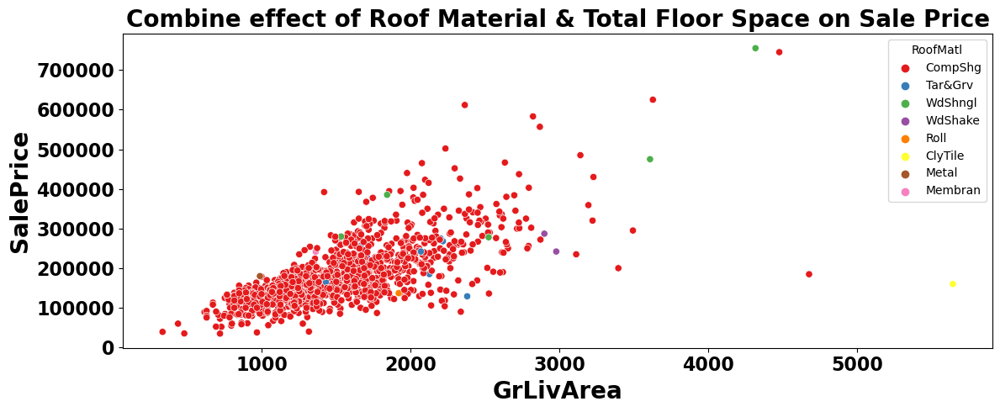

In [82]:
# Combine effect of RoofMatl & Total Floor Space on Sale Price
plt.rcParams['figure.autolayout']= True
sns.set_palette('Set1')
plt.figure(figsize=(12,5))
sns.scatterplot(y=df['SalePrice'], x=df['GrLivArea'], hue =df['RoofMatl'])
plt.title("Combine effect of Roof Material & Total Floor Space on Sale Price",fontsize=20,fontweight ='bold')
plt.xlabel('GrLivArea',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **For most of the constuction of properties, standard (Composite) Shingle roof material is used**
- **Sale prices increases with High floor area construction for all roof materials**

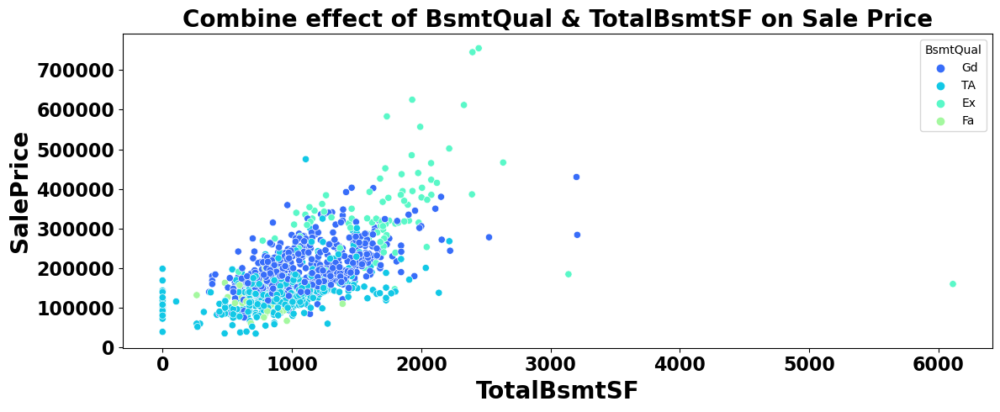

In [83]:
# Combine effect of RoofStyle & Total Floor Space on Sale Price
plt.rcParams['figure.autolayout']= True
sns.set_palette('rainbow')
plt.figure(figsize=(12,5))
sns.scatterplot(y=df['SalePrice'], x=df['TotalBsmtSF'], hue =df['BsmtQual'])
plt.title("Combine effect of BsmtQual & TotalBsmtSF on Sale Price",fontsize=20,fontweight ='bold')
plt.xlabel('TotalBsmtSF',fontsize = 20,fontweight ='bold')
plt.ylabel('SalePrice',fontsize = 20,fontweight ='bold')
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.tight_layout()
plt.show()

#### Observations:
- **As Basement Quality increase in relatio to it sale Price increases**

# Encoding of categorical features:

Using Ordinal Encoder to encode the data

In [84]:
# Encoding needed for columns with string data to change string data to numerical format
df_encode=df[df_cat_str].copy()
df_encode.head(5)

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,Gable,CompShg,Plywood,Plywood,None,TA,TA,CBlock,Gd,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,Gd,Gd,PConc,TA,Gd,Gd,ALQ,Rec,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,MetalSd,MetalSd,None,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Plywood,Plywood,BrkFace,TA,TA,CBlock,Gd,TA,No,BLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,COD,Normal
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,CemntBd,CmentBd,Stone,Gd,TA,CBlock,Gd,TA,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Attchd,Fin,TA,TA,Y,WD,Normal


In [85]:
# Using Ordinal Encoder on categorical variable
from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()
for i in df_encode.columns:
    df[i] = enc.fit_transform(df_encode[i].values.reshape(-1,1))
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,3.0,70.0,4928,1.0,0.0,3.0,0.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1976,1976,1.0,1.0,8.0,9.0,2.0,0.0,3.0,4.0,1.0,2.0,3.0,3.0,0.0,120,5.0,0,958,1078,1.0,4.0,1.0,4.0,958,0,0,958,0,0,2,0,2,1,3.0,5,6.0,1,1.0,1977.0,1.0,2,440,4.0,4.0,2.0,0,205,0,0,0,0,0,2,2007,8.0,4.0,128000
1,20,3.0,95.0,15865,1.0,0.0,3.0,0.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,1970,1970,0.0,5.0,12.0,13.0,2.0,0.0,2.0,2.0,2.0,3.0,1.0,1.0,0.0,351,4.0,823,1043,2217,1.0,0.0,1.0,4.0,2217,0,0,2217,1,0,2,0,4,1,2.0,8,6.0,1,1.0,1970.0,2.0,2,621,4.0,4.0,2.0,81,207,0,0,224,0,0,10,2007,8.0,4.0,268000
2,60,3.0,92.0,9920,1.0,0.0,3.0,0.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1996,1997,1.0,1.0,7.0,7.0,2.0,0.0,2.0,4.0,2.0,2.0,3.0,0.0,2.0,862,5.0,0,255,1117,1.0,0.0,1.0,4.0,1127,886,0,2013,1,0,2,1,3,1,3.0,8,6.0,1,1.0,1997.0,2.0,2,455,4.0,4.0,2.0,180,130,0,0,0,0,0,6,2007,8.0,4.0,269790
3,20,3.0,105.0,11751,1.0,0.0,3.0,0.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,6,1977,1977,3.0,1.0,8.0,9.0,1.0,480.0,3.0,4.0,1.0,2.0,3.0,3.0,1.0,705,5.0,0,1139,1844,1.0,0.0,1.0,4.0,1844,0,0,1844,0,0,2,0,3,1,3.0,7,6.0,1,1.0,1977.0,1.0,2,546,4.0,4.0,2.0,0,122,0,0,0,0,0,1,2010,0.0,4.0,190000
4,20,3.0,70.0,16635,1.0,0.0,3.0,0.0,2.0,0.0,14.0,2.0,2.0,0.0,2.0,6,7,1977,2000,1.0,1.0,4.0,4.0,3.0,126.0,2.0,4.0,1.0,2.0,3.0,3.0,0.0,1246,5.0,0,356,1602,1.0,2.0,1.0,4.0,1602,0,0,1602,0,1,2,0,3,1,2.0,8,6.0,1,1.0,1977.0,0.0,2,529,4.0,4.0,2.0,240,0,0,0,0,0,0,6,2009,8.0,4.0,215000


In [86]:
# Dropping column "Utilities" as there is no variation in the data and it has only one unique value hence it will not have any impact on target variable
df.drop(['Utilities'],axis=1,inplace=True)

# Checking coefficients of correlation (r)

In [87]:
# As the dataset is having many columns, dividing it into four dataframes to understand correlation using heatmap.

In [88]:
df.shape

(1168, 74)

In [89]:
x1=df.iloc[:,0:18]
y=df["SalePrice"].copy()
df_1=pd.concat([x1,y],axis=1)
df_1.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,SalePrice
0,120,3.0,70.0,4928,1.0,0.0,3.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1976,1976,128000
1,20,3.0,95.0,15865,1.0,0.0,3.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,1970,1970,268000
2,60,3.0,92.0,9920,1.0,0.0,3.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1996,1997,269790
3,20,3.0,105.0,11751,1.0,0.0,3.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,6,1977,1977,190000
4,20,3.0,70.0,16635,1.0,0.0,3.0,2.0,0.0,14.0,2.0,2.0,0.0,2.0,6,7,1977,2000,215000


In [90]:
x2=df.iloc[:,18:36]
df_2=pd.concat([x2,y],axis=1)
df_2.head()

,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,SalePrice
0,1.0,1.0,8.0,9.0,2.0,0.0,3.0,4.0,1.0,2.0,3.0,3.0,0.0,120,5.0,0,958,1078,128000
1,0.0,5.0,12.0,13.0,2.0,0.0,2.0,2.0,2.0,3.0,1.0,1.0,0.0,351,4.0,823,1043,2217,268000
2,1.0,1.0,7.0,7.0,2.0,0.0,2.0,4.0,2.0,2.0,3.0,0.0,2.0,862,5.0,0,255,1117,269790
3,3.0,1.0,8.0,9.0,1.0,480.0,3.0,4.0,1.0,2.0,3.0,3.0,1.0,705,5.0,0,1139,1844,190000
4,1.0,1.0,4.0,4.0,3.0,126.0,2.0,4.0,1.0,2.0,3.0,3.0,0.0,1246,5.0,0,356,1602,215000


In [91]:
x3=df.iloc[:,36:54]
df_3=pd.concat([x3,y],axis=1)
df_3.head()

,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,SalePrice
0,1.0,4.0,1.0,4.0,958,0,0,958,0,0,2,0,2,1,3.0,5,6.0,1,128000
1,1.0,0.0,1.0,4.0,2217,0,0,2217,1,0,2,0,4,1,2.0,8,6.0,1,268000
2,1.0,0.0,1.0,4.0,1127,886,0,2013,1,0,2,1,3,1,3.0,8,6.0,1,269790
3,1.0,0.0,1.0,4.0,1844,0,0,1844,0,0,2,0,3,1,3.0,7,6.0,1,190000
4,1.0,2.0,1.0,4.0,1602,0,0,1602,0,1,2,0,3,1,2.0,8,6.0,1,215000


In [92]:
x4=df.iloc[:,54:73]
df_4=pd.concat([x4,y],axis=1)
df_4.head()

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.0,1977.0,1.0,2,440,4.0,4.0,2.0,0,205,0,0,0,0,0,2,2007,8.0,4.0,128000
1,1.0,1970.0,2.0,2,621,4.0,4.0,2.0,81,207,0,0,224,0,0,10,2007,8.0,4.0,268000
2,1.0,1997.0,2.0,2,455,4.0,4.0,2.0,180,130,0,0,0,0,0,6,2007,8.0,4.0,269790
3,1.0,1977.0,1.0,2,546,4.0,4.0,2.0,0,122,0,0,0,0,0,1,2010,0.0,4.0,190000
4,1.0,1977.0,0.0,2,529,4.0,4.0,2.0,240,0,0,0,0,0,0,6,2009,8.0,4.0,215000


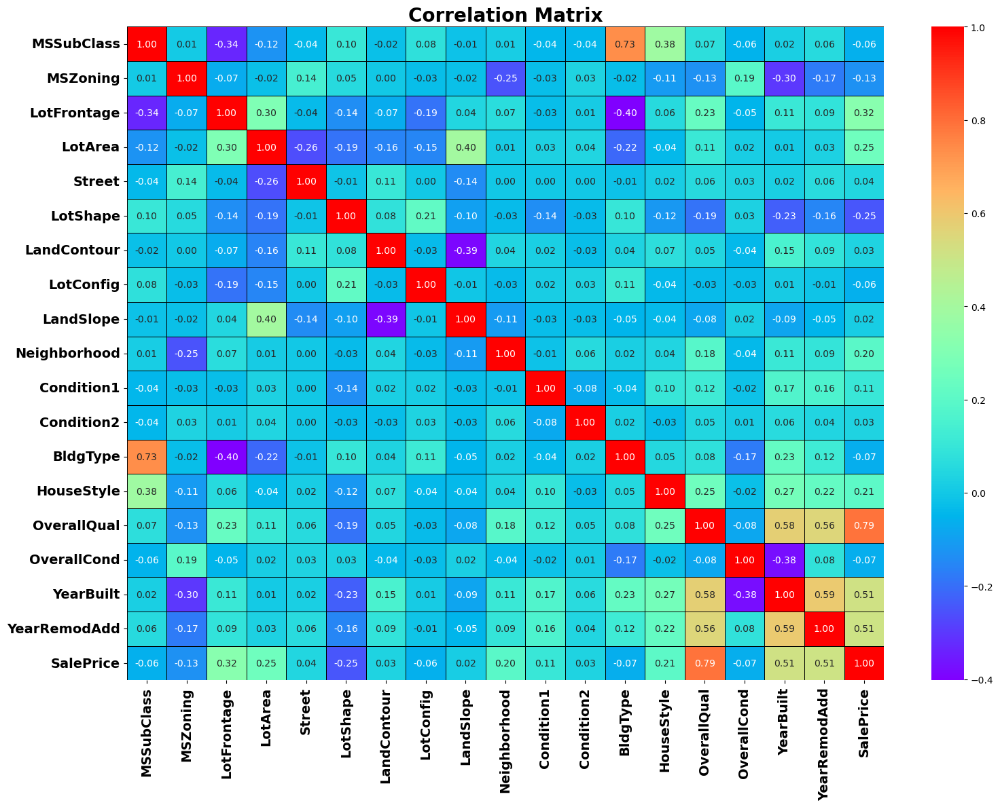

In [93]:
# Checking correlaiton coefficients to know the strength of relationship between variables
corr_r_1=df_1.corr()
plt.figure(figsize=(16,12))
sns.heatmap(corr_r_1,annot=True,linewidths=0.5,linecolor='black',fmt=".2f",cmap="rainbow")
plt.title("Correlation Matrix",fontsize=20,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.tight_layout()
plt.savefig("correlation_matrix_1.jpg")
plt.show()

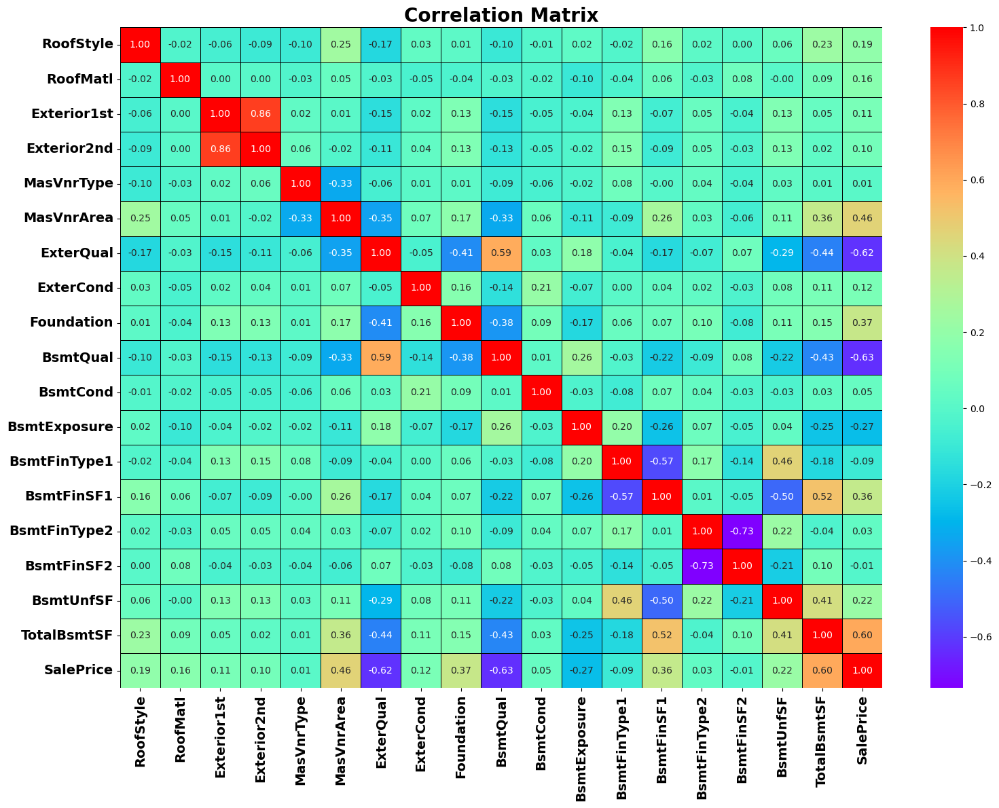

In [94]:
# Checking correlaiton coefficients to know the strength of relationship between variables
corr_r_2=df_2.corr()
plt.figure(figsize=(16,12))
sns.heatmap(corr_r_2,annot=True,linewidths=0.5,linecolor='black',fmt=".2f",cmap="rainbow")
plt.title("Correlation Matrix",fontsize=20,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.tight_layout()
plt.savefig("correlation_matrix_2.jpg")
plt.show()

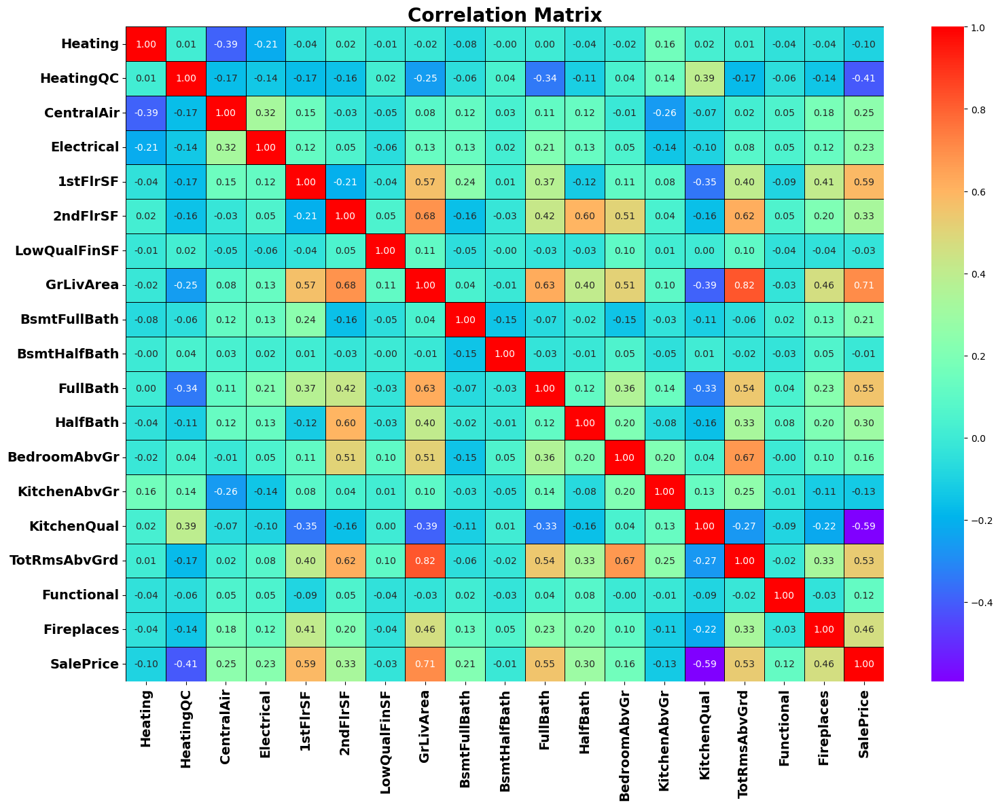

In [95]:
# Checking correlaiton coefficients to know the strength of relationship between variables
corr_r_3=df_3.corr()
plt.figure(figsize=(16,12))
sns.heatmap(corr_r_3,annot=True,linewidths=0.5,linecolor='black',fmt=".2f",cmap="rainbow")
plt.title("Correlation Matrix",fontsize=20,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.tight_layout()
plt.savefig("correlation_matrix_3.jpg")
plt.show()

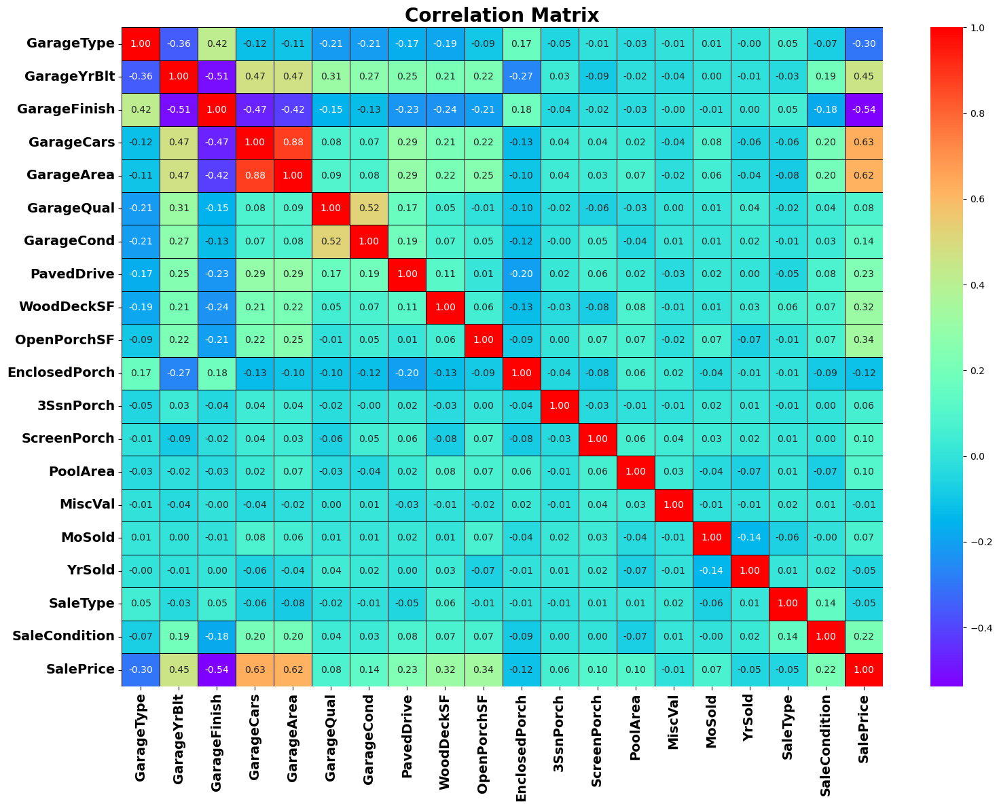

In [96]:
# Checking correlaiton coefficients to know the strength of relationship between variables
corr_r_4=df_4.corr()
plt.figure(figsize=(16,12))
sns.heatmap(corr_r_4,annot=True,linewidths=0.5,linecolor='black',fmt=".2f",cmap="rainbow")
plt.title("Correlation Matrix",fontsize=20,fontweight ='bold')
plt.xticks(fontsize=14,fontweight ='bold')
plt.yticks(fontsize=14,fontweight ='bold')
plt.tight_layout()
plt.savefig("correlation_matrix_4.jpg")
plt.show()

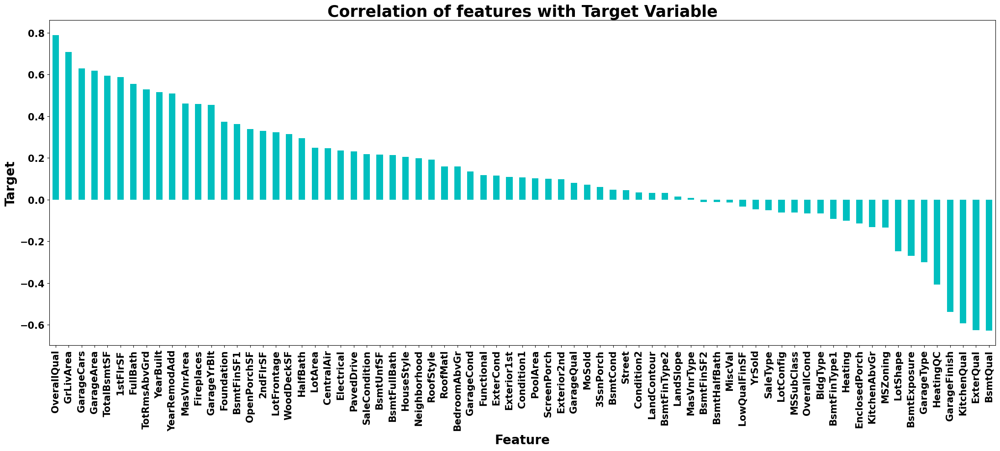

In [97]:
# Plotting the relationship of target variable with other variables in descending order
plt.figure(figsize=(22,10))
df.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=20,fontweight='bold')
plt.ylabel('Target',fontsize=20,fontweight='bold')
plt.title('Correlation of features with Target Variable',fontsize=25,fontweight='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.tight_layout()
plt.show()

In [98]:
df.corr()["SalePrice"].sort_values(ascending=False) 

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.707300
GarageCars       0.628329
GarageArea       0.619000
TotalBsmtSF      0.595042
1stFlrSF         0.587642
FullBath         0.554988
TotRmsAbvGrd     0.528363
YearBuilt        0.514408
YearRemodAdd     0.507831
MasVnrArea       0.460535
Fireplaces       0.459611
GarageYrBlt      0.453840
Foundation       0.374169
BsmtFinSF1       0.362874
OpenPorchSF      0.339500
2ndFlrSF         0.330386
LotFrontage      0.323851
WoodDeckSF       0.315444
HalfBath         0.295592
LotArea          0.249499
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
SaleCondition    0.217687
BsmtUnfSF        0.215724
BsmtFullBath     0.212924
HouseStyle       0.205502
Neighborhood     0.198942
RoofStyle        0.192654
RoofMatl         0.159865
BedroomAbvGr     0.158281
GarageCond       0.135071
Functional       0.118673
ExterCond        0.115167
Exterior1st      0.108451
Condition1       0.105820
PoolArea    

#### Observations:
- **There are multiple features with weak and very weak corrleations**
- **Max +ve correlation: 'OverallQual' 
- **Max -ve correlation: 'BsmtQual'
- **Typically we consider the coefficient of correlation between -0.3 to 0.3 as weak correlation**
- **Considering -0.15 to 0.15 range as very weak correlation with target variable and will remove features with the coefficient of correlation in this range**
- **I will check feature scores from SelectKBest algorithm with F-regression test and will check if any features have lower score to take futher decisions.**

In [99]:
# Identifying very weak correlations
very_weak_corr=df.corr()[(df.corr()["SalePrice"]< 0.15) & (df.corr()["SalePrice"]> -0.15)].index
very_weak_corr.shape

(33,)

In [100]:
weak_col=pd.DataFrame({"Very Weak Columns":very_weak_corr})
display(weak_col)

,Very Weak Columns
0,MSSubClass
1,MSZoning
2,Street
3,LandContour
4,LotConfig
5,LandSlope
6,Condition1
7,Condition2
8,BldgType
9,OverallCond


# Checking top features using SelectKBest algorithm

In [101]:
import pandas as pd
import numpy as np

# pearson's correlation feature selection for numeric input and numeric output
from sklearn.datasets import make_regression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression


x=df.drop("SalePrice",axis=1)  #independent columns
y=df["SalePrice"]  # Output variable

#apply SelectKBest class to extract top best features
bestfeatures = SelectKBest(score_func=f_regression, k='all')  # Using f_regression test to check the relationship of features with Y categorical data
fit = bestfeatures.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
SelectKBest_scores=featureScores.nlargest(74,'Score')  #Top 70 features
SelectKBest_scores.reset_index(drop=True)  # displyaing top 74 features and scores

,Specs,Score
0,OverallQual,1925.310146
1,GrLivArea,1167.278131
2,GarageCars,760.625799
3,BsmtQual,754.737009
4,ExterQual,746.729944
5,GarageArea,724.282299
6,TotalBsmtSF,639.162482
7,KitchenQual,630.659595
8,1stFlrSF,615.032166
9,FullBath,518.998338


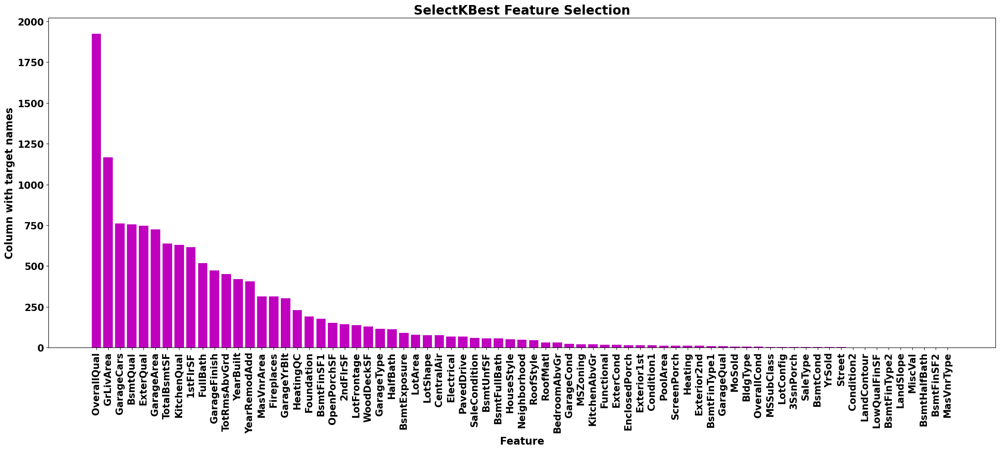

In [102]:
# Plotting the score values in descending order
df_sorted_desc= featureScores.sort_values('Score',ascending=False)
plt.figure(figsize=(22,10))
plt.bar('Specs','Score',data=df_sorted_desc,color='m')
plt.xlabel("Feature",fontsize=16,fontweight='bold')
plt.ylabel("Column with target names",fontsize=16,fontweight='bold')
plt.title("SelectKBest Feature Selection",fontsize=20,fontweight='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.tight_layout()
plt.show()

In [103]:
SelectKBest_scores.shape   # size of SelectKBest_scores matrix

(73, 2)

#### Observations:
- **Calculated the selectKBest score for all featues to know the score of all features**
- **The max selectKBest score is 1925, min score is 0.06**
- **Considered the threshold of score: 50 to drop the columns in this case as it is 10% score of top 10th feature**
- **Again, checking the score values of all identified columns with threshold of 50 with very weak correlations in the previous step and dropping the columns with very weak correlations and with score less than 50**

In [104]:
# Identifying columns to be dropped by checking the selectKBest scores of very weak correlations
# In this case, considered threshold of 50 for Score as it is 10% score of top 10th feature.
drop_col=[]
for i in range(len(very_weak_corr)):
    if (SelectKBest_scores["Score"][SelectKBest_scores["Specs"]==very_weak_corr[i]].item())<50:
        drop_col.append(very_weak_corr[i])
print(len(drop_col))
df_drop_col=pd.DataFrame({"Drop_Columns":drop_col})
display(df_drop_col)  # displaying the dropped columns

33


,Drop_Columns
0,MSSubClass
1,MSZoning
2,Street
3,LandContour
4,LotConfig
5,LandSlope
6,Condition1
7,Condition2
8,BldgType
9,OverallCond


In [105]:
(weak_col["Very Weak Columns"].isin(df_drop_col["Drop_Columns"])).sum().any()

True

In [106]:
#Dropping the identified Columns
for i in range(len(df_drop_col)):
    df.drop([df_drop_col["Drop_Columns"][i]],axis=1,inplace=True)
print(df.shape)
df.head(5)

(1168, 41)


,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleCondition,SalePrice
0,70.0,4928,0.0,13.0,2.0,6,1976,1976,1.0,1.0,0.0,3.0,1.0,2.0,3.0,120,958,1078,4.0,1.0,4.0,958,0,958,0,2,0,2,3.0,5,1,1.0,1977.0,1.0,2,440,2.0,0,205,4.0,128000
1,95.0,15865,0.0,12.0,2.0,8,1970,1970,0.0,5.0,0.0,2.0,2.0,3.0,1.0,351,1043,2217,0.0,1.0,4.0,2217,0,2217,1,2,0,4,2.0,8,1,1.0,1970.0,2.0,2,621,2.0,81,207,4.0,268000
2,92.0,9920,0.0,15.0,5.0,7,1996,1997,1.0,1.0,0.0,2.0,2.0,2.0,0.0,862,255,1117,0.0,1.0,4.0,1127,886,2013,1,2,1,3,3.0,8,1,1.0,1997.0,2.0,2,455,2.0,180,130,4.0,269790
3,105.0,11751,0.0,14.0,2.0,6,1977,1977,3.0,1.0,480.0,3.0,1.0,2.0,3.0,705,1139,1844,0.0,1.0,4.0,1844,0,1844,0,2,0,3,3.0,7,1,1.0,1977.0,1.0,2,546,2.0,0,122,4.0,190000
4,70.0,16635,0.0,14.0,2.0,6,1977,2000,1.0,1.0,126.0,2.0,1.0,2.0,3.0,1246,356,1602,2.0,1.0,4.0,1602,0,1602,0,2,0,3,2.0,8,1,1.0,1977.0,0.0,2,529,2.0,240,0,4.0,215000


# Checking Multicollinearity between features using variance_inflation_factor (VIF)

In [107]:
# We calculate VIF only for numerical data as the variance is applicable only for numerical data

In [108]:
# Identifying the columns with numerical data after dropping the columns identified in previous steps

In [109]:
df_numerical.shape  # original dataframe numerical variables size

(1168, 18)

In [110]:
# Looping to get the list of numerical variables left in the dataset after dropping columns based on previous steps
df_num_filter=[]
for i in df_numerical.columns:
    for j in df.columns:
        if i==j:
            df_num_filter.append(i)
print(len(df_num_filter))
display(df_num_filter)

11


['LotFrontage',
 'MasVnrArea',
 'GarageYrBlt',
 'BsmtFinSF1',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF']

In [111]:
df_vif=df[df_num_filter]
df_vif.head(5)

,LotFrontage,MasVnrArea,GarageYrBlt,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GarageArea,WoodDeckSF,OpenPorchSF
0,70.0,0.0,1977.0,120,958,1078,958,0,440,0,205
1,95.0,0.0,1970.0,351,1043,2217,2217,0,621,81,207
2,92.0,0.0,1997.0,862,255,1117,1127,886,455,180,130
3,105.0,480.0,1977.0,705,1139,1844,1844,0,546,0,122
4,70.0,126.0,1977.0,1246,356,1602,1602,0,529,240,0


In [112]:
# Checking multicollinearity using VIF
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_vif[list(df_vif.columns)]
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
5,69.488689,TotalBsmtSF
6,32.846841,1stFlrSF
4,20.708242,BsmtUnfSF
2,17.309176,GarageYrBlt
3,17.282346,BsmtFinSF1
0,13.810657,LotFrontage
8,9.208567,GarageArea
7,2.210549,2ndFlrSF
10,1.781732,OpenPorchSF
9,1.768641,WoodDeckSF


#### Observations: 
- **Typically we remove columns with VIF values > 10 which indicates strong multicollinearity of the features***
- **As there are multiple features with VIF values > 10, dropping one column "TotalBsmtSF" initially and then will recalculate VIF**

In [113]:
df_vif.drop(["TotalBsmtSF"],axis=1,inplace=True)

In [114]:
# Checking multicollinearity using VIF
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_vif[list(df_vif.columns)]
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
5,27.660847,1stFlrSF
2,17.302665,GarageYrBlt
0,13.810653,LotFrontage
7,9.170196,GarageArea
4,6.989905,BsmtUnfSF
3,5.981671,BsmtFinSF1
6,2.189545,2ndFlrSF
9,1.774845,OpenPorchSF
8,1.749904,WoodDeckSF
1,1.705495,MasVnrArea


#### Observations: 
- **As there are multiple features again with VIF values > 10, dropping one column "1stFlrSF" and then will recalculate VIF**

In [115]:
df_vif.drop(["1stFlrSF"],axis=1,inplace=True)

In [116]:
# Checking multicollinearity using VIF
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_vif[list(df_vif.columns)]
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
2,14.635708,GarageYrBlt
0,13.016769,LotFrontage
6,8.917637,GarageArea
4,4.859637,BsmtUnfSF
3,4.172478,BsmtFinSF1
5,2.018195,2ndFlrSF
8,1.763838,OpenPorchSF
7,1.716919,WoodDeckSF
1,1.693117,MasVnrArea


#### Observations: 
- **As there are multiple features again with VIF values > 10, dropping one column "GarageYrBlt" and then will recalculate VIF**

In [117]:
df_vif.drop(["GarageYrBlt"],axis=1,inplace=True)

In [118]:
# Checking multicollinearity using VIF
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_vif[list(df_vif.columns)]
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
5,8.390795,GarageArea
0,8.324859,LotFrontage
3,4.424525,BsmtUnfSF
2,3.976879,BsmtFinSF1
4,1.944600,2ndFlrSF
7,1.749845,OpenPorchSF
6,1.712659,WoodDeckSF
1,1.621816,MasVnrArea


#### Observations: 
-  **As there are no features with VIF values > 10 i.e. there is no multicollinearity between features hence not dropping any more columns**
- **I will use this data for further processing of model building**

In [119]:
df.drop(["TotalBsmtSF","1stFlrSF","GarageYrBlt"],axis=1,inplace=True)
df.shape

(1168, 38)

# Checking Outliers

In [120]:
# We check outliers on numerical data
df_outliers=df_vif.copy()
df_outliers.head(5)

,LotFrontage,MasVnrArea,BsmtFinSF1,BsmtUnfSF,2ndFlrSF,GarageArea,WoodDeckSF,OpenPorchSF
0,70.0,0.0,120,958,0,440,0,205
1,95.0,0.0,351,1043,0,621,81,207
2,92.0,0.0,862,255,886,455,180,130
3,105.0,480.0,705,1139,0,546,0,122
4,70.0,126.0,1246,356,0,529,240,0


In [121]:
df_outliers.shape

(1168, 8)

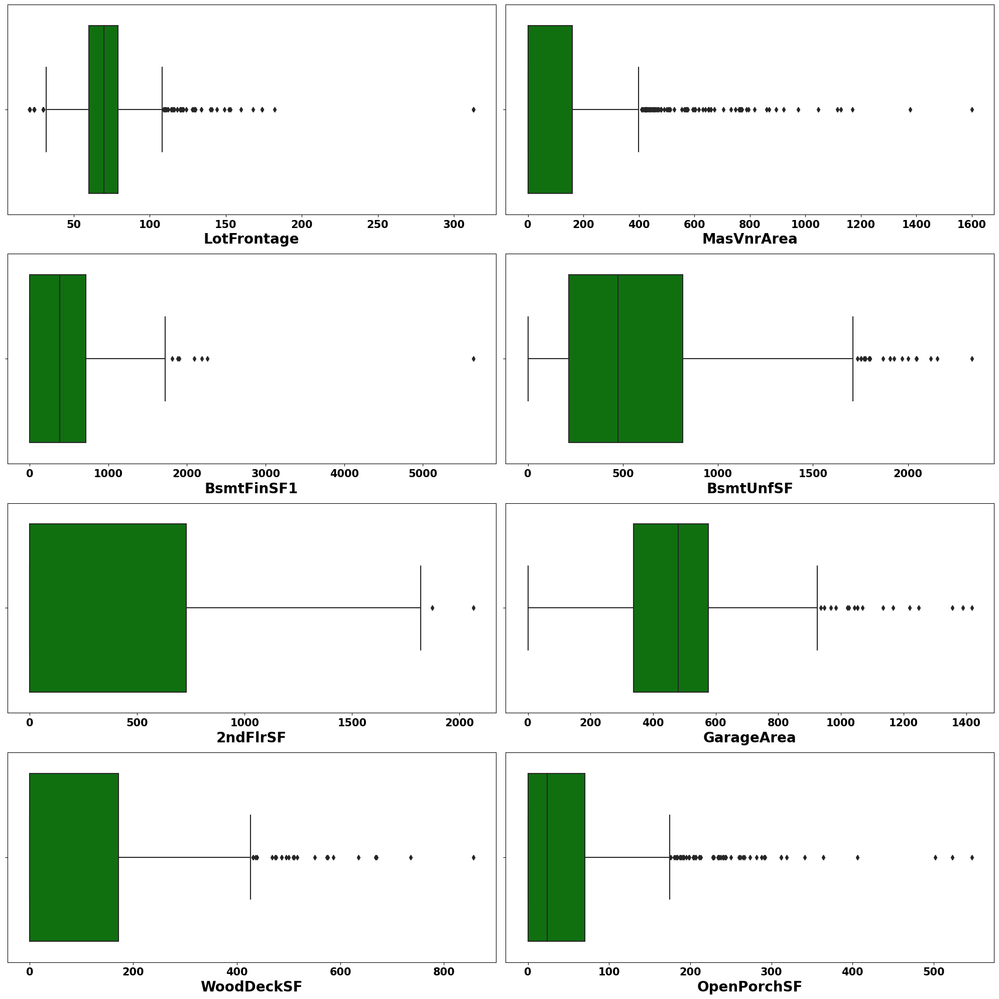

In [122]:
# Checking outliers visually
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_outliers.columns:
    if plotnumber<=8:
        ax=plt.subplot(4,2,plotnumber)
        sns.boxplot(df[column],color='g')
        plt.xlabel(column,fontsize=20,fontweight='bold')
        plt.xticks(fontsize=15,fontweight ='bold',rotation=0)
        plt.tight_layout()
    plotnumber+=1
plt.show()

#### Observations:
- **Outliers are present in all the columns**

# Removing Outliers using z-score method

In [123]:
df_outliers.shape

(1168, 8)

In [124]:
df.shape

(1168, 38)

In [125]:
# Calculating z score & identifying the rows and columns where absolute z score > 3

from scipy.stats import zscore
z=np.abs(zscore(df_outliers))
threshold=3
np.where(z>3)

(array([  23,   40,   51,  103,  119,  140,  141,  141,  141,  142,  142,
         151,  152,  191,  192,  195,  232,  232,  241,  241,  245,  303,
         305,  309,  310,  325,  338,  352,  355,  361,  361,  361,  381,
         394,  434,  449,  490,  500,  504,  523,  525,  561,  561,  574,
         581,  592,  592,  592,  592,  592,  600,  608,  626,  626,  639,
         681,  683,  691,  691,  695,  697,  697,  707,  711,  713,  720,
         736,  746,  757,  757,  758,  762,  762,  772,  772,  800,  839,
         839,  858,  861,  863,  864,  870,  897,  897,  914,  914,  914,
         956,  980, 1017, 1017, 1046, 1047, 1053, 1073, 1094, 1120, 1121,
        1123, 1134, 1150], dtype=int64),
 array([7, 0, 7, 7, 6, 1, 0, 2, 4, 1, 6, 7, 6, 0, 4, 0, 1, 3, 1, 2, 6, 0,
        3, 6, 6, 6, 1, 1, 1, 1, 2, 7, 6, 7, 1, 7, 6, 6, 1, 1, 1, 5, 7, 3,
        7, 0, 1, 2, 5, 7, 6, 1, 0, 7, 7, 1, 7, 1, 4, 6, 1, 2, 6, 7, 7, 1,
        1, 7, 1, 3, 0, 1, 3, 3, 5, 0, 1, 4, 1, 1, 3, 0, 1, 1, 5, 1, 2, 

In [126]:
# Removing the rows in the dataframe where the outliers are present in x features with numerical data
df_1=df[(z<3).all(axis=1)]
df_outliers_del=df_outliers[(z<3).all(axis=1)]

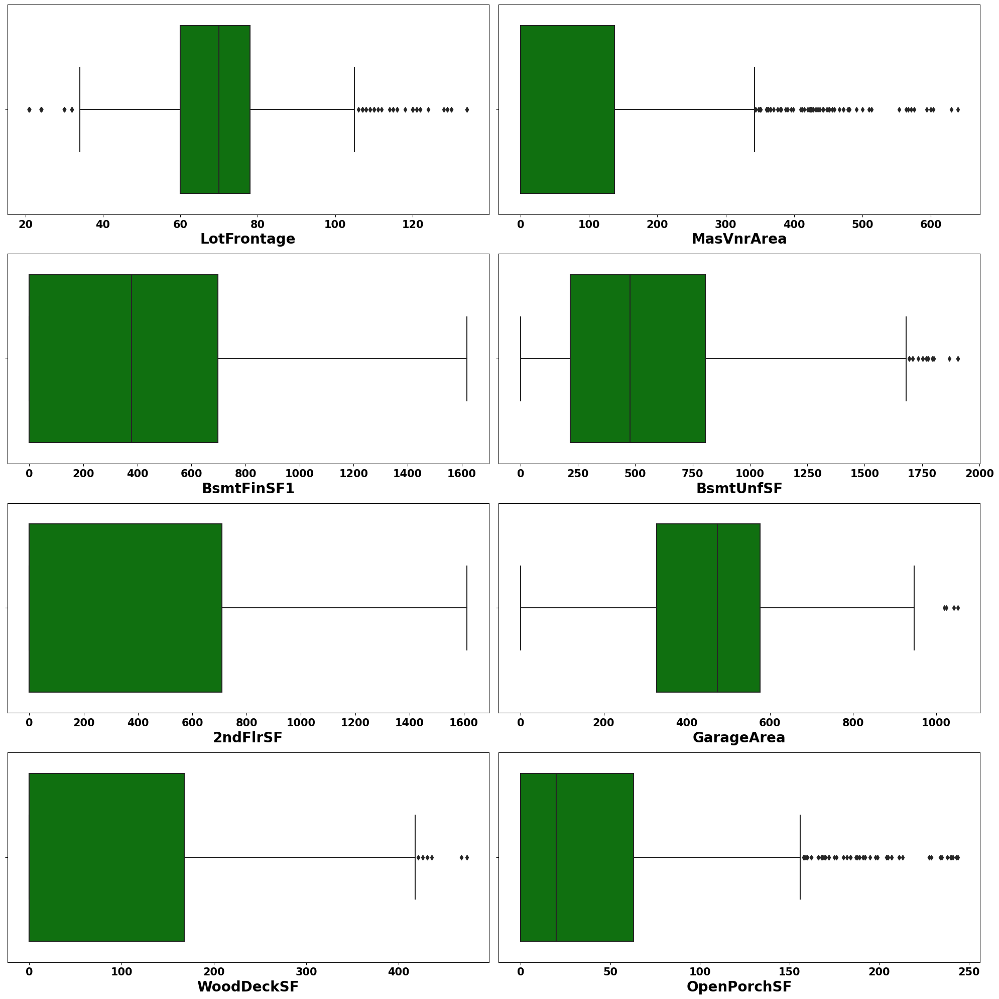

In [127]:
# Checking outliers visually
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_outliers.columns:
    if plotnumber<=8:
        ax=plt.subplot(4,2,plotnumber)
        sns.boxplot(df_1[column],color='g')
        plt.xlabel(column,fontsize=20,fontweight='bold')
        plt.xticks(fontsize=15,fontweight ='bold',rotation=0)
        plt.tight_layout()
    plotnumber+=1
plt.show()

#### Observations
- **Outliers are removed from the features**

In [128]:
df_1.shape

(1089, 38)

In [129]:
df.shape

(1168, 38)

In [130]:
# Data loss calculation with z-score method
loss_percent_zscore=round((df.shape[0]-df_1.shape[0])/df.shape[0]*100,1)
loss_percent_zscore

6.8

#### Observations:
- **Data loss with z-score method is 6.8%. Now I will check the dataloss using IQR method as well and will take a call accordingly**

# Removing Outliers using IQR method

In [131]:
# Calculate interquartile range (IQR) for x continuous data
Q1=df_outliers.quantile(0.25)
Q3=df_outliers.quantile(0.75)
IQR=Q3-Q1

# Dataframe with continuous X data after removing outliers
df_outliers_upd = df_outliers[((df_outliers>=(Q1-1.5*IQR)) & (df_outliers<=(Q3+1.5*IQR))).all(axis=1)]

# Removing the rows in both x and y where the outliers are present in x features with continuous data
df_2 = df[((df_outliers>=(Q1-1.5*IQR)) & (df_outliers<=(Q3+1.5*IQR))).all(axis=1)]

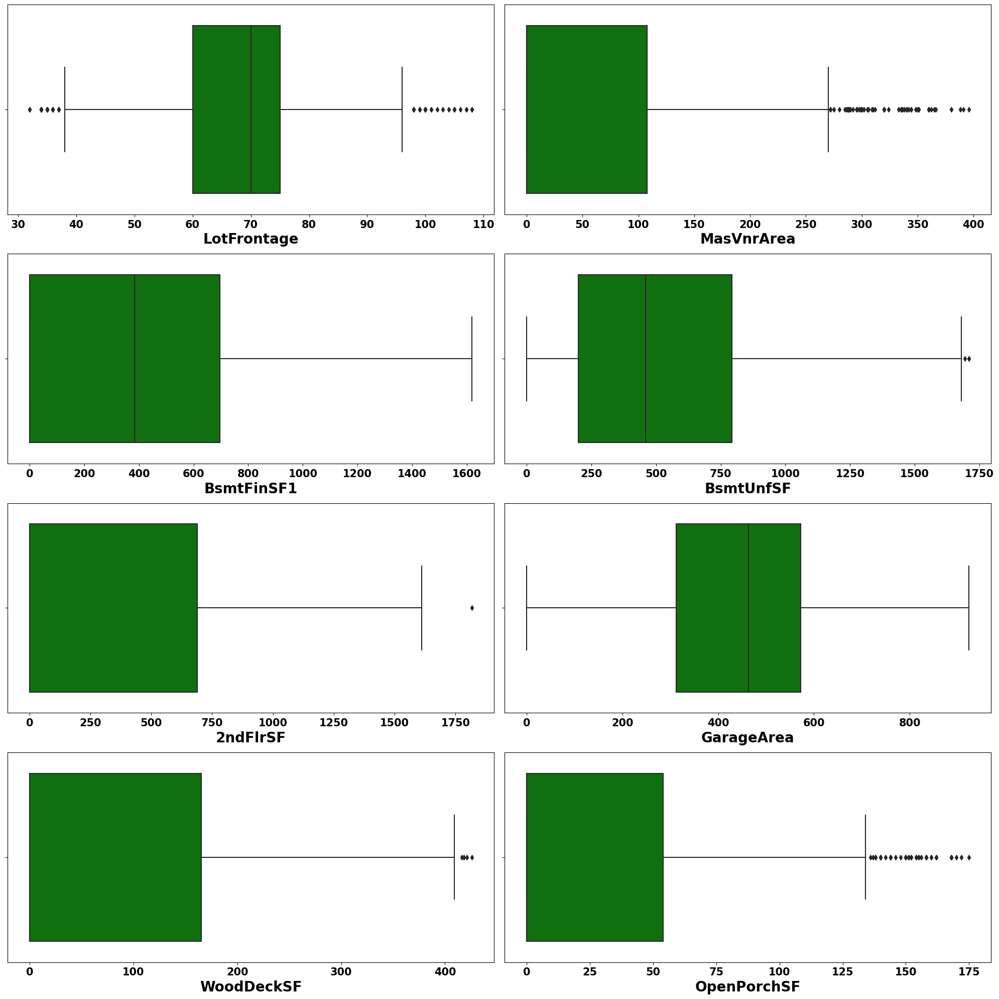

In [132]:
# Checking outliers visually after removing outliers using IQR method
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_outliers.columns:
    if plotnumber<=8:
        ax=plt.subplot(4,2,plotnumber)
        sns.boxplot(df_2[column],color='g')
        plt.xlabel(column,fontsize=20,fontweight='bold')
        plt.xticks(fontsize=15,fontweight ='bold',rotation=0)
        plt.tight_layout()
    plotnumber+=1
plt.show()

#### Observations
- **Outliers are removed from all features**

In [133]:
df_2.shape

(943, 38)

In [134]:
# Data Loss Calculation with IQR
loss_percent_IQR=round((df.shape[0]-df_2.shape[0])/df.shape[0]*100,1)
display(loss_percent_IQR)

19.3

#### Observations: 
- **Data loss with IQR is 19.3% which is higher than data loss with z-score (6.8%). Data loss with z-score method is < 10% which is acceptable hence considering x & y data after removing outliers using zscore method for model building**

In [135]:
x=df_1.drop(['SalePrice'],axis=1)
y=df_1.iloc[:,-1]
df=df_1

In [136]:
df=df_1.copy()

# Skewness Check

In [137]:
df_outliers.shape

(1168, 8)

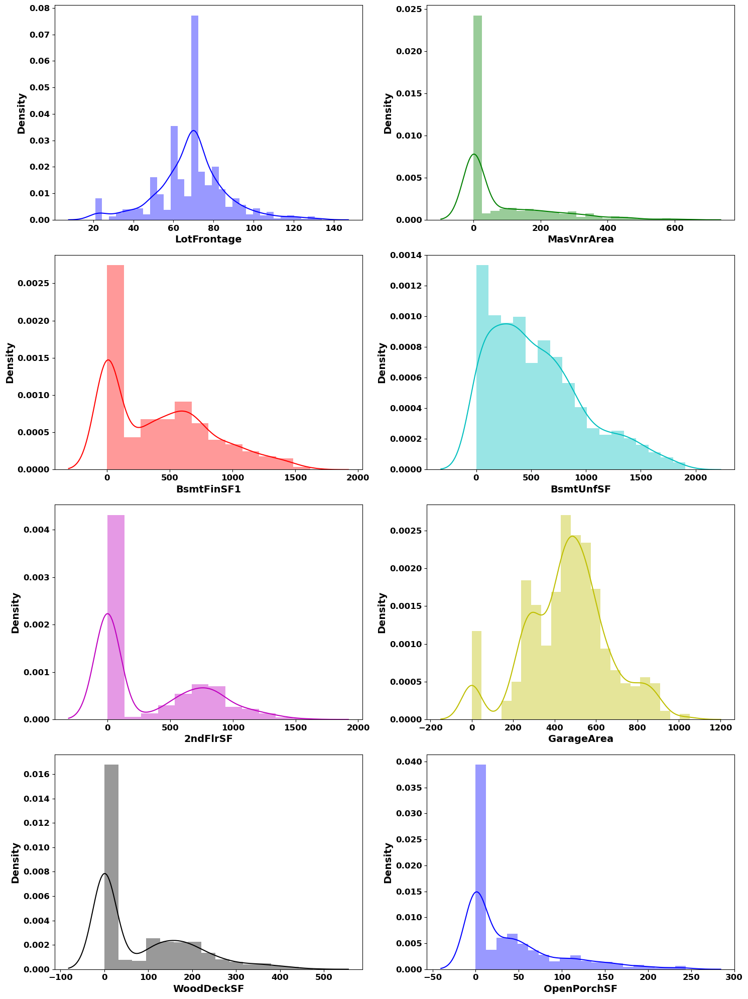

In [138]:
# Skewness of features with numerical data. We don't check skewness on categorical data and in target variable.
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,20),facecolor='white')
sns.set_palette('plasma')
plotnum=1
for col in df_outliers_del.columns:
    if plotnum<=8:
        plt.subplot(4,2,plotnum)
        sns.distplot(df[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

#### Observatins:
- **All the features are having skewed data hence I need to remove or reduce the skewness of all these features to get better model performance**

In [139]:
df_outliers_del.skew().sort_values(ascending=False) 

MasVnrArea     1.684575
OpenPorchSF    1.478243
WoodDeckSF     1.034500
BsmtUnfSF      0.798798
2ndFlrSF       0.776369
BsmtFinSF1     0.642035
LotFrontage    0.134013
GarageArea    -0.114881
dtype: float64

#### Observations: 
- **Typically "-0.5 to 0.5" range is fairly symmetrical. In this case, there are multiple variables beyond this range**
- **I will apply various methods to remove skewness and will consider the one with lowest skewness**

# Transforming data to remove skewness

In [140]:
# Method 1: Using PowerTransformer
#checking skewness on X features with continuous data 
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer()
x_pwr=pt.fit_transform(df_outliers_del)
x_tra=pd.DataFrame(data=x_pwr,columns=df_outliers_del.columns)
# Checking skeweness and arranging the values in descending order
x_tra.skew().sort_values(ascending=False)

MasVnrArea     0.484980
2ndFlrSF       0.323810
WoodDeckSF     0.140457
LotFrontage    0.111662
OpenPorchSF    0.040083
BsmtUnfSF     -0.315536
BsmtFinSF1    -0.416467
GarageArea    -0.438925
dtype: float64

#### Observations:
- **Skewness is reduced using powerTransformer method**
- **Skewness range: (-0.48,+0.48) which is within the range of -0.5 to 0.5 which is fairly symmetrical**

In [141]:
# Method2: Using Quantile transformer
from sklearn.preprocessing import QuantileTransformer
qt=QuantileTransformer()
x_qt=qt.fit_transform(df_outliers_del)
x_qtr=pd.DataFrame(data=x_qt,columns=df_outliers_del.columns)
x_qtr.skew().sort_values(ascending=False)

MasVnrArea     0.548167
2ndFlrSF       0.435989
WoodDeckSF     0.270304
OpenPorchSF    0.139386
LotFrontage   -0.002185
GarageArea    -0.027310
BsmtUnfSF     -0.059615
BsmtFinSF1    -0.137078
dtype: float64

#### Observations:
- **Skewness is reduced using powerTransformer method**
- **Skewness range: (-0.54,+0.54) which is higher than the range with powertransformer, hence I will consider the data from powertransformer method where the data is transformed within the acceptable range of -0.5 to +0.5**

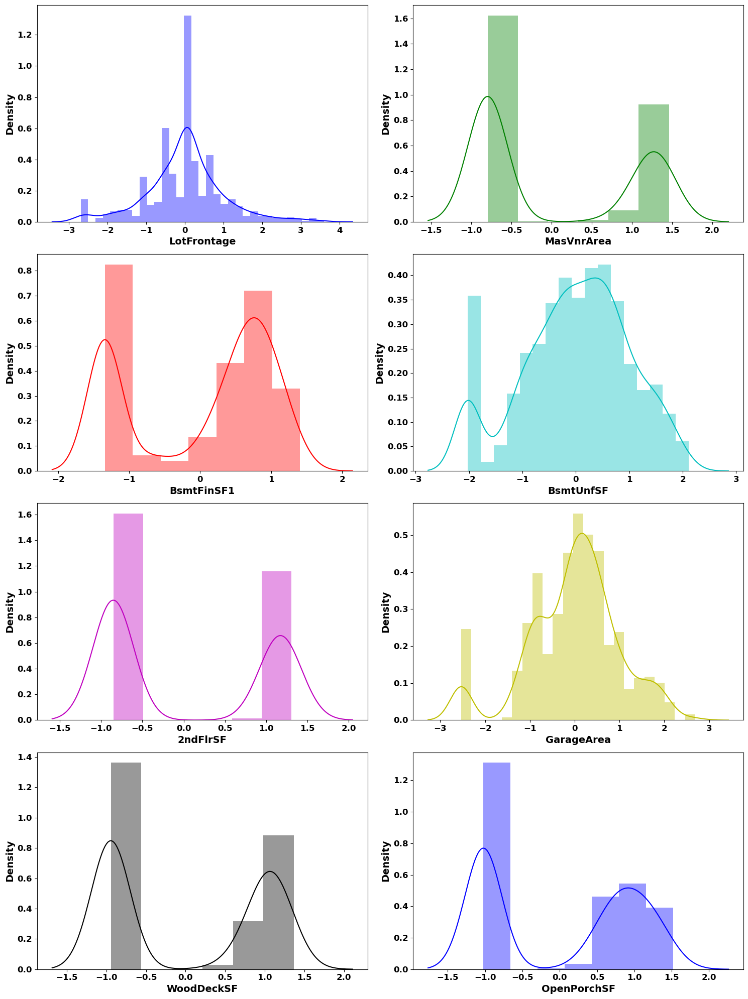

In [142]:
# Checking skewness of the data after transformation
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,20),facecolor='white')
sns.set_palette('Dark2')
plotnum=1
for col in x_tra:
    if plotnum<=8:
        plt.subplot(4,2,plotnum)
        sns.distplot(x_tra[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

#### Observations:
- **As the skewness is least using "power transformer" for most of the features, I am using transformed x data from "power transformer" for model building**   

### Grouping both transformed numerical and categorical data 

In [143]:
pd.set_option('display.max_rows',10) # This will enable us to see truncated columns

In [144]:
x.shape

(1089, 37)

In [145]:
x # entire x data including both numerical and categorical features

,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleCondition
0,70.0,4928,0.0,13.0,2.0,6,1976,1976,1.0,1.0,0.0,3.0,1.0,2.0,3.0,120,958,4.0,1.0,4.0,0,958,0,2,0,2,3.0,5,1,1.0,1.0,2,440,2.0,0,205,4.0
1,95.0,15865,0.0,12.0,2.0,8,1970,1970,0.0,5.0,0.0,2.0,2.0,3.0,1.0,351,1043,0.0,1.0,4.0,0,2217,1,2,0,4,2.0,8,1,1.0,2.0,2,621,2.0,81,207,4.0
2,92.0,9920,0.0,15.0,5.0,7,1996,1997,1.0,1.0,0.0,2.0,2.0,2.0,0.0,862,255,0.0,1.0,4.0,886,2013,1,2,1,3,3.0,8,1,1.0,2.0,2,455,2.0,180,130,4.0
3,105.0,11751,0.0,14.0,2.0,6,1977,1977,3.0,1.0,480.0,3.0,1.0,2.0,3.0,705,1139,0.0,1.0,4.0,0,1844,0,2,0,3,3.0,7,1,1.0,1.0,2,546,2.0,0,122,4.0
4,70.0,16635,0.0,14.0,2.0,6,1977,2000,1.0,1.0,126.0,2.0,1.0,2.0,3.0,1246,356,2.0,1.0,4.0,0,1602,0,2,0,3,2.0,8,1,1.0,0.0,2,529,2.0,240,0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,70.0,9819,0.0,19.0,2.0,5,1967,1967,1.0,1.0,31.0,3.0,1.0,3.0,3.0,450,432,4.0,1.0,4.0,0,900,0,1,0,3,3.0,5,0,5.0,2.0,1,280,2.0,0,0,4.0
1164,67.0,8777,3.0,7.0,2.0,4,1949,2003,1.0,1.0,0.0,3.0,1.0,3.0,3.0,0,0,0.0,1.0,4.0,0,1126,0,2,0,2,2.0,5,0,5.0,0.0,2,520,0.0,0,96,4.0
1165,24.0,2280,3.0,13.0,5.0,6,1976,1976,1.0,1.0,0.0,3.0,1.0,2.0,3.0,566,289,4.0,1.0,4.0,601,1456,0,2,1,3,3.0,7,1,1.0,2.0,2,440,2.0,87,0,4.0
1166,50.0,8500,3.0,9.0,5.0,4,1920,1950,2.0,1.0,0.0,3.0,0.0,3.0,3.0,0,649,4.0,0.0,4.0,668,1317,0,1,0,3,3.0,6,0,5.0,2.0,1,250,0.0,0,54,4.0


In [146]:
new_x=x.reset_index(drop=True)  # reset the index of x data

In [147]:
new_x # entire x data including both numerical and categorical features after resetting the index

,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleCondition
0,70.0,4928,0.0,13.0,2.0,6,1976,1976,1.0,1.0,0.0,3.0,1.0,2.0,3.0,120,958,4.0,1.0,4.0,0,958,0,2,0,2,3.0,5,1,1.0,1.0,2,440,2.0,0,205,4.0
1,95.0,15865,0.0,12.0,2.0,8,1970,1970,0.0,5.0,0.0,2.0,2.0,3.0,1.0,351,1043,0.0,1.0,4.0,0,2217,1,2,0,4,2.0,8,1,1.0,2.0,2,621,2.0,81,207,4.0
2,92.0,9920,0.0,15.0,5.0,7,1996,1997,1.0,1.0,0.0,2.0,2.0,2.0,0.0,862,255,0.0,1.0,4.0,886,2013,1,2,1,3,3.0,8,1,1.0,2.0,2,455,2.0,180,130,4.0
3,105.0,11751,0.0,14.0,2.0,6,1977,1977,3.0,1.0,480.0,3.0,1.0,2.0,3.0,705,1139,0.0,1.0,4.0,0,1844,0,2,0,3,3.0,7,1,1.0,1.0,2,546,2.0,0,122,4.0
4,70.0,16635,0.0,14.0,2.0,6,1977,2000,1.0,1.0,126.0,2.0,1.0,2.0,3.0,1246,356,2.0,1.0,4.0,0,1602,0,2,0,3,2.0,8,1,1.0,0.0,2,529,2.0,240,0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,70.0,9819,0.0,19.0,2.0,5,1967,1967,1.0,1.0,31.0,3.0,1.0,3.0,3.0,450,432,4.0,1.0,4.0,0,900,0,1,0,3,3.0,5,0,5.0,2.0,1,280,2.0,0,0,4.0
1085,67.0,8777,3.0,7.0,2.0,4,1949,2003,1.0,1.0,0.0,3.0,1.0,3.0,3.0,0,0,0.0,1.0,4.0,0,1126,0,2,0,2,2.0,5,0,5.0,0.0,2,520,0.0,0,96,4.0
1086,24.0,2280,3.0,13.0,5.0,6,1976,1976,1.0,1.0,0.0,3.0,1.0,2.0,3.0,566,289,4.0,1.0,4.0,601,1456,0,2,1,3,3.0,7,1,1.0,2.0,2,440,2.0,87,0,4.0
1087,50.0,8500,3.0,9.0,5.0,4,1920,1950,2.0,1.0,0.0,3.0,0.0,3.0,3.0,0,649,4.0,0.0,4.0,668,1317,0,1,0,3,3.0,6,0,5.0,2.0,1,250,0.0,0,54,4.0


In [148]:
x_tra  # Transformed numerical data

,LotFrontage,MasVnrArea,BsmtFinSF1,BsmtUnfSF,2ndFlrSF,GarageArea,WoodDeckSF,OpenPorchSF
0,0.054184,-0.793367,-0.101710,0.931437,-0.852791,-0.071092,-0.944030,1.445399
1,1.441888,-0.793367,0.413499,1.057652,-0.852791,0.780427,0.825894,1.449519
2,1.275706,-0.793367,0.954396,-0.498773,1.204770,0.001111,1.080320,1.250981
3,1.995239,1.426255,0.823499,1.193855,-0.852791,0.432466,-0.944030,1.223703
4,0.054184,1.212773,1.210469,-0.218060,-0.852791,0.352696,1.168244,-1.023483
...,...,...,...,...,...,...,...,...
1084,0.054184,0.887882,0.552099,-0.033690,-0.852791,-0.865973,-0.944030,-1.023483
1085,-0.112824,-0.793367,-1.344470,-2.025731,-0.852791,0.310321,-0.944030,1.120426
1086,-2.523681,-0.793367,0.687252,-0.398654,1.134433,-0.071092,0.849277,-1.023483
1087,-1.061630,-0.793367,-1.344470,0.414057,1.153984,-1.021306,-0.944030,0.870603


In [149]:
for i in x_tra.columns:
    new_x[i]=x_tra[i]

In [150]:
new_x  # Grouped x data with tranformed numerical data and categorical data

,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleCondition
0,0.054184,4928,0.0,13.0,2.0,6,1976,1976,1.0,1.0,-0.793367,3.0,1.0,2.0,3.0,-0.101710,0.931437,4.0,1.0,4.0,-0.852791,958,0,2,0,2,3.0,5,1,1.0,1.0,2,-0.071092,2.0,-0.944030,1.445399,4.0
1,1.441888,15865,0.0,12.0,2.0,8,1970,1970,0.0,5.0,-0.793367,2.0,2.0,3.0,1.0,0.413499,1.057652,0.0,1.0,4.0,-0.852791,2217,1,2,0,4,2.0,8,1,1.0,2.0,2,0.780427,2.0,0.825894,1.449519,4.0
2,1.275706,9920,0.0,15.0,5.0,7,1996,1997,1.0,1.0,-0.793367,2.0,2.0,2.0,0.0,0.954396,-0.498773,0.0,1.0,4.0,1.204770,2013,1,2,1,3,3.0,8,1,1.0,2.0,2,0.001111,2.0,1.080320,1.250981,4.0
3,1.995239,11751,0.0,14.0,2.0,6,1977,1977,3.0,1.0,1.426255,3.0,1.0,2.0,3.0,0.823499,1.193855,0.0,1.0,4.0,-0.852791,1844,0,2,0,3,3.0,7,1,1.0,1.0,2,0.432466,2.0,-0.944030,1.223703,4.0
4,0.054184,16635,0.0,14.0,2.0,6,1977,2000,1.0,1.0,1.212773,2.0,1.0,2.0,3.0,1.210469,-0.218060,2.0,1.0,4.0,-0.852791,1602,0,2,0,3,2.0,8,1,1.0,0.0,2,0.352696,2.0,1.168244,-1.023483,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0.054184,9819,0.0,19.0,2.0,5,1967,1967,1.0,1.0,0.887882,3.0,1.0,3.0,3.0,0.552099,-0.033690,4.0,1.0,4.0,-0.852791,900,0,1,0,3,3.0,5,0,5.0,2.0,1,-0.865973,2.0,-0.944030,-1.023483,4.0
1085,-0.112824,8777,3.0,7.0,2.0,4,1949,2003,1.0,1.0,-0.793367,3.0,1.0,3.0,3.0,-1.344470,-2.025731,0.0,1.0,4.0,-0.852791,1126,0,2,0,2,2.0,5,0,5.0,0.0,2,0.310321,0.0,-0.944030,1.120426,4.0
1086,-2.523681,2280,3.0,13.0,5.0,6,1976,1976,1.0,1.0,-0.793367,3.0,1.0,2.0,3.0,0.687252,-0.398654,4.0,1.0,4.0,1.134433,1456,0,2,1,3,3.0,7,1,1.0,2.0,2,-0.071092,2.0,0.849277,-1.023483,4.0
1087,-1.061630,8500,3.0,9.0,5.0,4,1920,1950,2.0,1.0,-0.793367,3.0,0.0,3.0,3.0,-1.344470,0.414057,4.0,0.0,4.0,1.153984,1317,0,1,0,3,3.0,6,0,5.0,2.0,1,-1.021306,0.0,-0.944030,0.870603,4.0


In [151]:
new_x.shape

(1089, 37)

In [152]:
new_x.isnull().sum().sum()  # checking for null values if any due to transformation and grouping

0

# Scaling data

In [153]:
# Applied standard scaler
from sklearn.preprocessing import StandardScaler

sc=StandardScaler()
x_scaled=sc.fit_transform(new_x)
x=pd.DataFrame(data=x_scaled,columns=new_x.columns)
x.head(5)

,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleCondition
0,0.054184,-0.684361,-1.404023,0.163638,-0.530058,-0.011219,0.186244,-0.396402,-0.464280,-0.112230,-0.793367,0.666478,-0.545311,-0.401672,0.619736,-0.101710,0.931437,1.362993,0.268049,0.305358,-0.852791,-1.137472,-0.808099,0.849079,-0.740909,-1.078296,0.802936,-0.941368,0.645665,-0.699305,-0.334917,0.360209,-0.071092,0.296308,-0.944030,1.445399,0.214469
1,1.441888,0.820436,-1.404023,-0.002131,-0.530058,1.515935,-0.014999,-0.683552,-1.703498,7.647706,-0.793367,-0.914774,0.875368,0.830500,-1.133232,0.413499,1.057652,-0.917913,0.268049,0.305358,-0.852791,1.629029,1.134550,0.849079,-0.740909,1.388645,-0.475423,1.023776,0.645665,-0.699305,0.918433,0.360209,0.780427,0.296308,0.825894,1.449519,0.214469
2,1.275706,0.002477,-1.404023,0.495175,1.042784,0.752358,0.857054,0.608622,-0.464280,-0.112230,-0.793367,-0.914774,0.875368,-0.401672,-2.009715,0.954396,-0.498773,-0.917913,0.268049,0.305358,1.204770,1.180764,1.134550,0.849079,1.251313,0.155175,0.802936,1.023776,0.645665,-0.699305,0.918433,0.360209,0.001111,0.296308,1.080320,1.250981,0.214469
3,1.995239,0.254400,-1.404023,0.329407,-0.530058,-0.011219,0.219784,-0.348544,2.014156,-0.112230,1.426255,0.666478,-0.545311,-0.401672,0.619736,0.823499,1.193855,-0.917913,0.268049,0.305358,-0.852791,0.809406,-0.808099,0.849079,-0.740909,0.155175,0.802936,0.368728,0.645665,-0.699305,-0.334917,0.360209,0.432466,0.296308,-0.944030,1.223703,0.214469
4,0.054184,0.926378,-1.404023,0.329407,-0.530058,-0.011219,0.219784,0.752197,-0.464280,-0.112230,1.212773,-0.914774,-0.545311,-0.401672,0.619736,1.210469,-0.218060,0.222540,0.268049,0.305358,-0.852791,0.277641,-0.808099,0.849079,-0.740909,0.155175,-0.475423,1.023776,0.645665,-0.699305,-1.588267,0.360209,0.352696,0.296308,1.168244,-1.023483,0.214469


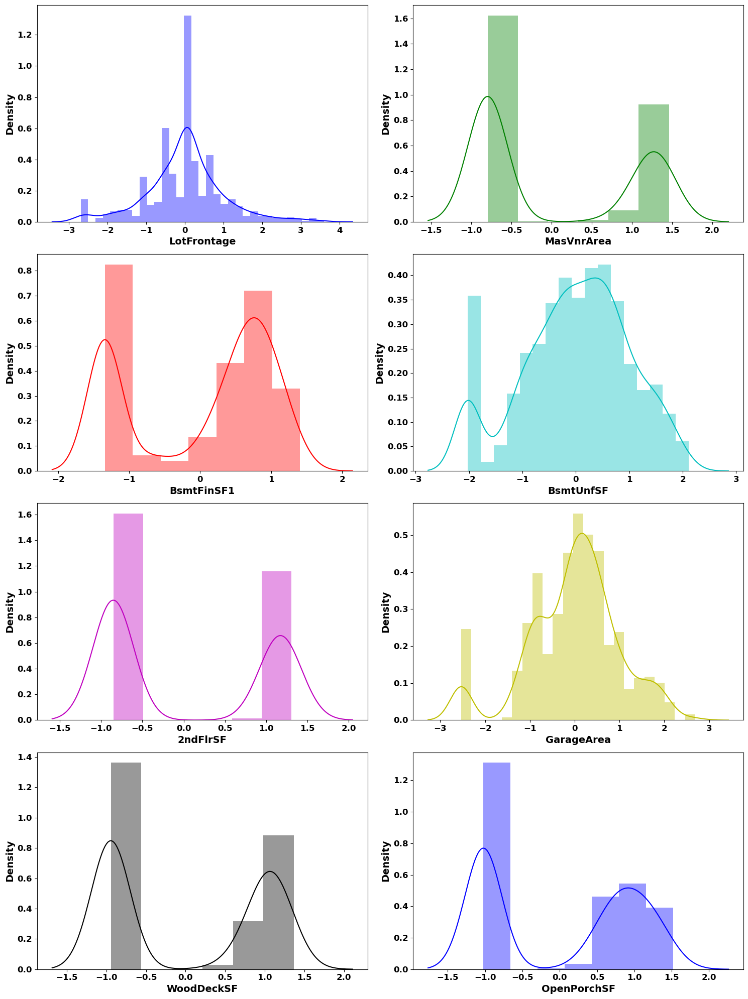

In [154]:
# Visually checking the distribution plots after scaling the data
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,20),facecolor='white')
sns.set_palette('rainbow_r')
plotnum=1
for col in x_tra:
    if plotnum<=8:
        plt.subplot(4,2,plotnum)
        sns.distplot(x[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

# Model Building

In [155]:
x.shape

(1089, 37)

In [156]:
y.shape

(1089,)

- **Starting with "LinearRegression" as the target variable is continuous data**

In [157]:
# Defining the required libraries

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score

lr=LinearRegression() # Defining instance for linearregression

# Finding the best random state value where training r2-score = testing r2-score

Random_State=[]
Training_r2_score=[]
Testing_r2_score=[]
Difference=[]

# Finding the random state value where training r2-score = testing r2-score

for i in range(0,1000):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lr.fit(x_train,y_train)
    pred_test=lr.predict(x_test)
    pred_train=lr.predict(x_train)
    
    if round(r2_score(y_train,pred_train)*100,1)==round(r2_score(y_test,pred_test)*100,1):
        Random_State.append(i)
        Training_r2_score.append(r2_score(y_train,pred_train)*100)
        Testing_r2_score.append(r2_score(y_test,pred_test)*100)
        Difference.append(abs((r2_score(y_test,pred_test)*100)-(r2_score(y_train,pred_train)*100)))

RS_table=pd.DataFrame({"Random State":Random_State,"Training R2 Score":Training_r2_score,"Testing R2 Score":Testing_r2_score,"Difference in R2 Score":Difference})
print("Table of random state values with training r2_score = testing r2_score")
RS_table.sort_values(by=["Difference in R2 Score"],ascending=True)

Table of random state values with training r2_score = testing r2_score


,Random State,Training R2 Score,Testing R2 Score,Difference in R2 Score
0,76,86.519804,86.515974,0.003829
5,800,86.382783,86.388065,0.005283
6,867,86.456925,86.464730,0.007805
4,594,86.423674,86.399254,0.024420
2,478,86.502422,86.473454,0.028968
3,563,86.527067,86.489396,0.037671
1,192,86.488914,86.542213,0.053299


#### Observations:
- **From the above table, as multple random states give same training and testing accuarcy scores, taking one of this  from the below code**

In [158]:
# Getting the best random state where training r2 score equal to testing r2 score
RSN=RS_table["Random State"][RS_table["Difference in R2 Score"]==RS_table["Difference in R2 Score"].min()]
BRS=np.array(RSN)[0]
BRS

76

#### Observation:
- **Considering random state=76 for the model building**

In [159]:
# Using the best random state and splitting the data
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=BRS)

In [160]:
# Training the model and checking  metrics with the fixed random state
lr.fit(x_train,y_train)
pred_test=lr.predict(x_test)
print("Model : Linear Regression")
print("R2 Score : ",r2_score(y_test,pred_test))
print("Mean Absolute Error(MAE) : ",mean_absolute_error(y_test,pred_test))
print("Mean Squared Error(MSE) : ",mean_squared_error(y_test,pred_test))
print("Root Mean Squared Error(RMSE) : ",np.sqrt(mean_squared_error(y_test,pred_test)))

Model : Linear Regression
R2 Score :  0.8651597418842483
Mean Absolute Error(MAE) :  17799.682312775694
Mean Squared Error(MSE) :  538696584.3679109
Root Mean Squared Error(RMSE) :  23209.83809439245


# Cross Validation for Linear Regression

In [161]:
pred_lr=lr.predict(x_test)
from sklearn.model_selection  import cross_val_score
lss=r2_score(y_test,pred_lr)

# Finding the optimized folds from Linear Regression where the cross validation score is same as model score

No_of_Folds=[]
CV_Score=[]
Model_Score=[]
Difference=[]

for j in range(2,11):
    lsscore=cross_val_score(lr,x,y,cv=j)
    lsc=lsscore.mean()
    No_of_Folds.append(j)
    CV_Score.append(lsc*100)
    Model_Score.append(lss*100)
    Difference.append(abs(lsc-lss))
CV_table=pd.DataFrame({"No of Folds":No_of_Folds,"Cross Validation R2 Score":CV_Score,"Model R2 Score":Model_Score,"Difference in R2 Score":Difference})  
print("Cross Validation table")
CV_table.sort_values(by=["Difference in R2 Score"],ascending=True)

Cross Validation table


,No of Folds,Cross Validation R2 Score,Model R2 Score,Difference in R2 Score
1,3,85.164052,86.515974,0.013519
8,10,85.070832,86.515974,0.014451
4,6,84.917091,86.515974,0.015989
3,5,84.891896,86.515974,0.016241
5,7,84.866221,86.515974,0.016498
2,4,84.852784,86.515974,0.016632
6,8,84.850012,86.515974,0.016660
7,9,84.795417,86.515974,0.017206
0,2,84.514045,86.515974,0.020019


#### Observations: 
- **Getting the no. folds where the delta is least between cross validation and model scores from the below code. In this case, selected CV=3 from the above table**

In [162]:
# Getting the best no. of folds where the least difference between cross validation score and model score
CVF=CV_table["No of Folds"][CV_table["Difference in R2 Score"]==CV_table["Difference in R2 Score"].min()]
BCV=np.array(CVF)[0]
BCV

3

In [163]:
# Using best CV value and checking the cross validation score again to compare with model score
lsscore_selected=cross_val_score(lr,x,y,cv=BCV).mean()
print("The CV r2 score is:",lsscore_selected*100,"\nThe model r2 score is:",lss*100)
print("Difference is:",lss-lsscore_selected)

The CV r2 score is: 85.1640517196786 
The model r2 score is: 86.51597418842482
Difference is: 0.013519224687462361


# Other Regression Algorithms

In [164]:
from sklearn.tree import DecisionTreeRegressor          # DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor       # KNeighborsRegressor
from sklearn.linear_model import SGDRegressor           # Gradient Descent Regressor
from sklearn.svm import SVR                             # Support Vector Regressor
from sklearn.linear_model import Lasso                  # Lasso Regressor
from sklearn.linear_model import Ridge                  # Ridge Regressor
from sklearn.linear_model import ElasticNet             # Elastic Net Regressor
from sklearn.ensemble import RandomForestRegressor      # RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor        # ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor  # GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor          # AdaBoostRegressor
from xgboost import XGBRegressor                        # XGBRegressor

# Defining the list with all Algorithms

models=[('DecisionTreeRegressor()',DecisionTreeRegressor()),('KNeighborsRegressor()',KNeighborsRegressor()),
        ('SGDRegressor()',SGDRegressor()),('SVR()',SVR()),('Lasso()',Lasso()),('Ridge()',Ridge()),
        ('ElasticNet()',ElasticNet()),('RandomForestRegressor()',RandomForestRegressor()),
        ('ExtraTreesRegressor()',ExtraTreesRegressor()),('GradientBoostingRegressor()',GradientBoostingRegressor()),
        ('AdaBoostRegressor()',AdaBoostRegressor()),('XGBRegressor()',XGBRegressor())]

# Defining empty lists
Model=[lr]
CV_Score=[lsscore_selected*100]
Model_Score=[lss*100]
Difference=[abs(lss-lsscore_selected)]
MAE=[mean_absolute_error(y_test,pred_lr)]
MSE=[mean_squared_error(y_test,pred_lr)]
RMSE=[np.sqrt(mean_squared_error(y_test,pred_lr))]

# Loop for all algorithms to train the model and for the cross validation
for model in models:
    model[1].fit(x_train,y_train)                             # Train the model
    pred_test=model[1].predict(x_test)                        # Predict Y values from the model using X test
    Model_Score.append(r2_score(y_test,pred_test)*100)        # Appending "R2 Score" to the list 
    MAE.append(mean_absolute_error(y_test,pred_test))         # Appending "MAE" to the list 
    MSE.append(mean_squared_error(y_test,pred_test))          # Appending "MSE" to the list 
    RMSE.append(np.sqrt(mean_squared_error(y_test,pred_test)))# Appending "RMSE" to the list 
    
    score=cross_val_score(model[1],x,y,cv=BCV).mean()         # Cross Validation mean score calculation
    CV_Score.append(score*100)                                # Appending "cross validation score" to the list
    Difference.append(abs(r2_score(y_test,pred_test)-score)) # Appending "Difference b/w CV and model scores" to the list
    Model.append(model[0])                                    # Appending "Model" to the list

# Creating the dataframe with scores and the differences
score_table=pd.DataFrame({'Model':Model,'Model R2 Score':Model_Score,'Cross Validation R2 Score':CV_Score,'Difference in R2 Score':Difference,'MAE':MAE,'MSE':MSE,'RMSE':RMSE})
print("Table with performance of the models")
score_table[score_table["Difference in R2 Score"]<100].sort_values(by=["Difference in R2 Score"],ascending=True)  # sorting the score table using the difference

Table with performance of the models


,Model,Model R2 Score,Cross Validation R2 Score,Difference in R2 Score,MAE,MSE,RMSE
9,ExtraTreesRegressor(),85.051538,85.075834,0.000243,16994.802844,5.972019e+08,24437.714091
11,AdaBoostRegressor(),80.544974,80.483049,0.000619,21503.411184,7.772423e+08,27879.066471
2,KNeighborsRegressor(),80.221440,79.836669,0.003848,20479.301835,7.901678e+08,28109.923233
7,ElasticNet(),84.066605,83.681661,0.003849,18575.331044,6.365507e+08,25229.955886
4,SVR(),-4.773593,-5.242437,0.004688,46508.014892,4.185781e+09,64697.610585
...,...,...,...,...,...,...,...
5,Lasso(),86.516825,85.165001,0.013518,17798.793278,5.386626e+08,23209.106236
0,LinearRegression(),86.515974,85.164052,0.013519,17799.682313,5.386966e+08,23209.838094
8,RandomForestRegressor(),87.494459,85.849240,0.016452,15907.636927,4.996054e+08,22351.854905
12,XGBRegressor(),87.880527,85.679750,0.022008,17025.305763,4.841817e+08,22004.129535


In [165]:
# Getting the best model where the least difference between cross validation score and model score
BMS=score_table["Model"][score_table["Difference in R2 Score"]==score_table["Difference in R2 Score"].min()]
BM=np.array(BMS)[0]
BM  # Best Model

'ExtraTreesRegressor()'

#### Observations: 
- **Based on the comparison between model r2 score and cross validation scores for multiple models, I have considered "ExtraTreesRegressor()" is the best model as the difference in r2 score is least among all the models** 
- **In this case, best model is chosen based on scoring parameter: r2_score**
- **However, best model can change if I change scoring parameter to MSE or MAE or RMSE**
- **Hyper parameter tuning will be pefromed for "ExtraTreesRegressor()"**

# Hyper Parameter Tuning

In [166]:
from sklearn.model_selection import GridSearchCV

# Defining parameters for ExtraTreesRegressor

# Number of trees in Extra Tree
n_estimators = [50,100,200,300]
# Scoring criterion
criterion=["squared_error", "absolute_error", "friedman_mse"]
# Number of features to consider at every split
max_features = ['sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [None,2,3,4,5,7]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
parameters = {'n_estimators': n_estimators,
              'criterion':criterion,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

In [167]:
GCV=GridSearchCV(ExtraTreesRegressor(),parameters,cv=5,n_jobs=-1)  # Defining instance for GridSearchCV
GCV.fit(x_train,y_train)   # Apply GridSearchCV to train the model with all combination of parameters
GCV.best_params_   # printing the best parameters

{'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [168]:
# Training the model using best parameters from GridSearchCV and checking the metrics
ht_model=ExtraTreesRegressor(n_estimators=GCV.best_params_['n_estimators'],criterion=GCV.best_params_['criterion'],
                                    max_features=GCV.best_params_['max_features'],max_depth=GCV.best_params_['max_depth'],
                                    min_samples_split=GCV.best_params_['min_samples_split'],min_samples_leaf=GCV.best_params_['min_samples_leaf'])
ht_model.fit(x_train,y_train)
pred=ht_model.predict(x_test)

print("Model : ExtraTreesRegressor")
print("R2 Score : ",r2_score(y_test,pred))
print("Mean Absolute Error(MAE) : ",mean_absolute_error(y_test,pred))
print("Mean Squared Error(MSE) : ",mean_squared_error(y_test,pred))
print("Root Mean Squared Error(RMSE) : ",np.sqrt(mean_squared_error(y_test,pred)))

Model : ExtraTreesRegressor
R2 Score :  0.8669615273635047
Mean Absolute Error(MAE) :  16452.560665137615
Mean Squared Error(MSE) :  531498321.05247027
Root Mean Squared Error(RMSE) :  23054.24735384936


In [169]:
score=cross_val_score(ht_model,x,y,cv=BCV).mean()
print("The CV R2 score is:",score*100,"\nThe model R2 score is:",r2_score(y_test,pred)*100)
print("Difference is:",r2_score(y_test,pred)-score)

The CV R2 score is: 84.97777157693895 
The model R2 score is: 86.69615273635047
Difference is: 0.017183811594115306


#### Observations for ExtraTreesRegressor: 
- **Hyper Parameter Tuned model: The difference between Cross Validation Score and model score is   0.01718**
- **Model with default parameters: The difference between Cross Validation Score and model score is 0.000243**
- **As the delta between model score and cross validation score is least in the model with default parameters, considering the model with default parameters as the best model for saving**

# Save Final Model

In [171]:
import pickle
filename='House-Price-Prediction.pkl'
pickle.dump(models[8][1], open(filename,'wb'))  # saving the Hyper Parameter Tuned ExtraTreeRegressor model

# Importing test.csv

In [172]:
# Reading csv file
dft=pd.read_csv("test.csv")
dft.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [173]:
# Checking the dimensions of the dataset
print('No. of Rows :',dft.shape[0])
print('No. of Columns :', dft.shape[1])

No. of Rows : 292
No. of Columns : 80


In [174]:
# Sorting the columns based on the datatype
dft.columns.to_series().groupby(dft.dtypes).groups

{int64: ['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'], float64: ['LotFrontage', 'MasVnrArea', 'GarageYrBlt', 'PoolQC'], object: ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageTyp

In [175]:
# Getting count of different datatypes of the dataframe
dft.dtypes.value_counts()

object     42
int64      34
float64     4
dtype: int64

## Data Integrity Check

#### Checking for the presense of any whitespaces, '?', 'NA', '-' in the dataset

In [176]:
dft.isin(['NA','N/A','-',' ','?',' ?']).sum().any()

False

##### Observations:
- **No White spaces, 'NA', 'N/A', '-', '?', ' ?' present in the dataframe**

#### Duplicate Values Check

In [177]:
dft.duplicated().sum()

0

##### Observations: 
- **No duplicate values present in the test dataframe**

##### Dropping columns 'PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu','Id','Utilities','MSSubClass','MSZoning','Street', 'LandContour', 'LotConfig','LandSlope','Condition1','Condition2','BldgType','OverallCond','Exterior1st','Exterior2nd','MasVnrType','ExterCond','BsmtCond','BsmtFinType1','BsmtFinType2','BsmtFinSF2','Heating','LowQualFinSF','BsmtHalfBath','KitchenAbvGr','Functional','GarageQual','GarageCond','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold','SaleType','TotalBsmtSF','1stFlrSF','GarageYrBlt' similar to train data as test dataset will be used to predcit target using the model trained from train dataset, hence no. of columns should be same between train and test datasets

In [178]:
dft.drop(['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu','Id','Utilities','MSSubClass','MSZoning','Street',
          'LandContour','LotConfig','LandSlope','Condition1','Condition2','BldgType','OverallCond','Exterior1st','Exterior2nd',
          'MasVnrType','ExterCond','BsmtCond','BsmtFinType1','BsmtFinType2','BsmtFinSF2','Heating','LowQualFinSF',
          'BsmtHalfBath','KitchenAbvGr','Functional','GarageQual','GarageCond','EnclosedPorch','3SsnPorch','ScreenPorch',
          'PoolArea','MiscVal','MoSold','YrSold','SaleType','TotalBsmtSF','1stFlrSF','GarageYrBlt'],axis=1,inplace=True)
dft.head(5)

,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleCondition
0,86.0,14157,IR1,StoneBr,1Story,9,2005,2006,Hip,CompShg,200.0,Gd,PConc,Ex,Gd,1249,673,Ex,Y,SBrkr,0,1922,1,2,0,3,Gd,8,1,Attchd,Fin,3,676,Y,178,51,Normal
1,NaN,5814,IR1,StoneBr,1Story,8,1984,1984,Gable,CompShg,0.0,Gd,CBlock,Gd,Av,1036,184,Gd,Y,SBrkr,0,1360,1,1,0,1,Gd,4,1,Attchd,RFn,2,565,Y,63,0,Abnorml
2,NaN,11838,Reg,CollgCr,1Story,8,2001,2001,Hip,CompShg,0.0,Gd,PConc,Gd,Av,0,1753,Ex,Y,SBrkr,0,1788,0,2,0,3,Ex,7,1,Attchd,RFn,2,522,Y,202,151,Normal
3,75.0,12000,Reg,Crawfor,2Story,7,1941,1950,Gable,CompShg,0.0,TA,CBlock,TA,No,275,429,Ex,Y,SBrkr,704,1564,0,1,1,3,Fa,7,1,Attchd,Unf,1,234,Y,0,0,Normal
4,86.0,14598,IR1,Somerst,2Story,6,2007,2007,Gable,CompShg,74.0,Gd,PConc,Gd,Mn,0,894,Ex,Y,SBrkr,1039,1933,0,2,1,4,Gd,9,1,BuiltIn,Fin,3,668,Y,100,18,Normal


In [179]:
dft.shape

(292, 37)

#### Null Values Handling

In [180]:
dft.isnull().sum().sum() # Checking the sum of null values for all columns

95

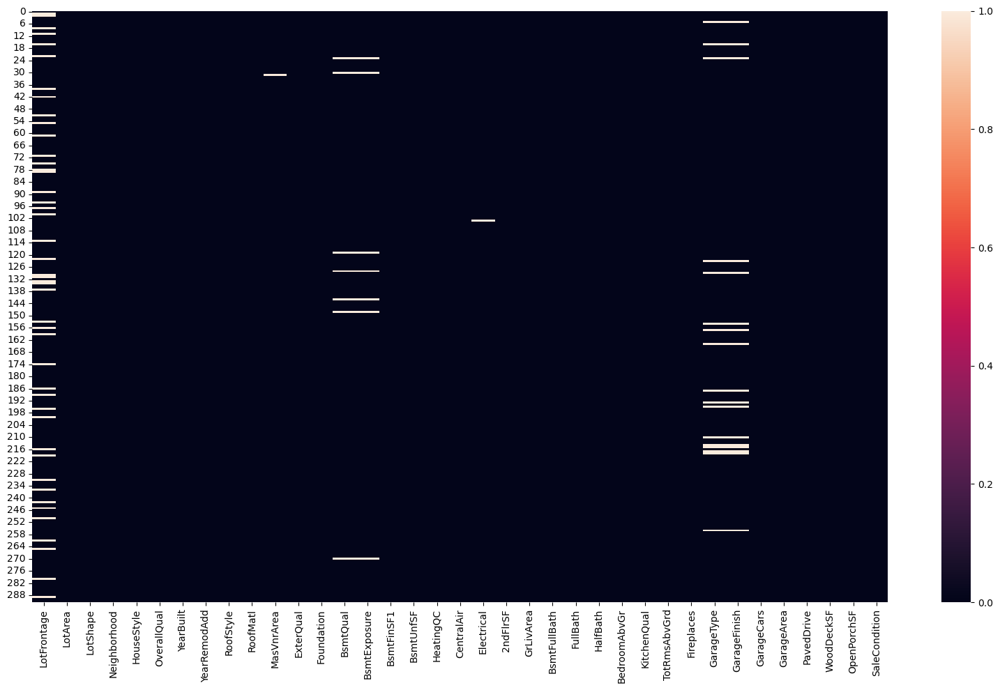

In [181]:
sns.set_palette('coolwarm_r')
plt.figure(figsize = (16,10))
sns.heatmap(dft.isnull())
plt.show()

In [184]:
### Null Values Handling

#Finding the percentage of data missing from the dataset
pd.set_option('display.max_rows',None) 
missing_values = dft.isnull().sum()
percentage_missing_values =round((missing_values/len(dft))*100,1)
dtyp=dft.dtypes
null_values=pd.concat([dtyp,missing_values, percentage_missing_values], axis =1, keys =['Data Type','Missing Values', '% Missing data'])
print("Missing Values")
dft_null=null_values.sort_values(by=["% Missing data"],ascending=False)
dft_null=dft_null.reset_index(drop=False)
dft_null

Missing Values


,index,Data Type,Missing Values,% Missing data
0,LotFrontage,float64,45,15.4
1,GarageFinish,object,17,5.8
2,GarageType,object,17,5.8
3,BsmtExposure,object,7,2.4
4,BsmtQual,object,7,2.4
5,MasVnrArea,float64,1,0.3
6,Electrical,object,1,0.3
7,GarageCars,int64,0,0.0
8,GarageArea,int64,0,0.0
9,PavedDrive,object,0,0.0


#### Observation:
- **Null values are present in 7 columns out of 37 columns**
- **I will use 'mode' to replace null values for categorical variables and 'median' to replace null values for numerical variables.**

##### Missing Values Imputation

In [186]:
# Segregating colums with null values based on the datatype
dft_null_cat=['GarageFinish','GarageType','BsmtExposure','BsmtQual','Electrical']
dft_null_num=['LotFrontage','MasVnrArea']

In [187]:
# Filling null values of columns with categorical data with first value of 'mode'
for i in dft_null_cat:
    if (dft[i].dtype=='O' and dft[i].isnull().sum()!=0):
        dft[i]=dft[i].fillna(dft[i].mode()[0])

In [188]:
# Filling null values of columns with numerical data with 'median' as 'mean' can be sensitive to outliers
for i in dft_null_num:
    if (dft[i].dtype=='float64' and dft[i].isnull().sum()!=0):
        dft[i]=dft[i].fillna(dft[i].median())

In [190]:
print(dft.isnull().sum().sum())

0


#### Observations:
- **No null values in the dataframe after imputation**

In [191]:
dft.head(5)

,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleCondition
0,86.0,14157,IR1,StoneBr,1Story,9,2005,2006,Hip,CompShg,200.0,Gd,PConc,Ex,Gd,1249,673,Ex,Y,SBrkr,0,1922,1,2,0,3,Gd,8,1,Attchd,Fin,3,676,Y,178,51,Normal
1,65.0,5814,IR1,StoneBr,1Story,8,1984,1984,Gable,CompShg,0.0,Gd,CBlock,Gd,Av,1036,184,Gd,Y,SBrkr,0,1360,1,1,0,1,Gd,4,1,Attchd,RFn,2,565,Y,63,0,Abnorml
2,65.0,11838,Reg,CollgCr,1Story,8,2001,2001,Hip,CompShg,0.0,Gd,PConc,Gd,Av,0,1753,Ex,Y,SBrkr,0,1788,0,2,0,3,Ex,7,1,Attchd,RFn,2,522,Y,202,151,Normal
3,75.0,12000,Reg,Crawfor,2Story,7,1941,1950,Gable,CompShg,0.0,TA,CBlock,TA,No,275,429,Ex,Y,SBrkr,704,1564,0,1,1,3,Fa,7,1,Attchd,Unf,1,234,Y,0,0,Normal
4,86.0,14598,IR1,Somerst,2Story,6,2007,2007,Gable,CompShg,74.0,Gd,PConc,Gd,Mn,0,894,Ex,Y,SBrkr,1039,1933,0,2,1,4,Gd,9,1,BuiltIn,Fin,3,668,Y,100,18,Normal


## Encoding of categorical features of test data

Using Ordinal Encoder to encode the data

In [192]:
# Sorting the columns based on the datatype
dft.columns.to_series().groupby(dft.dtypes).groups

{int64: ['LotArea', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtUnfSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF'], float64: ['LotFrontage', 'MasVnrArea'], object: ['LotShape', 'Neighborhood', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'ExterQual', 'Foundation', 'BsmtQual', 'BsmtExposure', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'GarageType', 'GarageFinish', 'PavedDrive', 'SaleCondition']}

In [194]:
dft_categorical=['LotShape', 'Neighborhood', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'ExterQual', 'Foundation', 'BsmtQual', 
                 'BsmtExposure', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'GarageType', 'GarageFinish', 
                 'PavedDrive', 'SaleCondition']

In [195]:
# Using Ordinal Encoder on categorical variable
from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()
for i in dft_categorical:
    dft[i] = enc.fit_transform(dft[i].values.reshape(-1,1))
dft.head()

,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleCondition
0,86.0,14157,0.0,21.0,2.0,9,2005,2006,3.0,0.0,200.0,2.0,2.0,0.0,1.0,1249,673,0.0,1.0,3.0,0,1922,1,2,0,3,2.0,8,1,1.0,0.0,3,676,2.0,178,51,2.0
1,65.0,5814,0.0,21.0,2.0,8,1984,1984,1.0,0.0,0.0,2.0,1.0,2.0,0.0,1036,184,2.0,1.0,3.0,0,1360,1,1,0,1,2.0,4,1,1.0,1.0,2,565,2.0,63,0,0.0
2,65.0,11838,3.0,4.0,2.0,8,2001,2001,3.0,0.0,0.0,2.0,2.0,2.0,0.0,0,1753,0.0,1.0,3.0,0,1788,0,2,0,3,0.0,7,1,1.0,1.0,2,522,2.0,202,151,2.0
3,75.0,12000,3.0,5.0,5.0,7,1941,1950,1.0,0.0,0.0,3.0,1.0,3.0,3.0,275,429,0.0,1.0,3.0,704,1564,0,1,1,3,1.0,7,1,1.0,2.0,1,234,2.0,0,0,2.0
4,86.0,14598,0.0,20.0,5.0,6,2007,2007,1.0,0.0,74.0,2.0,2.0,2.0,2.0,0,894,0.0,1.0,3.0,1039,1933,0,2,1,4,2.0,9,1,3.0,0.0,3,668,2.0,100,18,2.0


In [196]:
dft.shape

(292, 37)

# Prediction of test dataset using final model

In [197]:
loaded_model=pickle.load(open('House-Price-Prediction.pkl','rb'))
pred = loaded_model.predict(dft)
prediction = [round(i) for i in pred]

In [198]:
loaded_model.score(dft,pred)*100

100.0

In [203]:
test_data_prediction=pd.DataFrame({"Predicted_SalePrice":prediction})
test_data_prediction.head(10)

,Predicted_SalePrice
0,319649
1,314501
2,309243
3,321358
4,312720
5,306367
6,316216
7,318126
8,316142
9,321269


In [204]:
final_test_data = pd.concat([dft, test_data_prediction], axis=1)
final_test_data.head()

,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,HeatingQC,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,SaleCondition,Predicted_SalePrice
0,86.0,14157,0.0,21.0,2.0,9,2005,2006,3.0,0.0,200.0,2.0,2.0,0.0,1.0,1249,673,0.0,1.0,3.0,0,1922,1,2,0,3,2.0,8,1,1.0,0.0,3,676,2.0,178,51,2.0,319649
1,65.0,5814,0.0,21.0,2.0,8,1984,1984,1.0,0.0,0.0,2.0,1.0,2.0,0.0,1036,184,2.0,1.0,3.0,0,1360,1,1,0,1,2.0,4,1,1.0,1.0,2,565,2.0,63,0,0.0,314501
2,65.0,11838,3.0,4.0,2.0,8,2001,2001,3.0,0.0,0.0,2.0,2.0,2.0,0.0,0,1753,0.0,1.0,3.0,0,1788,0,2,0,3,0.0,7,1,1.0,1.0,2,522,2.0,202,151,2.0,309243
3,75.0,12000,3.0,5.0,5.0,7,1941,1950,1.0,0.0,0.0,3.0,1.0,3.0,3.0,275,429,0.0,1.0,3.0,704,1564,0,1,1,3,1.0,7,1,1.0,2.0,1,234,2.0,0,0,2.0,321358
4,86.0,14598,0.0,20.0,5.0,6,2007,2007,1.0,0.0,74.0,2.0,2.0,2.0,2.0,0,894,0.0,1.0,3.0,1039,1933,0,2,1,4,2.0,9,1,3.0,0.0,3,668,2.0,100,18,2.0,312720
